In [1]:
import sys
sys.path.append("../..")
#sys.path.append("C:/Users/Fabian/gempy/")
import gempy as gp

%matplotlib inline
import pymc
import numpy as np
import math

from IPython.core.display import Image

from pymc.Matplot import plot
from pymc import graph

from IPython.core.pylabtools import figsize
figsize(15, 6)

import scipy.optimize as sop
import scipy.stats as stats
from scipy.signal import argrelextrema

import matplotlib.mlab as mlab
from matplotlib import pyplot as plt

import importlib

from operator import itemgetter

from mpl_toolkits.mplot3d import Axes3D

from gempy import Topology

import vtk
try:
    import evtk
except:
    None
from scipy.interpolate import griddata

In [46]:
# Importing the data from csv files and setting extent and resolution
geo_data = gp.create_data([0,2000,0,2000,0,2000],[ 50,50,50],
                         path_f = "Fab_ResModel_Foliations.csv",
                         path_i = "Fab_ResModel_Points2.csv")

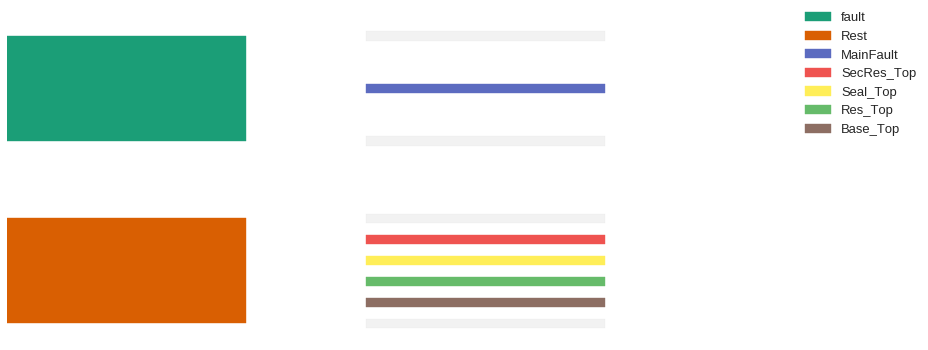

In [47]:
gp.set_series(geo_data, {"fault":'MainFault', 
                      "Rest":('Base_Top', 'Res_Top', 'Seal_Top', 'SecRes_Top')},
                       order_series = ["fault","Rest",], order_formations=['MainFault', 
                                         'SecRes_Top', 'Seal_Top', 'Res_Top','Base_Top',
                                         ]) #for Fab_Test

In [48]:
geo_data.interface_drop(52)

geo_data.interface_drop(37)

In [51]:
geo_data.interfaces # 52, 37

,X,Y,Z,formation,series,order_series,isFault,formation number,annotations
0,900,1000,1500,MainFault,fault,1,True,1,"${\bf{x}}_{\alpha \,{\bf{1}},0}$"
1,700,1000,900,MainFault,fault,1,True,1,"${\bf{x}}_{\alpha \,{\bf{1}},1}$"
2,800,1000,1200,MainFault,fault,1,True,1,"${\bf{x}}_{\alpha \,{\bf{1}},2}$"
3,500,1000,300,MainFault,fault,1,True,1,"${\bf{x}}_{\alpha \,{\bf{1}},3}$"
4,600,1000,600,MainFault,fault,1,True,1,"${\bf{x}}_{\alpha \,{\bf{1}},4}$"
5,0,1000,1500,SecRes_Top,Rest,2,False,2,"${\bf{x}}_{\alpha \,{\bf{2}},0}$"
6,300,1000,1400,SecRes_Top,Rest,2,False,2,"${\bf{x}}_{\alpha \,{\bf{2}},1}$"
7,600,1000,1300,SecRes_Top,Rest,2,False,2,"${\bf{x}}_{\alpha \,{\bf{2}},2}$"
8,1100,1000,1400,SecRes_Top,Rest,2,False,2,"${\bf{x}}_{\alpha \,{\bf{2}},3}$"
9,1400,1000,1350,SecRes_Top,Rest,2,False,2,"${\bf{x}}_{\alpha \,{\bf{2}},4}$"


In [52]:
# Creating a row label 'fault side' to distinguish between footwall (FW) and hanging wall (HW)
geo_data.interfaces['fault side'] = 'nan'

In [53]:
HW_border = 1300 # distance of middle of fault (border HW/FW) from footwall border of model
                # (X = 2000 - 1300 = 700)
nonfault_cond = geo_data.interfaces['formation'] != 'MainFault'
fault_cond = geo_data.interfaces['formation'] == 'MainFault'

fw_x_cond = geo_data.interfaces['X'] > (geo_data.extent[:2][1] - HW_border) # condition for FW points

hw_x_cond = geo_data.interfaces['X'] < (geo_data.extent[:2][1] - HW_border) # condition for HW points

geo_data.interfaces.set_value(fw_x_cond,'fault side','footwall') # setting FW
geo_data.interfaces.set_value(hw_x_cond,'fault side','hanging wall') #setting HW
geo_data.interfaces.set_value(fault_cond,'fault side','nan'); # reverting fault points to 'nan'

In [7]:
#geo_data.set_formation_number(['MainFault','Res_Base', 'Res_Top', 'Seal_Top', 'SecondaryReservoir'])

In [8]:
#gp.data_to_pickle(geo_data, 'BasicFault') #saving data to pickle

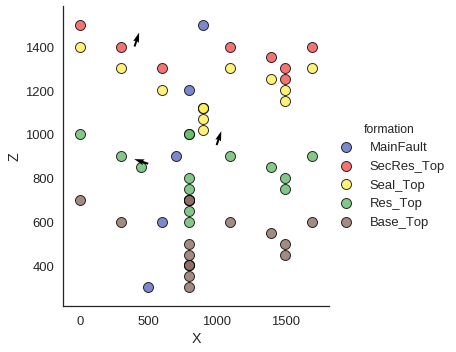

In [9]:
gp.plot_data(geo_data)

In [45]:
gp.plot_data_3D(geo_data)

In [54]:
# INTERPOLATION
interp_data = gp.InterpolatorInput(geo_data, 
                                   u_grade = [3, 3],
                                   compile_theano=True, dtype ='float64')

Level of Optimization:  fast_run
Device:  cpu
Precision:  float64


In [55]:
# COMPUTATION OF THE MODEL
lith_sol, fault_sol = gp.compute_model(interp_data)

In [12]:
array_shapeholder = np.zeros_like(lith_sol)

In [56]:
# CREATING SURFACES FOR LAYERS
base_surf, base_surf_simp = gp.get_surfaces(interp_data = interp_data, potential_lith=lith_sol[1], potential_fault=fault_sol[1], n_formation = (interp_data.get_formation_number()['Base_Top']))
res_surf, res_surf_simp = gp.get_surfaces(interp_data = interp_data, potential_lith=lith_sol[1], potential_fault=fault_sol[1], n_formation = (interp_data.get_formation_number()['Res_Top']))
seal_surf, seal_surf_simp = gp.get_surfaces(interp_data = interp_data, potential_lith=lith_sol[1], potential_fault=fault_sol[1], n_formation = (interp_data.get_formation_number()['Seal_Top']))
sec_res_surf, sec_res_surf_simp = gp.get_surfaces(interp_data = interp_data, potential_lith=lith_sol[1], potential_fault=fault_sol[1], n_formation = (interp_data.get_formation_number()['SecRes_Top']))

In [59]:
gp.plot_surfaces_3D_real_time(interp_data, [base_surf, sec_res_surf, seal_surf, res_surf], 
                    [base_surf_simp, sec_res_surf_simp, seal_surf_simp, res_surf_simp], plot_data=True)

In [ ]:
gp.plot_surfaces_3D(geo_data, [res_surf], [res_surf_simp])

In [53]:
interp_data.get_formation_number()

{'Base_Top': 5,
 'DefaultBasement': 0,
 'MainFault': 1,
 'Res_Top': 4,
 'Seal_Top': 3,
 'SecRes_Top': 2}

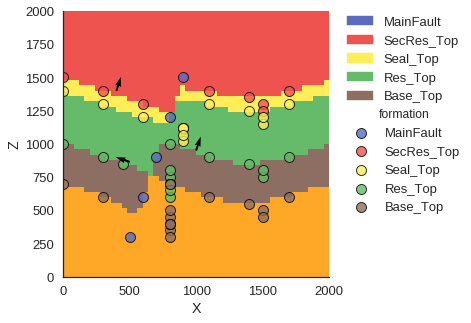

In [58]:
#matplotlib notebook
%matplotlib inline
gp.plot_section(geo_data, lith_sol[0], 25, plot_data=1)

In [15]:
resolution = geo_data.resolution[1] #resolution, standard: 50
model_size = geo_data.extent[:2][1] # 'real' model extent, here: 2000 m - cubic (what if not cubic?)
scale_factor = (model_size/resolution) # scale factor used for calculating voxel volumes in [m]
                                        # here: 2000/50 = 40
rescale_f = interp_data.rescaling_factor # rescaling factor from geo_data to interp_data

minmax_buffer = True # buffer around local min and max values [on/off] - not used atm

In [16]:
# FUNCTION TO FIND ANTICLINAL SPILL POINT AND CROSS-FAULT LEAK POINT

    #@staticmethod # possibly use to find saddle points!
    #def squared_euclidean_distances(x_1, x_2):
    #    """
    #    Compute the euclidian distances in 3D between all the points in x_1 and x_2
    #    Args:
    #        x_1 (theano.tensor.matrix): shape n_points x number dimension
    #        x_2 (theano.tensor.matrix): shape n_points x number dimension
#
    #    Returns:
    #        theano.tensor.matrix: Distancse matrix. shape n_points x n_points
    #    """
#
    #    # T.maximum avoid negative numbers increasing stability
    #    sqd = T.sqrt(T.maximum(
    #        (x_1**2).sum(1).reshape((x_1.shape[0], 1)) +
    #        (x_2**2).sum(1).reshape((1, x_2.shape[0])) -
    #        2 * x_1.dot(x_2.T), 0
    #    ))
#
    #    return sqd

def spill_leak_P(interp_data, res_surf, lith, fault):    
    
    # creating a grid with uniform distances for vertices of the reservoir surface
    grid_x, grid_y = np.meshgrid(np.unique(interp_data.geo_data_res.grid.grid[:, 0]),
                                 np.unique(interp_data.geo_data_res.grid.grid[:, 1]))

    grid_x=(grid_x*rescale_f)-(np.min(grid_x)*rescale_f)
    grid_y=(grid_y*rescale_f)-(np.min(grid_y)*rescale_f)
    
    # We interpolate the location of the surface in z for the XY of the grid
    grid_z0 = griddata(res_surf[:,:2], res_surf[:,2],
                      (grid_x, grid_y), method='linear')
    
    # order of values that serve to find relative extrema (min/max)
    rel_order_maxX = 5
    rel_order_maxY = 10
    rel_order_minX = 5
    rel_order_minY = 5
    
    # check grid_z0 for max and min in directions x and y
    # direction X
    minX1,minX2 = argrelextrema(grid_z0,np.less,order=rel_order_minX,axis=1)
    maxX1,maxX2 = argrelextrema(grid_z0,np.greater,order=rel_order_maxX,axis=1)
    grid_minX = np.zeros_like(grid_z0)
    grid_minX[minX1,minX2]=1           # grid of min in X
    grid_maxX = np.zeros_like(grid_z0)
    grid_maxX[maxX1,maxX2]=1           # grid of max in X
    
    #direction Y
    minY1,minY2 = argrelextrema(grid_z0,np.less,order=rel_order_minY,axis=0)
    maxY1,maxY2 = argrelextrema(grid_z0,np.greater,order=rel_order_maxY,axis=0)
    grid_minY = np.zeros_like(grid_z0)
    grid_minY[minY1,minY2]=1           # grid of min in Y
    grid_maxY = np.zeros_like(grid_z0)
    grid_maxY[maxY1,maxY2]=1           # grid of max in Y
    
    # fault leak line: defining line of juxtaposition, point of cross-fault leakage to be found on it
    # check for minima line that is on hanging wall side compared to max contact of layer top with fault
    fault_max_line_bool = np.copy(grid_maxX)
    fault_max_line = fault_max_line_bool.argmax(axis=1)
    fault_max = np.max(fault_max_line) # max of fault-layer contact as threshold        
    fleak_line = np.copy(grid_minX).astype(int)
    fleak_line[:,fault_max:]=0 # only returns minima at hanging wall side
    
    # minmax buffering - not used atm
    # supposed to set neighboring values of min and max to min and max respectively, too 
    if minmax_buffer:
        minXroll1 = np.logical_or(grid_minX,np.roll(grid_minX,1, axis=0))
        minXroll1[:,:fault_max] = 0
        minXroll2 = np.logical_or(grid_minX,np.roll(grid_minX,-1, axis=0))
        minXroll2[:,:fault_max] = 0
        minXbuffer = np.logical_or(minXroll1, minXroll2)
        grid_minX = np.logical_or(grid_minX, minXbuffer)
        #grid_maxX = np.logical_or(grid_maxX,np.roll(grid_maxX,1))
        #grid_maxX = np.logical_or(grid_maxX,np.roll(grid_maxX,-1))
        #grid_minY = np.logical_or(grid_minY,np.roll(grid_minY,1))
        #grid_minY = np.logical_or(grid_minY,np.roll(grid_minY,-1))
        grid_maxY = np.logical_or(grid_maxY,np.roll(grid_maxY,1, axis=1))
        grid_maxY = np.logical_or(grid_maxY,np.roll(grid_maxY,-1, axis=1))
    
    #check for saddle points
    saddle_p1 = np.logical_and(grid_minX,grid_maxY)
    saddle_p2 = np.logical_and(grid_minY,grid_maxX)
    saddle_p_all= np.logical_or(saddle_p1, saddle_p2)
    
    # this should find saddle points relative to X and Y directions
    # problem of finding other points in a rotated direction?
    
    #fleak_line_z0 = grid_z0[fleak_line]
    #leak_max = fleak_line==np.nanargmax(fleak_line_z0)
    #print(np.nanargmax(fleak_line_z0))
    ### NOT FINISHED: DEFINE LEAK POINT OVER LEAK LINE MAX?
    
    # distinguish anticlinal spill points from fault leak points:
    pot_leak_points = np.logical_and(fleak_line,saddle_p_all)    
    pot_spill_points = saddle_p_all - pot_leak_points    # substracting leak bool from saddle point bool 
                                                    # to get spill point bool    
    # leak and spill point 3D coordinates
    # LEAK POINT
    #if juxtaposition_over_seal(lith, fault) == True: #check for juxtaposition with layers above seal (due to offset)
    
    pot_leak_Xcoord = grid_x[pot_leak_points]
    pot_leak_Ycoord = grid_y[pot_leak_points]
    pot_leak_Zcoord = grid_z0[pot_leak_points]    
    pot_leak_3Dcoord = np.array(list(zip(pot_leak_Xcoord, pot_leak_Ycoord, pot_leak_Zcoord)))
        
    if pot_leak_3Dcoord.size == 0:
        fault_leak_3Dcoord = np.array([]) # if no leak coordinates found, set to empty array
    else:
        max_leak_pos = pot_leak_3Dcoord[:,2].argmax(axis=0)
        fault_leak_3Dcoord = pot_leak_3Dcoord[max_leak_pos,:] # max is LP
        
    # SPILL POINT
    pot_spill_Xcoord = grid_x[pot_spill_points]
    pot_spill_Ycoord = grid_y[pot_spill_points]
    pot_spill_Zcoord = grid_z0[pot_spill_points]    
    pot_spill_3Dcoord = np.array(list(zip(pot_spill_Xcoord, pot_spill_Ycoord, pot_spill_Zcoord)))
    
    if pot_spill_3Dcoord.size == 0:
        anticline_spill_3Dcoord = np.array([]) # if no leak coordinates found, set to empty array
    else:
        max_spill_pos = pot_spill_3Dcoord[:,2].argmax(axis=0)
        anticline_spill_3Dcoord = pot_spill_3Dcoord[max_spill_pos,:] # max is SP
        
    #print('SP',anticline_spill_3Dcoord)
    #print('LP',fault_leak_3Dcoord)
    
    # PLOTTING (for visualization and checking)
    # plot of min/max bools and all potential LPs(+) and SPs(x):
    if True:
        figsize(15,6)
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        #ax.scatter(grid_x, grid_y, grid_z0, c="b", alpha = 0.1)
        ax.scatter(grid_x, grid_y, grid_minY, c="b", alpha = 0.1)
        ax.scatter(grid_x, grid_y, grid_maxY, c="r", alpha = 0.1)
        ax.scatter(grid_x, grid_y, grid_minX, c="b", alpha = 0.1)
        ax.scatter(grid_x, grid_y, grid_maxX, c="r", alpha = 0.1)
        ax.scatter(grid_x, grid_y, pot_spill_points, c="black", alpha = 1, marker='x', s = 250)
        ax.scatter(grid_x, grid_y, pot_leak_points, c="black", alpha = 1, marker='+', s = 250)
        #ax.scatter(grid_x, grid_y, fleak_line, c="b", alpha = 1, marker='+', s= 250)
        #ax.scatter(grid_x, grid_y, leak_max[2], c="g", alpha = 1, marker='+', s= 250)
        
        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')
        
        plt.show()
    
    # plot of reservoir top surface and position of all potential LPs(+) and SPs(x):
    plot_spill_leak(res_surf, pot_spill_points, anticline_spill_3Dcoord, fault_leak_3Dcoord, grid_x, grid_y, grid_z0)
    
    return anticline_spill_3Dcoord, fault_leak_3Dcoord

In [17]:
# LITHOLOGY BLOCK MASKING FUNCTIONS

# Masking function that confines to voxels which are part fo the reservoir formation,
# in the footwall side and above the z-horizontal defined by the spill or leak point
def res_mask(lith,fault, bottom_z, formation_nr):
    mask = np.ones_like(lith)
    mask[~formation_nr] = False
    mask[fault.astype(bool)] = False
    bottom_z = round((bottom_z/scale_factor)+0.5)
    mask = mask.reshape(50,50,50)
    mask[:,:,:bottom_z] = False
    mask = mask.reshape(125000,)
    return mask

# Function that sets all voxels of lith_block which are equal (or closest to) to the spill_z
# horizontal as belonging to the overlying seal 
# (the voxels is located on the border of reservoir and seal) (???):
#def set_spill_to_seal(geo_data, lith, max_z):
#    lith_spill = np.argmin(np.abs(geo_data.grid.grid[:, 2]-np.abs(max_z)))
#    bol_lith_spill = geo_data.grid.grid[:, 2] == geo_data.grid.grid[:, 2][lith_spill]
#    lith[bol_lith_spill] = 11 #for 11 instead of seal, to check - interp_data.get_formation_number()['Res_Top']
#    #print(np.unique(lith))
#    return lith
#        ### Not 100% sure if this is now always setting the right voxel to seal, but should!

# Masking that confines the volume to ONLY those reservoir traps (from res_mask)
# that are NOT connected to the borders of the model (open system)
# Traps defined as CLOSED systems
def topo_analysis(lith, fault, fault_seal):
    fig = plt.figure()
    traps = []
    # Padding of lith- and fault-block (creating border sections, formation number = 8)
    lith_pad = (np.pad(lith.reshape(50,50,50), 1, 'constant', constant_values = (8,8)))
    fault_pad = (np.pad(fault.reshape(50,50,50), 1, 'constant', constant_values = (8,8)))
    topo = Topology.Topology(lith_pad, fault_pad, 1)
    #G, centroids, labels_unique, lith_to_labels_lot, labels_to_lith_lot = gp.topology_compute(geo_data, lith_pad, fault_pad)
    #topo.draw_section(25)textst
    topo_block = topo.labels
    # Finding sections which are possible traps in the reservoir (formation number = 7)
    trap_keys = [int(k) for k in topo.lith_to_labels_lot["7"].keys()]
    pad_keys = [int(p) for p in topo.lith_to_labels_lot["8"].keys()]
    secres_nr = interp_data.get_formation_number()['Seal_Top']
    over_nr = interp_data.get_formation_number()['SecRes_Top']
    secres_keys = [int(j) for j in topo.lith_to_labels_lot["%s" % secres_nr].keys()]
    over_keys = [int(o) for o in topo.lith_to_labels_lot["%s" % over_nr].keys()]
    tot_over_keys = np.append(secres_keys, over_keys)
    bool_block = np.zeros_like(topo_block)
    # Check for each possible trap section, if it is connected to a border
    for tk in trap_keys:
        #print('Checking Section:', tk)
        juxta_counter = 0
        # Saving enclosed sections as traps
        if topo.check_adjacency(tk, pad_keys[0]) == False:
            if fault_seal == False:
                for ok in tot_over_keys:                    
                    if topo.check_adjacency(tk, ok) == True:
                        print('Trap section %s is juxtaposed to section %s' % (tk, ok))
                        juxta_counter += 1
                if juxta_counter == 0:
                    traps.append(tk)
                    print("Safe TRAP FOUND, section:", tk)
                else:
                    print('Trap %s is juxtaposed --> leaking' % tk)
            else:
                print("TRAP FOUND, section:", tk)
                traps.append(tk)
    if traps == []:
        print('No trap found! =(')
    else:
        for i in traps:
            # Creating a mask from the trap sections in the label block
            top_bool = topo_block == i
            bool_block[top_bool] = True
            ### Extra check for juxtaposition with layers above seal       
            #if topo.check_adjacency(i, over_keys[0]) == False and topo.check_adjacency(i, sec_res_keys[0]) == False:
            #    print('Trap sealed upwards.')
            #    top_bool = topo_block == i
            #    bool_block[top_bool] = True
            #else: 
            #    print("Juxtaposition, no trap sealing.")
    # Removing padding
    trap_mask = bool_block[1:-1,1:-1,1:-1]
    #plt.imshow(trap_mask[:,25,:].T, origin="lower")
    #plt.show()
    return trap_mask    

In [18]:
#def juxtaposition_over_seal(lith, fault):
#    G, centroids, labels_unique, lith_to_labels_lot, labels_to_lith_lot = gp.topology_compute(geo_data, lith, fault)
#    res_nr = interp_data.get_formation_number()['Base_Top']
#    secres_nr = interp_data.get_formation_number()['Seal_Top']
#    over_nr = interp_data.get_formation_number()['SecRes_Top']
#    res_keys = [int(k) for k in lith_to_labels_lot["%s" % res_nr].keys()]
#    secres_keys = [int(j) for j in lith_to_labels_lot["%s" % secres_nr].keys()]
#    over_keys = [int(o) for o in lith_to_labels_lot["%s" % over_nr].keys()]
#    tot_over_keys = np.append(secres_keys, over_keys)
#    #print(res_keys)
#    #print(tot_over_keys)
#    top_counter = 0
#    gp.plot_section(geo_data, lith, 0)
#    gp.topology_plot(geo_data, G, centroids)
#    for rk in res_keys:
#        print('Checking for juxtapositions with overlying permeable layers for section:', rk)
#        # Saving enclosed sections as traps
#        for ok in tot_over_keys:
#            if gp.topology_check_adjacency(G, rk, ok) == True:
#                if G.adj[rk][ok]['edge_type'] == 'fault':
#                    top_counter += 1
#                    print("Juxtaposition of reservoir formation found:", rk, ok)
#            else:
#                print("No juxtaposition found!")
#    if top_counter == 0:
#        return False
#    else:
#        return True

In [19]:
# MAIN FUNCTION: Calculation of maximum fill volume in reservoir traps

def max_trap_vol(interp_data, lith, fault, res_surface, fault_sealing):
    
    bottom_surface = np.ones_like(res_surface) # needed?   
    
    #if juxtaposition_over_seal(lith, fault) == True:
    #    if fault_sealing == False:
    #        print('Seal broken, no fault sealing, full leakage through overlying layers')
    #        trap_vol = 0
    #        final_trap_mask = np.zeros_like(lith)
    #        return trap_vol, lith, bottom_surface, final_trap_mask
    #    else:
    #        print('Juxtaposition, but fault sealing.')
    # calculate spill point
    spill_point, leak_point = spill_leak_P(interp_data, res_surface, lith, fault)
    #CHECK: ONLY CONTINUE IF SPILL POINT FOUND, ELSE RETURN ZERO TRAP VOLUME
    if spill_point.size == 0:
        spill_z = np.nan
        print('No SPILL POINT found!')
        trap_vol = 0
        final_trap_mask = np.zeros_like(lith)
        return trap_vol, lith, bottom_surface, final_trap_mask    
    else:
        print('SPILL POINT:',spill_point)
        spill_z = spill_point[2]
        #spill_z, spill_p, spill_min_line, spill_bottom = spill_point(res_surface)
        # calculate leak point
        if leak_point.size == 0:
            print('No LEAK POINT found! So FULL LEAKAGE assumed!')
            #leak_z = np.nan
            leak_z = 2000
        else:
            print('Leak Point:',leak_point)
            leak_z = leak_point[2]
        #leak_z, leak_p, leak_line, leak_bottom = leak_point(res_surface)
    
        #PLOTTING OF SPILL, LEAK AND BOTTOM POSSIBLE HERE:
        #plot_spill(res_surface, spill_min_line, spill_p)
        #plot_leak(res_surface, leak_line, leak_p)
        #plot_trap(res_surface, bottom_surface, spill_p, leak_p)
        #PRINTING OF SPILL, LEAK:
        #print('Spill_Z:', spill_z)
        #print('Leak_Z:', leak_z)
        
        # Check for "down-to" z-horizon, maximum depth of reservoir
        # Check for fault sealing and subsequent relevance of leak point
        max_z = np.nanmax([spill_z, leak_z])
        if fault_sealing == True:
            if max_z == spill_z:
                print("Spill point defines trap.")
                print("Fault is sealing. Down to spill.")
                #bottom_surface = spill_bottom
            else:
                print("Fault leak point above spill point.")
                max_z = spill_z
                print("...but fault sealing. Down to spill.")
                #bottom_surface = spill_bottom
        else:
            if max_z == spill_z:
                print("Spill point defines trap.")
                print("Fault is pathway. Down to spill.")
                #bottom_surface = spill_bottom
            else:
                print("Fault leak point above spill point.")
                print("Cross-fault leakage. Down to leak.")
                #bottom_surface = leak_bottom      
        
        #print('Max_Z:', max_z)
        
        res_nr = lith == interp_data.get_formation_number()['Base_Top']
        pre_trap_mask = res_mask(lith, fault, max_z, res_nr)
          
        # volume cells for counting
        vol_cells = 0      
        
        pre_trap_mask_bool = (pre_trap_mask == True)
        # Check if there is anaything in the reservoir mask at all
        if np.count_nonzero(pre_trap_mask_bool) == 0:
            print("No res_formation above max_z!")
            return 0, lith, bottom_surface, pre_trap_mask
        else:
            lith[pre_trap_mask_bool] = 7                           # setting reservoir above bottom on footwall side 
                                                                # (incl. outside trap) to formation value = 7  
            #if max_z == spill_z:
            #    lith = set_spill_to_seal(geo_data, lith, max_z)
            
            #test = lith.reshape(125000)                       
            #for i in range(len(test)):                         #to test pre-trap-masking volume
            #    if test[i] == 7:
            #        vol_cells +=1
            #res_vol = ((scale_factor)**3) * vol_cells 
            #print("VOLUME INCLUDING OUTSIDE TRAP:" ,res_vol)
            
            final_trap_mask = topo_analysis(lith, fault, fault_sealing)
            #lith[pre_trap_mask_bool] = 5
            lith[final_trap_mask] = 9                         # setting final trap to formation value = 9
            vol_cells = np.count_nonzero(final_trap_mask)
            
            #calulate volume from cells
            trap_vol = ((scale_factor)**3) * vol_cells 
            
            #return the maximum reservoir volume
            return trap_vol, lith, bottom_surface, final_trap_mask

In [20]:
# PLOTTING FUNCTIONS: Spill and leak point visualization
def plot_spill_leak(res_surface, pot_spills, spill_point, leak_point, grid_x, grid_y, grid_z0):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(grid_x, grid_y, grid_z0, c="b", alpha = 0.1)
    #ax.scatter(grid_x, grid_y,pot_spills, c="r", alpha = 1, marker='p', s = 250)
    if spill_point.size != 0:        
        ax.scatter(spill_point[0],spill_point[1],spill_point[2], c="black", alpha = 1, marker='x', s = 250)
    if leak_point.size != 0:        
        ax.scatter(leak_point[0],leak_point[1],leak_point[2], c="black", alpha = 1, marker='+', s = 250)
        
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    
    plt.show()

In [21]:
# Boolean conditions to find data points for each formation
base_top_cond = interp_data.geo_data_res.interfaces['formation'] == 'Base_Top'
res_top_cond = interp_data.geo_data_res.interfaces['formation'] == 'Res_Top'
seal_top_cond = interp_data.geo_data_res.interfaces['formation'] == 'Seal_Top'
secres_top_cond = interp_data.geo_data_res.interfaces['formation'] == 'SecRes_Top'

# Footwall and hanging wall conditions
footwall = interp_data.geo_data_res.interfaces['fault side'] == 'footwall'
hanging_wall = interp_data.geo_data_res.interfaces['fault side'] == 'hanging wall'

# Combining hanging wall and formation conditions
HW_secres_top = np.logical_and(secres_top_cond,hanging_wall)
HW_seal_top = np.logical_and(seal_top_cond,hanging_wall)
HW_res_top = np.logical_and(res_top_cond,hanging_wall)
HW_base_top = np.logical_and(base_top_cond,hanging_wall)

#interp_data.geo_data_res.interfaces.set_value(HW_secres_top,'Z',25)

In [22]:
# for setting up postional conditions to determine thicknesses and the like:
fw_th_point = 900 # distance of test point for thickness from footwall border of model 
                  # (e.g.: X = 2000 - 900 = 1100)
HW_border = 1300 # distance of middle of fault (border HW/FW) from footwall border of model
                # (X = 2000 - 1300 = 700)

# SAVING ORIGINAL Z-VALUES (so they are not overwritten and can be used a base for every iteration)    
sec_res_z = interp_data.geo_data_res.interfaces[interp_data.geo_data_res.interfaces['formation'] == 'SecRes_Top']['Z']
seal_z = interp_data.geo_data_res.interfaces[interp_data.geo_data_res.interfaces['formation'] == 'Seal_Top']['Z']
res_z = interp_data.geo_data_res.interfaces[interp_data.geo_data_res.interfaces['formation'] == 'Res_Top']['Z']
base_z = interp_data.geo_data_res.interfaces[interp_data.geo_data_res.interfaces['formation'] == 'Base_Top']['Z']

#res_len = len(interp_data.geo_data_res.interfaces[interp_data.geo_data_res.interfaces['formation'] == 'Res_Top']['Z'])    

# SETTING Z-UNCERTAINTIES FOR EACH LAYER TOP
std_secres_top = 10
std_seal_top = 20
std_res_top = 40
std_base_top = 60
z_unc_secres_top = pymc.Normal('z_unc_secres_top', 0, 1./np.square(std_secres_top/rescale_f))
z_unc_seal_top = pymc.Normal('z_unc_seal_top', 0, 1./np.square(std_seal_top/rescale_f))
z_unc_res_top = pymc.Normal('z_unc_res_top', 0, 1./np.square(std_res_top/rescale_f))
z_unc_base_top = pymc.Normal('z_unc_base_top', 0, 1./np.square(std_base_top/rescale_f))

# SETTING FAULT OFFSET UNCERTAINTY
std_offset = 75
offset_unc = pymc.Normal('offset_unc', 0/rescale_f, 1./np.square(std_offset/rescale_f))

# FAULT SEALING UNCERTAINTY (p = probability of success (1 = True); True = fault sealing)
fault_sealing = pymc.Bernoulli('fault_sealing_unc',p=.25)

In [23]:
import copy
# First we extract from our original intep_data object the numerical data that is necessary for the interpolation.
# geo_data_stoch is a pandas Dataframe

# This is the inital model so it has to be outside the stochastic frame
geo_data_stoch_init = copy.deepcopy(interp_data.geo_data_res)


In [24]:
geo_data_stoch = gp.get_data(geo_data_stoch_init, numeric=True)

In [25]:
# PYMC MODEL FUNCTIONS 

# Updating of interp_data points with new z-values resulting from z-positional uncertainty
# and including offset uncertainty:
@pymc.deterministic
def input_data(value=0, z_unc_secres_top = z_unc_secres_top, z_unc_seal_top=z_unc_seal_top, 
                  z_unc_res_top = z_unc_res_top, z_unc_base_top = z_unc_base_top, off_unc=offset_unc,
               geo_data_stoch_init = geo_data_stoch_init,):
    #print('CHECK0:', res_z)
    new_z_secres_top = sec_res_z + z_unc_secres_top
    new_z_seal_top = seal_z + z_unc_seal_top
    new_z_res_top = res_z + z_unc_res_top
    new_z_base_top = base_z + z_unc_base_top   
    
    # for offset uncertainty: additional change on hanging wall (HW): 
    HW_new_z_secres_top = new_z_secres_top + off_unc
    HW_new_z_seal_top = new_z_seal_top + off_unc
    HW_new_z_res_top = new_z_res_top + off_unc
    HW_new_z_base_top = new_z_base_top + off_unc
    
    print('Z variations top to bottom:', z_unc_secres_top*rescale_f, 
          z_unc_seal_top*rescale_f, z_unc_res_top*rescale_f, z_unc_base_top*rescale_f)
    
    print('Fault offset variation:', off_unc*rescale_f)
    #print('CHECK1:', new_z_res_top)
    #print('CHECK2:', HW_new_z_res_top)
    
    geo_data_stoch = gp.get_data(geo_data_stoch_init, numeric=True)
    
    # FOOTWALL UNCERTAINTY
    geo_data_stoch.loc['interfaces'].set_value(secres_top_cond,'Z',new_z_secres_top)
    geo_data_stoch.loc['interfaces'].set_value(seal_top_cond,'Z',new_z_seal_top)
    geo_data_stoch.loc['interfaces'].set_value(res_top_cond,'Z',new_z_res_top)
    geo_data_stoch.loc['interfaces'].set_value(base_top_cond,'Z',new_z_base_top)
    
    # HANGING WALL UNCERTAINTY (incl. offset)
    geo_data_stoch.loc['interfaces'].set_value(HW_secres_top,'Z',HW_new_z_secres_top)
    geo_data_stoch.loc['interfaces'].set_value(HW_seal_top,'Z',HW_new_z_seal_top)
    geo_data_stoch.loc['interfaces'].set_value(HW_res_top,'Z',HW_new_z_res_top)
    geo_data_stoch.loc['interfaces'].set_value(HW_base_top,'Z',HW_new_z_base_top)
    
    if False:
        print(geo_data_stoch)
    #print('CHECK3:', interp_data.geo_data_res.interfaces)    
    return [geo_data_stoch.xs('interfaces')[["X", "Y", "Z"]].values, geo_data_stoch.xs('foliations').values]

Z variations top to bottom: 6.67978033883 1.60750793742 -76.3539526701 48.550505647
Fault offset variation: -89.5598605319


Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.052541372139577e-35
  ' condition number: {}'.format(rcond), RuntimeWarning)
/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:99: DeprecationWarning: numpy boolean subtract, the `-` operator, is deprecated, use the bitwise_xor, the `^` operator, or the logical_xor function instead.


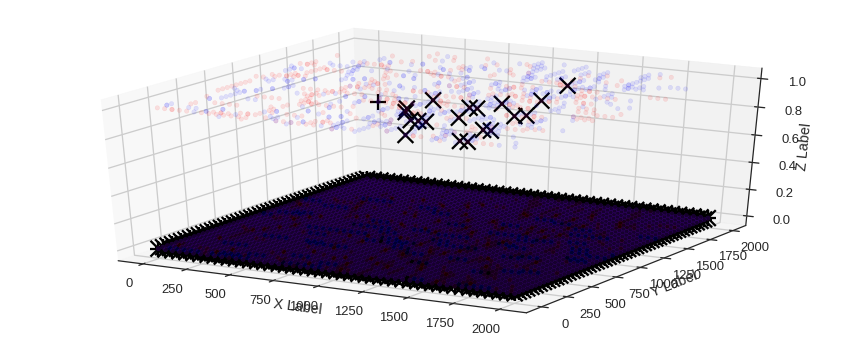

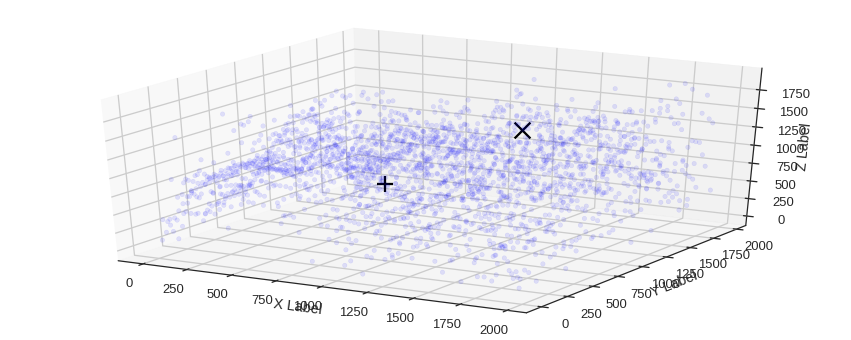

SPILL POINT: [ 1591.83679199   693.87756348  1724.88516225]
Leak Point: [ 857.1428833   693.87756348  804.61410435]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³


/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [26]:
# Calculating formation thickness based on z-difference between a bottom and top point on the footwall (fw)

# This is done using interp_data, where X,Y and Z-values are rescaled according to the rescaling_factor.
# Value[1] of extent_rescaled equals the maximum extent of model (here: 2000).
# So if we want to find the rescaled chosen X-position (here: 1100), 
# we simply calculate 2000-fw_th_point(here:900) rescaled (see fw_x)
# Y_mid defines that we are looking at a central position (in y-direction) in the model.
# The difference in z between two points has to be rescaled to the original scale again.
rescale_f = interp_data.rescaling_factor

# Reservoir thickness
# @pymc.deterministic
# def res_th(interp_unc=interp_unc):
#     fw_x = interp_unc[0][:, 0] == (interp_data.geo_data_res.extent[1] - (fw_th_point/rescale_f))
#     y_mid = interp_unc[0][:, 1] == (interp_data.geo_data_res.extent[3] - (1000/rescale_f))
#     points_fw = interp_unc[0][fw_x]
#     points_fw = points_fw[y_mid] 
#     fw_rb_z = points_fw[base_top_cond]['Z'].values*rescale_f
#     fw_sb_z = points_fw[res_top_cond]['Z'].values*rescale_f
#     return np.abs(fw_sb_z-fw_rb_z)

# #Seal thickness
# @pymc.deterministic
# def seal_th(interp_unc=interp_unc):
#     fw_x = interp_unc[0][:, 0] == (interp_data.extent_rescaled['X'].values[1] - (fw_th_point/rescale_f))
#     y_mid = interp_unc[0][:, 1] == (interp_data.extent_rescaled['Y'].values[1] - (1000/rescale_f))
#     points_fw = interp_unc[0][fw_x]
#     points_fw = points_fw[y_mid] 
#     fw_r2b_z = points_fw[seal_top_cond]['Z'].values*rescale_f
#     fw_sb_z = points_fw[res_top_cond]['Z'].values*rescale_f
#     return np.abs(fw_r2b_z-fw_sb_z)

# # Secondary reservoir thickness
# @pymc.deterministic
# def sec_res_th(interp_unc=interp_unc):
#     fw_x = interp_unc[0][:, 0] == (interp_data.extent_rescaled['X'].values[1] - (fw_th_point/rescale_f))
#     y_mid = interp_unc[0][:, 1] == (interp_data.extent_rescaled['Y'].values[1] - (1000/rescale_f))
#     points_fw = interp_unc[0][fw_x]
#     points_fw = points_fw[y_mid] 
#     fw_r2b_z = points_fw[seal_top_cond]['Z'].values*rescale_f
#     fw_ob_z = points_fw[secres_top_cond]['Z'].values*rescale_f
#     return np.abs(fw_ob_z-fw_r2b_z)

# Volumetric calculation 
@pymc.deterministic
def structural_model(interp_unc=input_data, fault_sealing=fault_sealing, ash=array_shapeholder):
    print('Fault sealing =', fault_sealing)
    try:
        # modify input data values accordingly
        interp_data.geo_data_res.interfaces[["X", "Y", "Z"]] = interp_unc[0]

        # Gx, Gy, Gz are just used for visualization. The theano function gets azimuth dip and polarity!!!
        interp_data.geo_data_res.foliations[["G_x", "G_y", "G_z", "X", "Y", "Z", 'azimuth', 'dip', 'polarity']] = interp_unc[1]
        
        interp_data.update_interpolator()
        
        lith_sol, fault_sol = gp.compute_model(interp_data)
        lith_block = lith_sol[0]
        fault_block = fault_sol[0]  
        res_top_surf, res_top_surf_simp = gp.get_surfaces(
                                              interp_data = interp_data, potential_lith=lith_sol[1], 
            potential_fault=fault_sol[1], n_formation = interp_data.get_formation_number()['Res_Top'])
        max_vol, lith_sol[0], bottom, trap = max_trap_vol(interp_data, lith_block, fault_block, res_top_surf, fault_sealing)
        print("Maximum reservoir volume: %s m³" % max_vol)
        if False:
        #gp.plot_section(geo_data, lith_sol[0,0], 5, plot_data =1)
            gp.plot_section(interp_data.geo_data_res, lith_sol[0], 25, plot_data =1)
            #gp.plot_section(geo_data, lith_sol[0,0], 45, plot_data =1)
            gp.plot_section(geo_data, trap, 25, plot_data =1)
        return lith_sol, fault_sol#, max_vol, trap
    except np.linalg.linalg.LinAlgError as err:
        print('LinAlgError occurred!')
        max_vol = -9999999
        lith_sol = ash
        fault_sol = ash
        trap = ash[0]
        return lith_sol, fault_sol#, max_vol, trap
        
# Avoid layer inversion by giving negative thicknesses a likelihood of zero
#@pymc.deterministic
#def no_inversion(sec_res_th=sec_res_th, res_th=res_th, seal_th=seal_th)

In [27]:
iterations = 10

In [28]:
model = pymc.Model([input_data, z_unc_res_top, z_unc_base_top, z_unc_seal_top, z_unc_secres_top, offset_unc, fault_sealing, structural_model, 
                   # res_th, seal_th, sec_res_th
                   ])

Z variations top to bottom: 14.5353888259 -3.88002080488 9.77882104445 -105.93339634
Fault offset variation: 70.361738109
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2510789837548524e-20
  ' condition number: {}'.format(rcond), RuntimeWarning)
/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:99: DeprecationWarning: numpy boolean subtract, the `-` operator, is deprecated, use the bitwise_xor, the `^` operator, or the logical_xor function instead.


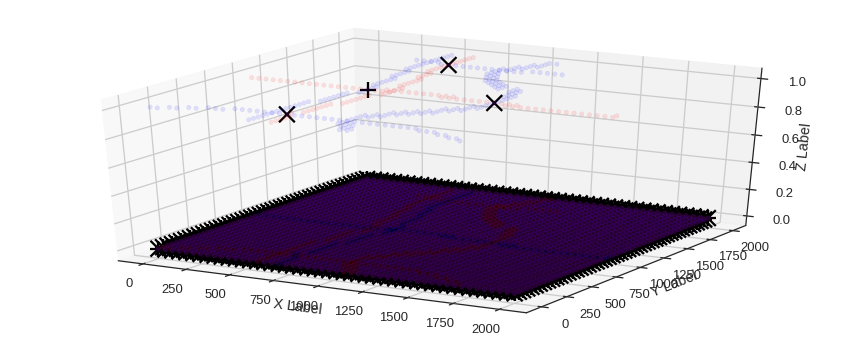

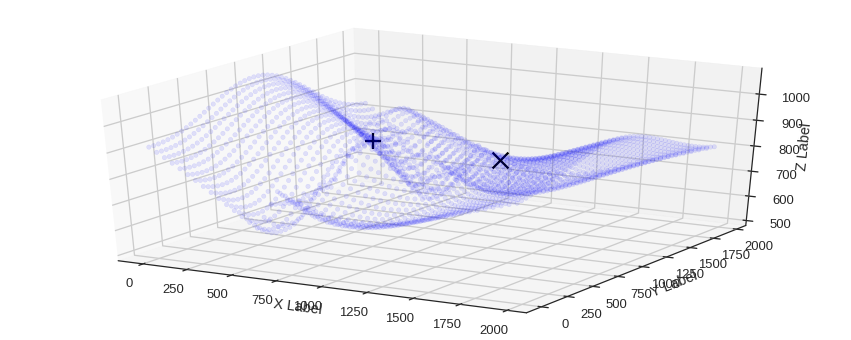

SPILL POINT: [ 1346.9387207    938.7755127    843.87600912]
Leak Point: [ 653.06121826  938.7755127   862.75442065]
Fault leak point above spill point.
Cross-fault leakage. Down to leak.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-------          20%                  ] 2 of 10 complete in 2.7 secZ variations top to bottom: -30.3533994813 -14.0097474547 31.8608687519 39.516215932
Fault offset variation: -82.8469618963
Fault sealing = True


/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.904347917169978e-36
  ' condition number: {}'.format(rcond), RuntimeWarning)


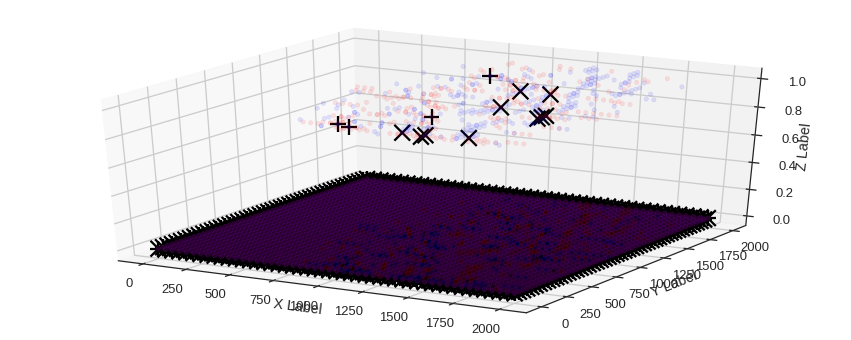

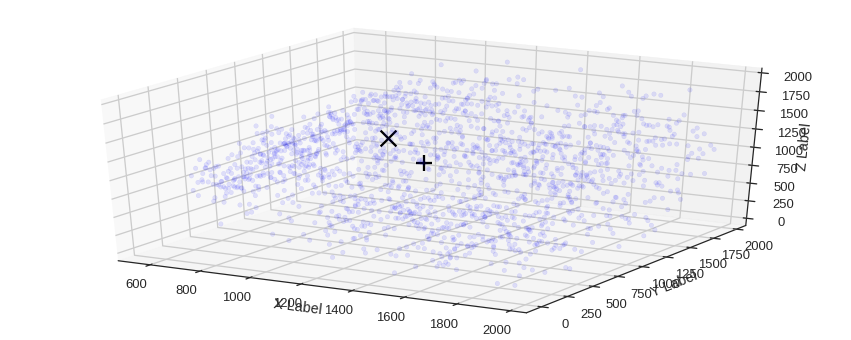

SPILL POINT: [ 1469.38769531    40.81632614  1857.37885596]
Leak Point: [  979.59185791  1551.02038574   617.78494662]
Spill point defines trap.
Fault is sealing. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-----------      30%                  ] 3 of 10 complete in 6.0 secZ variations top to bottom: 8.86160245493 0.842920713223 98.021089805 -35.1640916968
Fault offset variation: 48.2440564497
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.6873627657205345e-21
  ' condition number: {}'.format(rcond), RuntimeWarning)


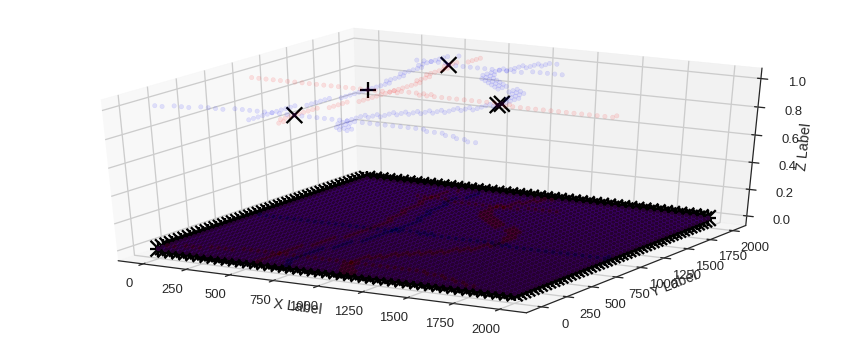

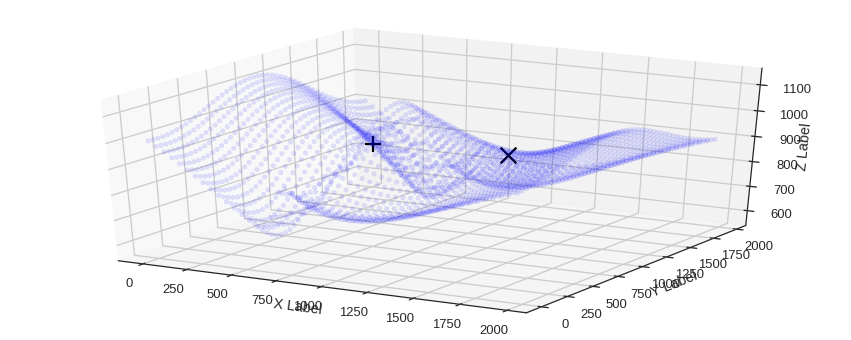

SPILL POINT: [ 1387.75512695   938.7755127    930.67953619]
Leak Point: [ 653.06121826  938.7755127   916.04358605]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [---------------  40%                  ] 4 of 10 complete in 8.6 secZ variations top to bottom: -2.92102754056 24.1159707698 -82.4911713143 -93.7418203656
Fault offset variation: 13.729306376
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.72953359525e-36
  ' condition number: {}'.format(rcond), RuntimeWarning)


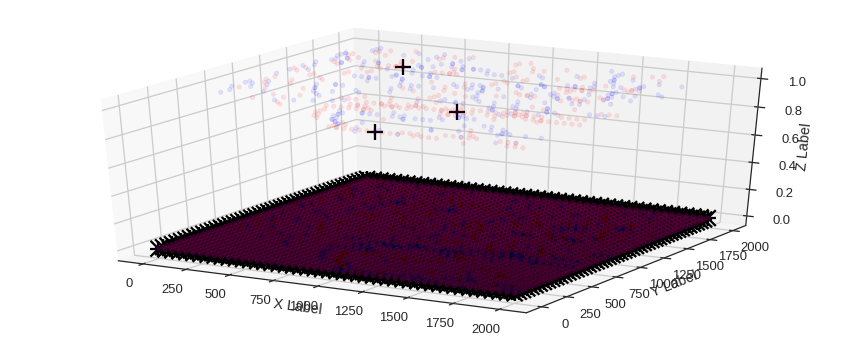

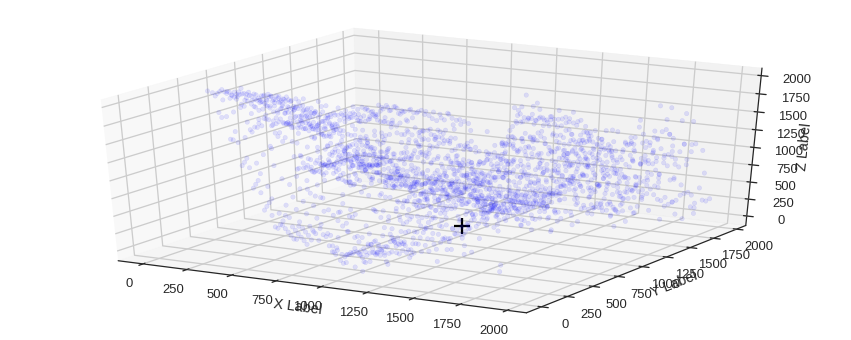

No SPILL POINT found!
Maximum reservoir volume: 0 m³
 [-----------------50%                  ] 5 of 10 complete in 11.5 secZ variations top to bottom: 1.24310643502 -0.827449015273 -16.5244089596 25.5611208646
Fault offset variation: -83.9714848774
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.0756311869226507e-21
  ' condition number: {}'.format(rcond), RuntimeWarning)


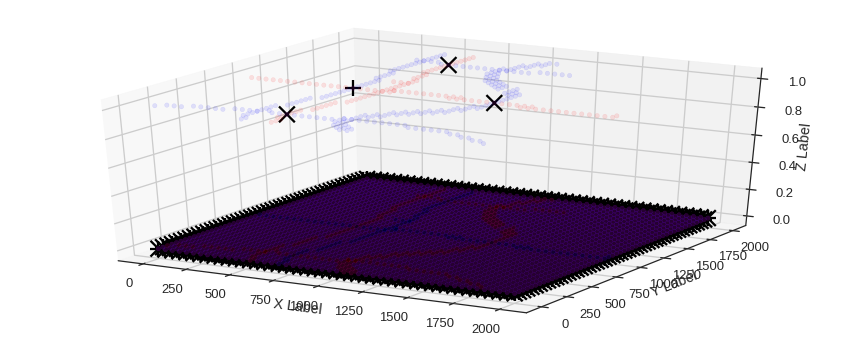

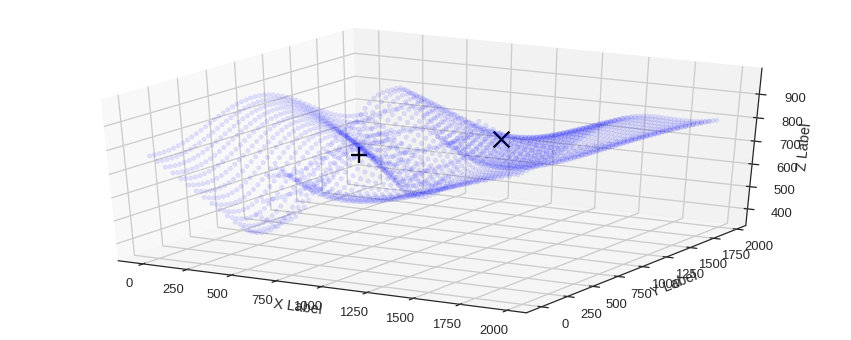

SPILL POINT: [ 1346.9387207   938.7755127   817.7217063]
Leak Point: [ 571.42858887  938.7755127   680.35831566]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-----------------60%--                ] 6 of 10 complete in 14.2 secZ variations top to bottom: 4.09314804033 5.47357876983 -9.35335496809 66.4735794345
Fault offset variation: -71.7413660155
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.6117642927393638e-35
  ' condition number: {}'.format(rcond), RuntimeWarning)


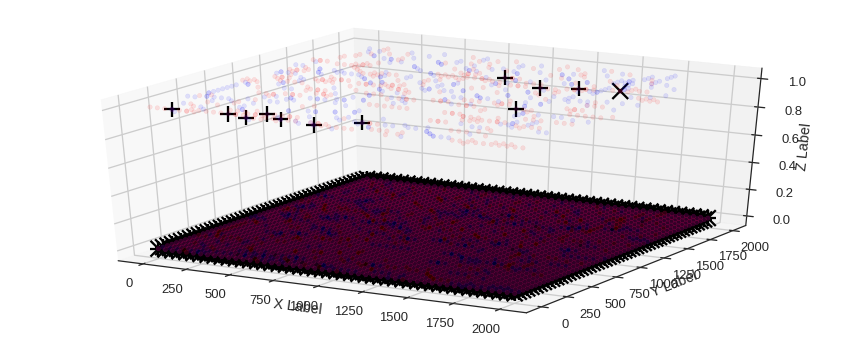

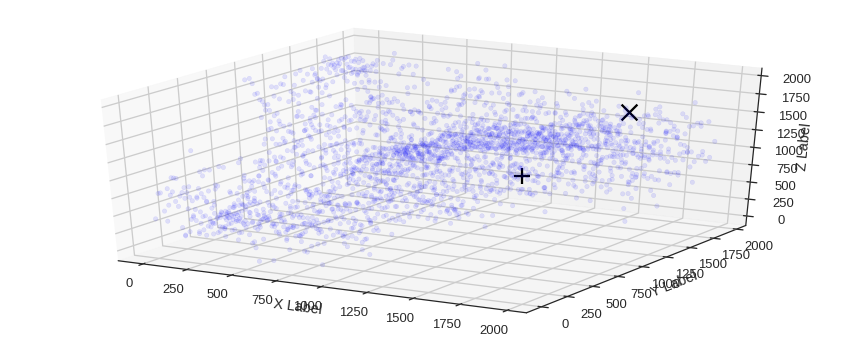

SPILL POINT: [ 1714.2857666   1510.20410156  1667.19259695]
Leak Point: [ 1510.20410156   857.1428833   1046.00485666]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-----------------70%------            ] 7 of 10 complete in 17.3 secZ variations top to bottom: -2.06273349038 -14.5661515471 16.145853175 15.5301469317
Fault offset variation: -59.9447559182
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.935279995859293e-22
  ' condition number: {}'.format(rcond), RuntimeWarning)


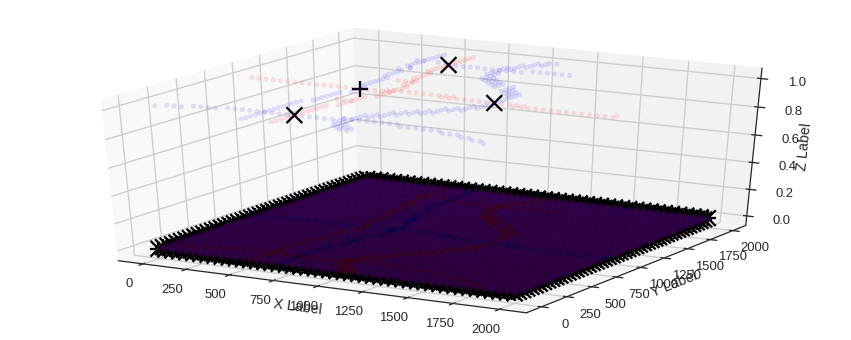

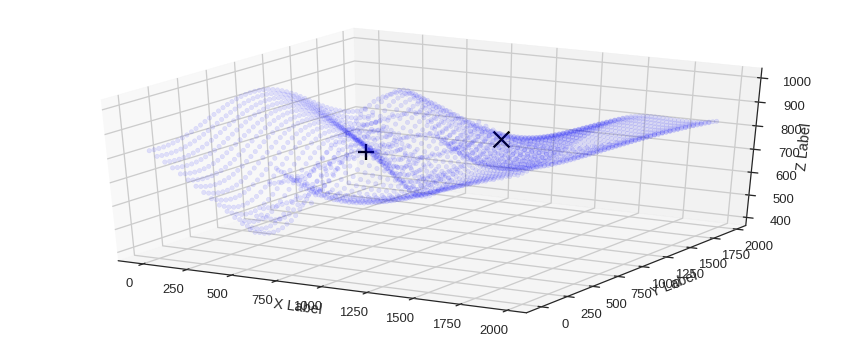

SPILL POINT: [ 1346.9387207   938.7755127   850.0475433]
Leak Point: [ 612.24487305  938.7755127   735.03349043]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-----------------80%----------        ] 8 of 10 complete in 19.9 secZ variations top to bottom: -6.11998316294 3.11100242363 -17.3481928147 32.4644338554
Fault offset variation: 12.9986393682
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.390849934788084e-21
  ' condition number: {}'.format(rcond), RuntimeWarning)


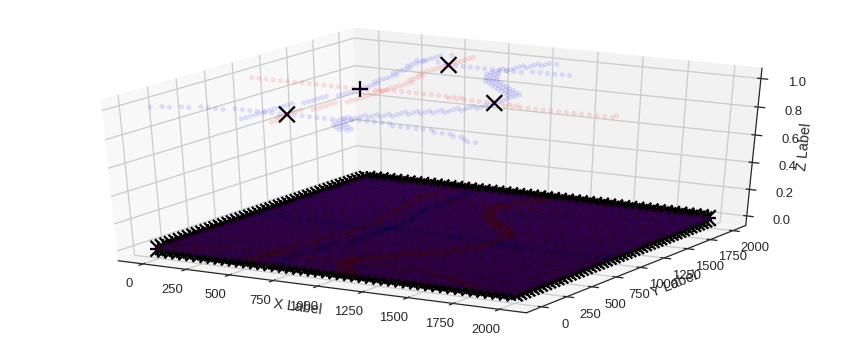

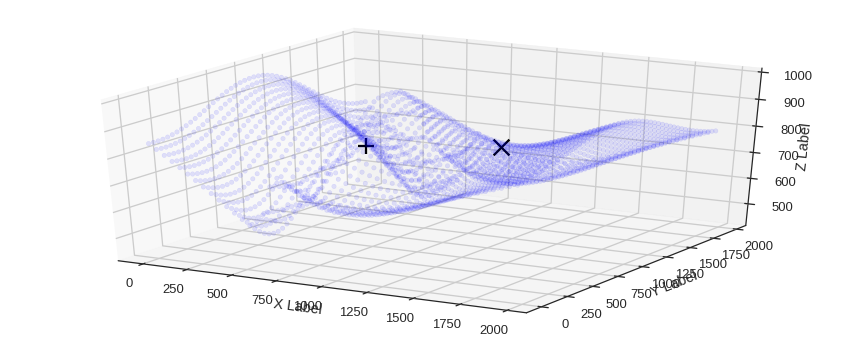

SPILL POINT: [ 1346.9387207    938.7755127    816.97496009]
Leak Point: [ 612.24487305  938.7755127   766.17872317]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-----------------90%--------------    ] 9 of 10 complete in 22.4 secZ variations top to bottom: 4.95863265108 -5.66279073431 21.8117154121 23.5173625159
Fault offset variation: 3.32267851666
Fault sealing = False


/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.39800063856907e-36
  ' condition number: {}'.format(rcond), RuntimeWarning)


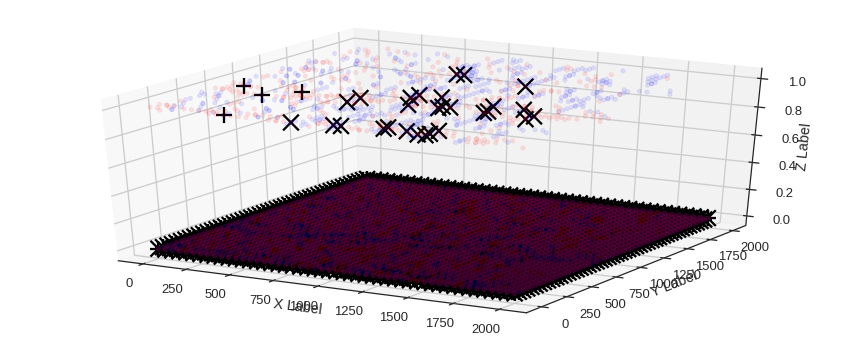

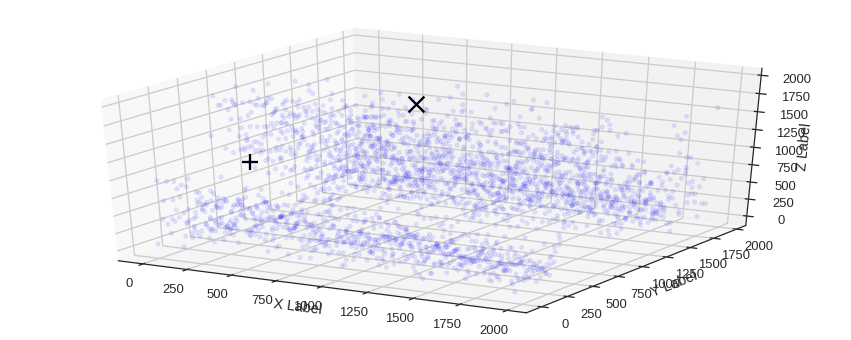

SPILL POINT: [  938.7755127    857.1428833   1868.84151367]
Leak Point: [  81.63265228  734.69384766  891.32072695]
Spill point defines trap.
Fault is pathway. Down to spill.
No res_formation above max_z!
Maximum reservoir volume: 0 m³
 [-----------------100%-----------------] 10 of 10 complete in 26.0 secZ variations top to bottom: -10.6711208594 -41.6428514517 -18.982368914 -52.1514832979
Fault offset variation: -38.9839389466
Fault sealing = False
LinAlgError occurred!
 [-----------------100%-----------------] 10 of 10 complete in 26.4 sec

In [29]:
M = pymc.MCMC(model,  db="hdf5", dbname="test4")
M.sample(iter=iterations)

In [30]:
import gempy.UncertaintyAnalysisPYMC2
import importlib
importlib.reload(gempy.UncertaintyAnalysisPYMC2)

<module 'gempy.UncertaintyAnalysisPYMC2' from '../../gempy/UncertaintyAnalysisPYMC2.py'>

In [31]:
dbname = "test4"
post = gempy.UncertaintyAnalysisPYMC2.Posterior(dbname)


No GemPy model trace tallied.


In [39]:
gp.plot_surfaces_3D_real_time(interp_data, [base_surf, sec_res_surf, seal_surf, res_surf], 
                    [base_surf_simp, sec_res_surf_simp, seal_surf_simp, res_surf_simp], plot_data=True,
                              posterior=post, alpha=.2)

/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.39800063856907e-36
  ' condition number: {}'.format(rcond), RuntimeWarning)


LinAlgError: Matrix is singular.
Apply node that caused the error: Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False}(Block Covariance Matrix, InplaceDimShuffle{0,x}.0)
Toposort index: 331
Inputs types: [TensorType(float64, matrix), TensorType(float64, col)]
Inputs shapes: [(60, 60), (60, 1)]
Inputs strides: [(480, 8), (8, 8)]
Inputs values: ['not shown', 'not shown']
Inputs type_num: [12, 12]
Outputs clients: [[Reshape{1}(Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False}.0, MakeVector{dtype='int64'}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "../../gempy/theanograf.py", line 1334, in compute_geological_model
    profile=False
  File "/home/miguel/anaconda3/lib/python3.5/site-packages/theano/scan_module/scan.py", line 773, in scan
    condition, outputs, updates = scan_utils.get_updates_and_outputs(fn(*args))
  File "../../gempy/theanograf.py", line 1231, in compute_a_series
    potential_field_contribution = self.block_series()  #[:-2*self.len_points]
  File "../../gempy/theanograf.py", line 1000, in block_series
    Z_x = self.potential_field_at_all()
  File "../../gempy/theanograf.py", line 924, in potential_field_at_all
    sigma_0_grad = self.gradient_contribution()
  File "../../gempy/theanograf.py", line 749, in gradient_contribution
    weights = self.extend_dual_kriging()
  File "../../gempy/theanograf.py", line 733, in extend_dual_kriging
    DK_parameters = self.solve_kriging()
  File "../../gempy/theanograf.py", line 683, in solve_kriging
    DK_parameters = theano.tensor.slinalg.solve(C_matrix, b2)

Debugprint of the apply node: 
Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id A] <TensorType(float64, col)> ''   
 |IncSubtensor{InplaceSet;int64::, int64:int64:} [id B] <TensorType(float64, matrix)> 'Block Covariance Matrix'   
 |InplaceDimShuffle{0,x} [id C] <TensorType(float64, col)> ''   
   |IncSubtensor{InplaceSet;int64:int64:} [id D] <TensorType(float64, vector)> 'b vector'   

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.
Apply node that caused the error: forall_inplace,cpu,Looping interfaces}(Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}}.0, Elemwise{add,no_inplace}.0, Elemwise{add,no_inplace}.0, Elemwise{add,no_inplace}.0, Elemwise{add,no_inplace}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, IncSubtensor{InplaceSet;:int64:}.0, Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}}.0, Coordinates of the grid points to interpolate01, <TensorType(float64, matrix)>, Value of the formation01, <TensorType(float64, vector)>, Position of the dips01, Rest of the points of the layers01, Reference points for every layer01, Angle of every dip01, Azimuth01, Polarity01, InplaceDimShuffle{x}.0, InplaceDimShuffle{x,x}.0, InplaceDimShuffle{x,x}.0, InplaceDimShuffle{x,x}.0, Elemwise{sqr,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{neg,no_inplace}.0, Elemwise{Composite{(sqr(i0) * i0)}}.0, Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}}.0, Elemwise{Composite{(sqr(sqr(i0)) * i0)}}.0, Elemwise{true_div,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}}.0, ScalarFromTensor.0, ScalarFromTensor.0, Alloc.0, Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)].0, Elemwise{minimum,no_inplace}.0, InplaceDimShuffle{1,0}.0, IncSubtensor{InplaceSet;:int64:}.0, Subtensor{int64:int64:int8}.0, Subtensor{int64:int64:int8}.0, Subtensor{int64}.0)
Toposort index: 324
Inputs types: [TensorType(int64, scalar), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(float64, 3D), TensorType(int64, scalar), TensorType(float64, matrix), TensorType(float64, matrix), TensorType(int64, vector), TensorType(float64, vector), TensorType(float64, matrix), TensorType(float64, matrix), TensorType(float64, matrix), TensorType(float64, vector), TensorType(float64, vector), TensorType(float64, vector), TensorType(float64, (True,)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True,)), TensorType(float64, (True,)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), Scalar(int64), Scalar(int64), TensorType(float64, vector), TensorType(float64, scalar), TensorType(int64, scalar), TensorType(float64, matrix), TensorType(float64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(float64, matrix)]
Inputs shapes: [(), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (2, 2, 125108), (), (125000, 3), (9, 125000), (5,), (5,), (3, 3), (54, 3), (54, 3), (3,), (3,), (3,), (1,), (1, 1), (1, 1), (1, 1), (1,), (1,), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (), (), (108,), (), (), (9, 108), (9,), (5,), (5,), (2, 125108)]
Inputs strides: [(), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (2001728, 1000864, 8), (), (8, 1000000), (1000000, 8), (8,), (8,), (8, 24), (8, 432), (8, 432), (8,), (8,), (8,), (8,), (8, 8), (8, 8), (8, 8), (8,), (8,), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (), (), (8,), (), (), (8, 72), (8,), (8,), (8,), (1000864, 8)]
Inputs values: [array(1), array([125054]), array([125004]), array([125108]), array([125058]), array([4]), array([54]), array([1]), array([3]), array([1]), array([5]), array([3]), 'not shown', array(1), 'not shown', 'not shown', array([1, 2, 3, 4, 5]), array([ 0.,  0.,  0.,  0.,  0.]), 'not shown', 'not shown', 'not shown', array([ 71.565,  18.435,  18.435]), array([ 270.,   90.,   90.]), array([ 1.,  1.,  1.]), array([ 2.]), array([[ 2.]]), array([[ 0.01978631]]), array([[ 0.91160569]]), array([ 4.]), array([ 4.]), array([[ 0.07914523]]), array([[-0.01978631]]), array([[ 0.75756705]]), array([[ 0.52317765]]), array([[ 0.62955711]]), array([[-16.84666667]]), array([[ 16.62049861]]), array([[ 1.0463553]]), array([[ 2.51822843]]), array([[ 10.35903653]]), -54, -108, 'not shown', array(0.3433333333333334), array(5), 'not shown', 'not shown', array([ 4, 11, 23, 39, 54]), array([ 0,  4, 11, 23, 39]), 'not shown']
Inputs type_num: [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 12, 7, 12, 12, 7, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 7, 7, 12, 12, 7, 12, 12, 7, 7, 12]
Outputs clients: [[Subtensor{int64, ::, :int64:}(forall_inplace,cpu,Looping interfaces}.0, ScalarFromTensor.0, ScalarFromTensor.0)], [Join(TensorConstant{0}, forall_inplace,cpu,scan_fn&scan_fn}.2, forall_inplace,cpu,Looping interfaces}.1)]]

Debugprint of the apply node: 
forall_inplace,cpu,Looping interfaces}.0 [id A] <TensorType(float64, 3D)> ''   
 |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 | | | |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 | | | | |Length of interfaces in every series [id G] <TensorType(int64, vector)>
 | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id K] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id L] <TensorType(int64, scalar)> ''   
 | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | |   |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | | | |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | | | | |Length of foliations in every series [id P] <TensorType(int64, vector)>
 | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id S] <TensorType(int64, scalar)> ''   
 | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | |   |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | | | |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | | | | |List with the number of formations [id W] <TensorType(int64, vector)>
 | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id Y] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Z] <TensorType(int64, scalar)> ''   
 | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | |   |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 |   | |Grade of the universal drift [id BC] <TensorType(int64, vector)>
 |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 |     |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 |     |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 |Elemwise{add,no_inplace} [id BE] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | | |Shape_i{0} [id BG] <TensorType(int64, scalar)> ''   
 | |   |Coordinates of the grid points to interpolate01 [id BH] <TensorType(float64, matrix)>
 | |Subtensor{int64:int64:int64} [id BI] <TensorType(int64, vector)> ''   
 |   |Length of interfaces in every series [id G] <TensorType(int64, vector)>
 |   |ScalarFromTensor [id BJ] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id BK] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BL] <TensorType(bool, scalar)> ''   
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id BM] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id BN] <TensorType(bool, scalar)> ''   
 |   |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id BO] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 |   |   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |   |   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{sub,no_inplace} [id K] <TensorType(int64, scalar)> ''   
 |   |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id L] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id BO] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id BR] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id BN] <TensorType(bool, scalar)> ''   
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id L] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id BM] <TensorType(int64, scalar)> ''   
 |   |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id BR] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |ScalarFromTensor [id BS] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id BT] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BL] <TensorType(bool, scalar)> ''   
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id BM] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |Constant{1} [id BU] <int64>
 |Elemwise{add,no_inplace} [id BV] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | |Subtensor{int64:int64:int64} [id BW] <TensorType(int64, vector)> ''   
 |   |Length of interfaces in every series [id G] <TensorType(int64, vector)>
 |   |ScalarFromTensor [id BX] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id BY] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BZ] <TensorType(bool, scalar)> ''   
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CA] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id CB] <TensorType(bool, scalar)> ''   
 |   |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CC] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 |   |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 |   |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CC] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CD] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id CB] <TensorType(bool, scalar)> ''   
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 |   |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CA] <TensorType(int64, scalar)> ''   
 |   |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CD] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |ScalarFromTensor [id CF] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CG] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BZ] <TensorType(bool, scalar)> ''   
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CA] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |Constant{1} [id BU] <int64>
 |Elemwise{add,no_inplace} [id CH] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | |InplaceDimShuffle{x} [id CI] <TensorType(int64, (True,))> ''   
 | | |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 | |   |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 | |Subtensor{int64:int64:int64} [id BI] <TensorType(int64, vector)> ''   
 |Elemwise{add,no_inplace} [id CL] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | |InplaceDimShuffle{x} [id CI] <TensorType(int64, (True,))> ''   
 | |Subtensor{int64:int64:int64} [id BW] <TensorType(int64, vector)> ''   
 |Subtensor{int64:int64:int64} [id BW] <TensorType(int64, vector)> ''   
 |Subtensor{int64:int64:int64} [id BI] <TensorType(int64, vector)> ''   
 |Subtensor{int64:int64:int64} [id CM] <TensorType(int64, vector)> ''   
 | |Length of foliations in every series [id P] <TensorType(int64, vector)>
 | |ScalarFromTensor [id CN] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CO] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CP] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CQ] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id CR] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CS] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CS] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CT] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id CR] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CQ] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CT] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id CU] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CV] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CP] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CQ] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id CW] <TensorType(int64, vector)> ''   
 | |Length of foliations in every series [id P] <TensorType(int64, vector)>
 | |ScalarFromTensor [id CX] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CY] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CZ] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DA] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DB] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DC] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{sub,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id S] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DC] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DD] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DB] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id S] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DA] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DD] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id DE] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id DF] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CZ] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DA] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id DG] <TensorType(int64, vector)> ''   
 | |List with the number of formations [id W] <TensorType(int64, vector)>
 | |ScalarFromTensor [id DH] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id DI] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DJ] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id DK] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DL] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id DM] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id DM] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id DN] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DL] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id DK] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id DN] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id DO] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id DP] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DJ] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id DK] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id DQ] <TensorType(int64, vector)> ''   
 | |List with the number of formations [id W] <TensorType(int64, vector)>
 | |ScalarFromTensor [id DR] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id DS] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DT] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DU] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DV] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DW] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{sub,no_inplace} [id Y] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Z] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DW] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DX] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DV] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Z] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DU] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DX] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id DY] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id DZ] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DT] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DU] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id EA] <TensorType(int64, vector)> ''   
 | |Grade of the universal drift [id BC] <TensorType(int64, vector)>
 | |ScalarFromTensor [id EB] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id EC] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id ED] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id EE] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id EF] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}} [id EG] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}} [id EG] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 3)] [id EH] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id EF] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   | | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id EE] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 3)] [id EH] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id EI] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id EJ] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id ED] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id EE] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |IncSubtensor{InplaceSet;:int64:} [id EK] <TensorType(float64, 3D)> ''   
 | |AllocEmpty{dtype='float64'} [id EL] <TensorType(float64, 3D)> ''   
 | | |Elemwise{Composite{(Switch(LT(maximum(i0, i1), i2), (maximum(i0, i1) + i3), (maximum(i0, i1) - i2)) + i4)}}[(0, 0)] [id EM] <TensorType(int64, scalar)> ''   
 | | | |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i3), i1)) + i4)}} [id EN] <TensorType(int64, scalar)> ''   
 | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | | | | |Elemwise{Composite{Switch(LT((i0 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2)), i3), (i4 - i0), Switch(GE((i0 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2)), (i2 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2))), (i5 + i0), Switch(LE((i2 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2)), i3), (i5 + i0), i0)))}} [id EO] <TensorType(int64, scalar)> ''   
 | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | | | |Elemwise{add,no_inplace} [id EP] <TensorType(int64, scalar)> ''   
 | | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | | | | | |TensorConstant{-2} [id EQ] <TensorType(int64, scalar)>
 | | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | | | | |Elemwise{add,no_inplace} [id EP] <TensorType(int64, scalar)> ''   
 | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
 | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id BG] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
 | |     |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | |     |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 | |Rebroadcast{0} [id EV] <TensorType(float64, 3D)> ''   
 | | |Alloc [id EW] <TensorType(float64, (True, False, False))> ''   
 | |   |TensorConstant{0.0} [id EX] <TensorType(float64, scalar)>
 | |   |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
 | |   |TensorConstant{2} [id EY] <TensorType(int8, scalar)>
 | |   |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |Coordinates of the grid points to interpolate01 [id BH] <TensorType(float64, matrix)>
 |<TensorType(float64, matrix)> [id EZ] <TensorType(float64, matrix)>
 |Value of the formation01 [id FA] <TensorType(int64, vector)>
 |<TensorType(float64, vector)> [id FB] <TensorType(float64, vector)>
 |Position of the dips01 [id FC] <TensorType(float64, matrix)>
 |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |Angle of every dip01 [id FE] <TensorType(float64, vector)>
 |Azimuth01 [id FF] <TensorType(float64, vector)>
 |Polarity01 [id FG] <TensorType(float64, vector)>
 |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
 | |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
 |InplaceDimShuffle{x,x} [id FJ] <TensorType(float64, (True, True))> ''   
 | |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
 |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
 | |Covariance at 0 [id FL] <TensorType(float64, scalar)>
 |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 | |Range [id FN] <TensorType(float64, scalar)>
 |Elemwise{sqr,no_inplace} [id FO] <TensorType(float64, (True,))> ''   
 | |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
 |Elemwise{mul,no_inplace} [id FP] <TensorType(float64, (True,))> ''   
 | |TensorConstant{(1,) of 2.0} [id FQ] <TensorType(float64, (True,))>
 | |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
 |Elemwise{mul,no_inplace} [id FR] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FS] <TensorType(float64, (True, True))> ''   
 |   |<TensorType(float64, scalar)> [id FT] <TensorType(float64, scalar)>
 |Elemwise{neg,no_inplace} [id FU] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{(sqr(i0) * i0)}} [id FV] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}} [id FW] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{(sqr(sqr(i0)) * i0)}} [id FX] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |Elemwise{true_div,no_inplace} [id FY] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of -14.0} [id FZ] <TensorType(float64, (True, True))>
 | |InplaceDimShuffle{x,x} [id GA] <TensorType(float64, (True, True))> ''   
 |   |Elemwise{sqr,no_inplace} [id GB] <TensorType(float64, scalar)> ''   
 |     |Range [id FN] <TensorType(float64, scalar)>
 |Elemwise{mul,no_inplace} [id GC] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 20.0} [id GD] <TensorType(float64, (True, True))>
 | |InplaceDimShuffle{x,x} [id GA] <TensorType(float64, (True, True))> ''   
 |Elemwise{mul,no_inplace} [id GE] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 2.0} [id GF] <TensorType(float64, (True, True))>
 | |Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}} [id FW] <TensorType(float64, (True, True))> ''   
 |Elemwise{mul,no_inplace} [id GG] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 4.0} [id GH] <TensorType(float64, (True, True))>
 | |Elemwise{Composite{(sqr(sqr(i0)) * i0)}} [id FX] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}} [id GI] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 15.0} [id GJ] <TensorType(float64, (True, True))>
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |ScalarFromTensor [id GK] <int64> ''   
 | |Elemwise{neg,no_inplace} [id GL] <TensorType(int64, scalar)> ''   
 |   |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 |ScalarFromTensor [id GM] <int64> ''   
 | |Elemwise{Mul}[(0, 1)] [id GN] <TensorType(int64, scalar)> ''   
 |   |TensorConstant{-2} [id EQ] <TensorType(int64, scalar)>
 |   |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 |Alloc [id GO] <TensorType(float64, vector)> ''   
 | |TensorConstant{1.0} [id GP] <TensorType(float64, scalar)>
 | |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
 |Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)] [id GQ] <TensorType(float64, scalar)> ''   
 | |TensorConstant{14.0} [id GR] <TensorType(float64, scalar)>
 | |Covariance at 0 [id FL] <TensorType(float64, scalar)>
 | |Elemwise{sqr,no_inplace} [id GB] <TensorType(float64, scalar)> ''   
 | |<TensorType(float64, scalar)> [id GS] <TensorType(float64, scalar)>
 |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 | | | |MakeVector{dtype='int64'} [id GW] <TensorType(int64, vector)> ''   
 | | |   |Elemwise{Add}[(0, 1)] [id GX] <TensorType(int64, scalar)> ''   
 | | |     |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |     |Shape_i{0} [id GY] <TensorType(int64, scalar)> ''   
 | | |       |<TensorType(int64, vector)> [id GZ] <TensorType(int64, vector)>
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id HA] <TensorType(int64, scalar)> ''   
 |   |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id HB] <TensorType(int64, scalar)> ''   
 |     |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 |     |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 |InplaceDimShuffle{1,0} [id HC] <TensorType(float64, matrix)> ''   
 | |Join [id HD] <TensorType(float64, matrix)> ''   
 |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |Join [id HE] <TensorType(float64, matrix)> ''   
 |   | |TensorConstant{1} [id HF] <TensorType(int8, scalar)>
 |   | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   | |Elemwise{sqr,no_inplace} [id HG] <TensorType(float64, matrix)> ''   
 |   | | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   | |Join [id HH] <TensorType(float64, matrix)> ''   
 |   |   |TensorConstant{1} [id HI] <TensorType(int8, scalar)>
 |   |   |Elemwise{mul,no_inplace} [id HJ] <TensorType(float64, col)> ''   
 |   |   | |InplaceDimShuffle{0,x} [id HK] <TensorType(float64, col)> ''   
 |   |   | | |Subtensor{::, int64} [id HL] <TensorType(float64, vector)> ''   
 |   |   | |   |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   |   | |   |Constant{0} [id HM] <int64>
 |   |   | |InplaceDimShuffle{0,x} [id HN] <TensorType(float64, col)> ''   
 |   |   |   |Subtensor{::, int64} [id HO] <TensorType(float64, vector)> ''   
 |   |   |     |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   |   |     |Constant{1} [id BU] <int64>
 |   |   |Elemwise{mul,no_inplace} [id HP] <TensorType(float64, col)> ''   
 |   |   | |InplaceDimShuffle{0,x} [id HK] <TensorType(float64, col)> ''   
 |   |   | |InplaceDimShuffle{0,x} [id HQ] <TensorType(float64, col)> ''   
 |   |   |   |Subtensor{::, int64} [id HR] <TensorType(float64, vector)> ''   
 |   |   |     |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   |   |     |Constant{2} [id HS] <int64>
 |   |   |Elemwise{mul,no_inplace} [id HT] <TensorType(float64, col)> ''   
 |   |     |InplaceDimShuffle{0,x} [id HN] <TensorType(float64, col)> ''   
 |   |     |InplaceDimShuffle{0,x} [id HQ] <TensorType(float64, col)> ''   
 |   |Join [id HU] <TensorType(float64, matrix)> ''   
 |     |TensorConstant{1} [id HV] <TensorType(int8, scalar)>
 |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |     |Elemwise{sqr,no_inplace} [id HW] <TensorType(float64, matrix)> ''   
 |     | |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |     |Join [id HX] <TensorType(float64, matrix)> ''   
 |       |TensorConstant{1} [id HY] <TensorType(int8, scalar)>
 |       |Elemwise{mul,no_inplace} [id HZ] <TensorType(float64, col)> ''   
 |       | |InplaceDimShuffle{0,x} [id IA] <TensorType(float64, col)> ''   
 |       | | |Subtensor{::, int64} [id IB] <TensorType(float64, vector)> ''   
 |       | |   |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |       | |   |Constant{0} [id HM] <int64>
 |       | |InplaceDimShuffle{0,x} [id IC] <TensorType(float64, col)> ''   
 |       |   |Subtensor{::, int64} [id ID] <TensorType(float64, vector)> ''   
 |       |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |       |     |Constant{1} [id BU] <int64>
 |       |Elemwise{mul,no_inplace} [id IE] <TensorType(float64, col)> ''   
 |       | |InplaceDimShuffle{0,x} [id IA] <TensorType(float64, col)> ''   
 |       | |InplaceDimShuffle{0,x} [id IF] <TensorType(float64, col)> ''   
 |       |   |Subtensor{::, int64} [id IG] <TensorType(float64, vector)> ''   
 |       |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |       |     |Constant{2} [id HS] <int64>
 |       |Elemwise{mul,no_inplace} [id IH] <TensorType(float64, col)> ''   
 |         |InplaceDimShuffle{0,x} [id IC] <TensorType(float64, col)> ''   
 |         |InplaceDimShuffle{0,x} [id IF] <TensorType(float64, col)> ''   
 |IncSubtensor{InplaceSet;:int64:} [id II] <TensorType(float64, vector)> ''   
 | |Reshape{1} [id IJ] <TensorType(float64, vector)> ''   
 | | |Alloc [id IK] <TensorType(float64, row)> ''   
 | | | |InplaceDimShuffle{0,x} [id IL] <TensorType(float64, (True, True))> ''   
 | | | | |Rebroadcast{1} [id IM] <TensorType(float64, (True,))> ''   
 | | | |   |Reshape{1} [id IN] <TensorType(float64, vector)> ''   
 | | | |     |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
 | | | |     |TensorConstant{(1,) of -1} [id IO] <TensorType(int64, (True,))>
 | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | |TensorConstant{9} [id IP] <TensorType(int8, scalar)>
 | | |TensorConstant{(1,) of 9} [id IQ] <TensorType(int64, vector)>
 | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
 | |Constant{3} [id IR] <int64>
 |Subtensor{int64:int64:int8} [id IS] <TensorType(int64, vector)> ''   
 | |CumOp{None, add} [id IT] <TensorType(int64, vector)> ''   
 | | |Join [id IU] <TensorType(int64, vector)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{(1,) of 0} [id IV] <TensorType(int8, vector)>
 | |   |<TensorType(int64, vector)> [id GZ] <TensorType(int64, vector)>
 | |ScalarFromTensor [id IW] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}} [id IX] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id IY] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id IZ] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{lt,no_inplace} [id JA] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id HA] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id HB] <TensorType(int64, scalar)> ''   
 | |   |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id JB] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id JC] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id IY] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id HB] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id IZ] <TensorType(int64, scalar)> ''   
 | |   |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id JD] <int8>
 |Subtensor{int64:int64:int8} [id JE] <TensorType(int64, vector)> ''   
 | |CumOp{None, add} [id IT] <TensorType(int64, vector)> ''   
 | |ScalarFromTensor [id JF] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 3)] [id JG] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id JH] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id JI] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{lt,no_inplace} [id JA] <TensorType(bool, scalar)> ''   
 | |   | | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id JJ] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id JK] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id JH] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id JI] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id JD] <int8>
 |Subtensor{int64} [id JL] <TensorType(float64, matrix)> ''   
   |forall_inplace,cpu,scan_fn&scan_fn}.0 [id JM] <TensorType(float64, 3D)> ''   
   | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{sub,no_inplace} [id JQ] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{sub,no_inplace} [id JU] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{sub,no_inplace} [id JY] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | |   |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
   | |Subtensor{int64:int64:int64} [id KB] <TensorType(int64, vector)> ''   
   | | |Length of interfaces in every series [id G] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id KC] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KD] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KE] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id KF] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KG] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id KH] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id KH] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id KJ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KG] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id KF] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id KJ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id KK] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KL] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KE] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id KF] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id KM] <TensorType(int64, vector)> ''   
   | | |Length of interfaces in every series [id G] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id KN] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KO] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KP] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id KQ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KR] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id KS] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{sub,no_inplace} [id JQ] <TensorType(int64, scalar)> ''   
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id KS] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id KT] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KR] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id KQ] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id KT] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id KU] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KV] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KP] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id KQ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id KW] <TensorType(int64, vector)> ''   
   | | |Length of foliations in every series [id P] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id KX] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KY] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KZ] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LA] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LB] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LC] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LC] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LD] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LB] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LA] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LD] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id LE] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LF] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KZ] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LA] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id LG] <TensorType(int64, vector)> ''   
   | | |Length of foliations in every series [id P] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id LH] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LI] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LJ] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id LK] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LL] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id LM] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{sub,no_inplace} [id JU] <TensorType(int64, scalar)> ''   
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id LM] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id LN] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LL] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id LK] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id LN] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id LO] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LP] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LJ] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id LK] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id LQ] <TensorType(int64, vector)> ''   
   | | |List with the number of formations [id W] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id LR] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LS] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LT] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LU] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LV] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LW] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LW] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LX] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LV] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LU] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LX] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id LY] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LZ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LT] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LU] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id MA] <TensorType(int64, vector)> ''   
   | | |List with the number of formations [id W] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id MB] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MC] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MD] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id ME] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MF] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id MG] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{sub,no_inplace} [id JY] <TensorType(int64, scalar)> ''   
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id MG] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id MH] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MF] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id ME] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id MH] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id MI] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MJ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MD] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id ME] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id MK] <TensorType(int64, vector)> ''   
   | | |Grade of the universal drift [id BC] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id ML] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MM] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MN] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id MO] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MP] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id MQ] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id MQ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}} [id MR] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MP] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id MO] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}} [id MR] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id MS] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MT] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MN] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id MO] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |IncSubtensor{InplaceSet;:int64:} [id MU] <TensorType(float64, 3D)> ''   
   | | |AllocEmpty{dtype='float64'} [id MV] <TensorType(float64, 3D)> ''   
   | | | |Elemwise{Composite{(Switch(LT(maximum(i0, i1), i2), (maximum(i0, i1) + i3), (maximum(i0, i1) - i2)) + i4)}}[(0, 0)] [id MW] <TensorType(int64, scalar)> ''   
   | | | | |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i3), i1)) + i4)}} [id MX] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{Switch(GE(i0, i1), i2, Switch(i3, i2, i4))}}[(0, 1)] [id MY] <TensorType(int64, scalar)> ''   
   | | | | | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | | | | | |Elemwise{sub,no_inplace} [id MZ] <TensorType(int64, scalar)> ''   
   | | | | | | | |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
   | | | | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id NB] <TensorType(int64, scalar)> ''   
   | | | | | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | | | |   |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{add,no_inplace} [id NC] <TensorType(int64, scalar)> ''   
   | | | | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{le,no_inplace} [id ND] <TensorType(bool, scalar)> ''   
   | | | | | | | |Elemwise{sub,no_inplace} [id MZ] <TensorType(int64, scalar)> ''   
   | | | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id NB] <TensorType(int64, scalar)> ''   
   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
   | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | | |Rebroadcast{0} [id EV] <TensorType(float64, 3D)> ''   
   | | |Constant{1} [id BU] <int64>
   | |IncSubtensor{InplaceSet;:int64:} [id NE] <TensorType(float64, 3D)> ''   
   | | |AllocEmpty{dtype='float64'} [id NF] <TensorType(float64, 3D)> ''   
   | | | |Elemwise{Composite{(Switch(LT(maximum(i0, i1), i2), (maximum(i0, i1) + i3), (maximum(i0, i1) - i2)) + i4)}}[(0, 0)] [id NG] <TensorType(int64, scalar)> ''   
   | | | | |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i0 + i3), i1)) + i3)}} [id NH] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{Switch(LT((i0 - i1), i2), (i3 - i0), Switch(GE((i0 - i1), i4), i5, Switch(i6, i5, i0)))}} [id NI] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id NB] <TensorType(int64, scalar)> ''   
   | | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | | |TensorConstant{-2} [id EQ] <TensorType(int64, scalar)>
   | | | | | | |Elemwise{sub,no_inplace} [id MZ] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{add,no_inplace} [id NC] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{le,no_inplace} [id ND] <TensorType(bool, scalar)> ''   
   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | | |Rebroadcast{0} [id EV] <TensorType(float64, 3D)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | |Coordinates of the grid points to interpolate01 [id BH] <TensorType(float64, matrix)>
   | |<TensorType(float64, matrix)> [id EZ] <TensorType(float64, matrix)>
   | |Value of the formation01 [id FA] <TensorType(int64, vector)>
   | |<TensorType(float64, vector)> [id NJ] <TensorType(float64, vector)>
   | |Position of the dips01 [id FC] <TensorType(float64, matrix)>
   | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
   | |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
   | |Angle of every dip01 [id FE] <TensorType(float64, vector)>
   | |Azimuth01 [id FF] <TensorType(float64, vector)>
   | |Polarity01 [id FG] <TensorType(float64, vector)>
   | |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
   | |InplaceDimShuffle{x,x} [id FJ] <TensorType(float64, (True, True))> ''   
   | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
   | |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
   | |Elemwise{sqr,no_inplace} [id FO] <TensorType(float64, (True,))> ''   
   | |Elemwise{mul,no_inplace} [id FP] <TensorType(float64, (True,))> ''   
   | |Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}} [id FW] <TensorType(float64, (True, True))> ''   
   | |Elemwise{Composite{(sqr(i0) * i0)}} [id FV] <TensorType(float64, (True, True))> ''   
   | |Elemwise{Composite{(sqr(sqr(i0)) * i0)}} [id FX] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id FR] <TensorType(float64, (True, True))> ''   
   | |Elemwise{neg,no_inplace} [id FU] <TensorType(float64, (True, True))> ''   
   | |Elemwise{true_div,no_inplace} [id FY] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id GE] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id GC] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id GG] <TensorType(float64, (True, True))> ''   
   | |Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}} [id GI] <TensorType(float64, (True, True))> ''   
   | |ScalarFromTensor [id GK] <int64> ''   
   | |ScalarFromTensor [id GM] <int64> ''   
   | |Alloc [id NK] <TensorType(float64, vector)> ''   
   | | |TensorConstant{1.0} [id NL] <TensorType(float64, scalar)>
   | | |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
   | |Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)] [id GQ] <TensorType(float64, scalar)> ''   
   | |Alloc [id NM] <TensorType(float64, matrix)> ''   
   | | |TensorConstant{0.0} [id EX] <TensorType(float64, scalar)>
   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
   | |InplaceDimShuffle{1,0} [id NN] <TensorType(float64, matrix)> ''   
   | | |Join [id NO] <TensorType(float64, matrix)> ''   
   | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | |   |Join [id NP] <TensorType(float64, matrix)> ''   
   | |   | |TensorConstant{1} [id NQ] <TensorType(int8, scalar)>
   | |   | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
   | |   | |Elemwise{sqr,no_inplace} [id HG] <TensorType(float64, matrix)> ''   
   | |   | |Join [id NR] <TensorType(float64, matrix)> ''   
   | |   |   |TensorConstant{1} [id NS] <TensorType(int8, scalar)>
   | |   |   |Elemwise{mul,no_inplace} [id HJ] <TensorType(float64, col)> ''   
   | |   |   |Elemwise{mul,no_inplace} [id HP] <TensorType(float64, col)> ''   
   | |   |   |Elemwise{mul,no_inplace} [id HT] <TensorType(float64, col)> ''   
   | |   |Join [id NT] <TensorType(float64, matrix)> ''   
   | |     |TensorConstant{1} [id NU] <TensorType(int8, scalar)>
   | |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
   | |     |Elemwise{sqr,no_inplace} [id HW] <TensorType(float64, matrix)> ''   
   | |     |Join [id NV] <TensorType(float64, matrix)> ''   
   | |       |TensorConstant{1} [id NW] <TensorType(int8, scalar)>
   | |       |Elemwise{mul,no_inplace} [id HZ] <TensorType(float64, col)> ''   
   | |       |Elemwise{mul,no_inplace} [id IE] <TensorType(float64, col)> ''   
   | |       |Elemwise{mul,no_inplace} [id IH] <TensorType(float64, col)> ''   
   | |IncSubtensor{InplaceSet;:int64:} [id NX] <TensorType(float64, vector)> ''   
   | | |Reshape{1} [id NY] <TensorType(float64, vector)> ''   
   | | | |Alloc [id NZ] <TensorType(float64, row)> ''   
   | | | | |InplaceDimShuffle{0,x} [id OA] <TensorType(float64, (True, True))> ''   
   | | | | | |Rebroadcast{1} [id OB] <TensorType(float64, (True,))> ''   
   | | | | |   |Reshape{1} [id OC] <TensorType(float64, vector)> ''   
   | | | | |     |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
   | | | | |     |TensorConstant{(1,) of -1} [id OD] <TensorType(int64, (True,))>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{9} [id OE] <TensorType(int8, scalar)>
   | | | |TensorConstant{(1,) of 9} [id IQ] <TensorType(int64, vector)>
   | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | |Constant{3} [id IR] <int64>
   | |Subtensor{int64:int64:int8} [id IS] <TensorType(int64, vector)> ''   
   | |Subtensor{int64:int64:int8} [id JE] <TensorType(int64, vector)> ''   
   | |Elemwise{Sub}[(0, 0)] [id OF] <TensorType(float64, matrix)> ''   
   | | |Assert{msg='Theano Assert failed!'} [id OG] <TensorType(float64, matrix)> ''   
   | | | |Alloc [id OH] <TensorType(float64, matrix)> ''   
   | | | | |TensorConstant{(1, 1) of 0.01} [id OI] <TensorType(float64, (True, True))>
   | | | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | | | |Elemwise{Composite{(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8) - Switch(LT(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)))}} [id OJ] <TensorType(int64, scalar)> ''   
   | | | |   |Elemwise{Sub}[(0, 0)] [id OK] <TensorType(int64, scalar)> ''   
   | | | |   | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | | | |   | |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
   | | | |   |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
   | | | |   |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |Elemwise{Composite{(i0 + (i1 * i2))}}[(0, 0)] [id OL] <TensorType(int64, scalar)> ''   
   | | | |   | |Shape_i{0} [id BG] <TensorType(int64, scalar)> ''   
   | | | |   | |TensorConstant{2} [id EY] <TensorType(int8, scalar)>
   | | | |   | |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |Elemwise{Composite{EQ((Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i2, i3), i4, i5), i3), i6, i7) - Switch(LT(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i8, i3), i9, i10), i3), i11, i12), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i2, i3), i4, i5), i3), i6, i7)), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i8, i3), i9, i10), i3), i11, i12), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i2, i3), i4, i5), i3), i6, i7))), i13)}} [id OM] <TensorType(bool, scalar)> ''   
   | | |   |Elemwise{Sub}[(0, 0)] [id OK] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{(i0 + (i1 * i2))}}[(0, 0)] [id OL] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8) - Switch(LT(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)))}} [id OJ] <TensorType(int64, scalar)> ''   
   | | |TensorConstant{(1, 1) of 0.0} [id ON] <TensorType(float64, (True, True))>
   | |InplaceDimShuffle{1,0} [id OO] <TensorType(float64, matrix)> ''   
   |   |Elemwise{Sub}[(0, 0)] [id OF] <TensorType(float64, matrix)> ''   
   |ScalarFromTensor [id OP] <int64> ''   
     |Elemwise{Composite{(((Switch(LT(i0, i1), (i0 + i2), i0) - i3) - i4) + maximum(i5, i6))}}[(0, 0)] [id OQ] <TensorType(int64, scalar)> ''   
       |Elemwise{Composite{Switch(GE(i0, i1), i2, Switch(i3, i2, i4))}}[(0, 1)] [id MY] <TensorType(int64, scalar)> ''   
       |TensorConstant{0} [id J] <TensorType(int8, scalar)>
       |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
       |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
       |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
       |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i3), i1)) + i4)}} [id MX] <TensorType(int64, scalar)> ''   
       |TensorConstant{2} [id EY] <TensorType(int8, scalar)>
forall_inplace,cpu,Looping interfaces}.1 [id A] <TensorType(float64, matrix)> ''   

Inner graphs of the scan ops:

forall_inplace,cpu,Looping interfaces}.0 [id A] <TensorType(float64, 3D)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id OR] <TensorType(float64, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id OS] <TensorType(float64, matrix)> ''   
 > | |final block of lithologies init[t-1] [id OT] <TensorType(float64, matrix)> -> [id EK]
 > | |Sum{axis=[0], acc_dtype=int64} [id OU] <TensorType(int64, vector)> 'The chunk of block model of a specific series'   
 > | |TensorConstant{0} [id OV] <TensorType(int64, scalar)>
 > | |Subtensor{int64} [id OW] <TensorType(int64, vector)> ''   
 > |   |Nonzero [id OX] <TensorType(int64, matrix)> ''   
 > |   | |Elemwise{Cast{int8}} [id OY] <TensorType(int8, vector)> ''   
 > |   |   |Join [id OZ] <TensorType(float64, vector)> ''   
 > |   |     |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   |     |Elemwise{eq,no_inplace} [id PB] <TensorType(bool, vector)> 'Yet simulated LITHOLOGY node'   
 > |   |     |<TensorType(float64, vector)> [id PC] <TensorType(float64, vector)> -> [id GO]
 > |   |Constant{0} [id PD] <int64>
 > |Elemwise{Add}[(0, 0)] [id PE] <TensorType(float64, vector)> 'Value of the potential field at every point'   
 > |TensorConstant{1} [id PF] <TensorType(int64, scalar)>
 > |Subtensor{int64} [id OW] <TensorType(int64, vector)> ''   
 >AdvancedIncSubtensor1{no_inplace,set} [id PG] <TensorType(float64, vector)> ''   
 > |<TensorType(float64, vector)> [id PH] <TensorType(float64, vector)> -> [id FB]
 > |Elemwise{Add}[(0, 0)] [id PI] <TensorType(float64, vector)> ''   
 > | |Subtensor{::int64} [id PJ] <TensorType(float64, vector)> ''   
 > | | |SortOp{quicksort, None} [id PK] <TensorType(float64, vector)> ''   
 > | | | |AdvancedSubtensor1 [id PL] <TensorType(float64, vector)> ''   
 > | | | | |for{cpu,scan_fn} [id PM] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 > | | | | |Elemwise{add,no_inplace} [id PN] <TensorType(int64, vector)> ''   
 > | | | |   |TensorConstant{(1,) of -1} [id PO] <TensorType(int64, (True,))>
 > | | | |   |Subtensor{int64:int64:} [id PP] <TensorType(int64, vector)> ''   
 > | | | |     |Value of the formation_copy [id PQ] <TensorType(int64, vector)> -> [id FA]
 > | | | |     |ScalarFromTensor [id PR] <int64> ''   
 > | | | |     | |<TensorType(int64, scalar)> [id PS] <TensorType(int64, scalar)> -> [id DG]
 > | | | |     |ScalarFromTensor [id PT] <int64> ''   
 > | | | |       |<TensorType(int64, scalar)> [id PU] <TensorType(int64, scalar)> -> [id DQ]
 > | | | |TensorConstant{-1} [id PV] <TensorType(int8, scalar)>
 > | | |Constant{-1} [id PW] <int64>
 > | |Reshape{1} [id PX] <TensorType(float32, vector)> ''   
 > |   |Alloc [id PY] <TensorType(float32, row)> ''   
 > |   | |Elemwise{Cast{float32}} [id PZ] <TensorType(float32, (True, True))> ''   
 > |   | | |InplaceDimShuffle{0,x} [id QA] <TensorType(int64, (True, True))> ''   
 > |   | |   |Rebroadcast{1} [id QB] <TensorType(int64, (True,))> ''   
 > |   | |     |Reshape{1} [id QC] <TensorType(int64, vector)> ''   
 > |   | |       |Elemwise{Composite{(i0 - (i1 * i2))}} [id QD] <TensorType(int64, scalar)> ''   
 > |   | |       | |TensorConstant{1000} [id QE] <TensorType(int64, scalar)>
 > |   | |       | |TensorConstant{50} [id QF] <TensorType(int64, scalar)>
 > |   | |       | |Subtensor{int64} [id QG] <TensorType(int64, scalar)> ''   
 > |   | |       |   |Value of the formation_copy [id PQ] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |   |ScalarFromTensor [id QH] <int64> ''   
 > |   | |       |     |Elemwise{Composite{Switch(GE(i0, i1), (i2 + i3), Switch(LE(i1, i4), (i2 + i3), i5))}}[(0, 1)] [id QI] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id OV] <TensorType(int64, scalar)>
 > |   | |       |       |Elemwise{sub,no_inplace} [id QJ] <TensorType(int64, scalar)> ''   
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id QK] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | |<TensorType(int64, scalar)> [id PU] <TensorType(int64, scalar)> -> [id DQ]
 > |   | |       |       | | |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   | |       |       | | |Shape_i{0} [id QL] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | | |Value of the formation_copy [id PQ] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |       | | |TensorConstant{-1} [id PV] <TensorType(int8, scalar)>
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id QM] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |<TensorType(int64, scalar)> [id PS] <TensorType(int64, scalar)> -> [id DG]
 > |   | |       |       |   |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   | |       |       |   |Shape_i{0} [id QL] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id QK] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{1} [id PF] <TensorType(int64, scalar)>
 > |   | |       |       |Shape_i{0} [id QL] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   | |       |       |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id QM] <TensorType(int64, scalar)> ''   
 > |   | |       |TensorConstant{(1,) of -1} [id PO] <TensorType(int64, (True,))>
 > |   | |TensorConstant{1} [id PF] <TensorType(int64, scalar)>
 > |   | |Elemwise{Sub}[(0, 0)] [id QN] <TensorType(int64, scalar)> ''   
 > |   |   |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id QO] <TensorType(int64, scalar)> ''   
 > |   |   | |Elemwise{sub,no_inplace} [id QJ] <TensorType(int64, scalar)> ''   
 > |   |   | |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2)}} [id QP] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id QK] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id QM] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id QO] <TensorType(int64, scalar)> ''   
 > |   |     |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   |     |TensorConstant{-1} [id QQ] <TensorType(int64, scalar)>
 > |   |MakeVector{dtype='int64'} [id QR] <TensorType(int64, vector)> ''   
 > |     |Elemwise{Sub}[(0, 0)] [id QN] <TensorType(int64, scalar)> ''   
 > |Elemwise{add,no_inplace} [id PN] <TensorType(int64, vector)> ''   

forall_inplace,cpu,scan_fn&scan_fn}.0 [id JM] <TensorType(float64, 3D)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id QS] <TensorType(float64, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id QT] <TensorType(float64, matrix)> ''   
 > | |final block of faults init[t-1]0 [id QU] <TensorType(float64, matrix)> -> [id MU]
 > | |Elemwise{Add}[(0, 1)] [id QV] <TensorType(int64, vector)> ''   
 > | | |TensorConstant{(1,) of 1} [id QW] <TensorType(int64, (True,))>
 > | | |Sum{axis=[0], acc_dtype=int64} [id QX] <TensorType(int64, vector)> 'The chunk of block model of a specific series'   
 > | |TensorConstant{0} [id QY] <TensorType(int64, scalar)>
 > | |Subtensor{int64} [id QZ] <TensorType(int64, vector)> ''   
 > |   |Nonzero [id RA] <TensorType(int64, matrix)> ''   
 > |   | |Elemwise{Cast{int8}} [id RB] <TensorType(int8, vector)> ''   
 > |   |   |Join [id RC] <TensorType(float64, vector)> ''   
 > |   |     |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |     |Elemwise{eq,no_inplace} [id RE] <TensorType(bool, vector)> 'Yet simulated FAULTS node'   
 > |   |     |<TensorType(float64, vector)> [id RF] <TensorType(float64, vector)> -> [id NK]
 > |   |Constant{0} [id RG] <int64>
 > |Elemwise{Add}[(0, 0)] [id RH] <TensorType(float64, vector)> 'Value of the potential field at every point'   
 > |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |Subtensor{int64} [id QZ] <TensorType(int64, vector)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id RJ] <TensorType(float64, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id RK] <TensorType(float64, matrix)> ''   
 > | |final block of faults init[t-1]1 [id RL] <TensorType(float64, matrix)> -> [id NE]
 > | |Elemwise{Add}[(0, 1)] [id RM] <TensorType(int64, vector)> ''   
 > | | |TensorConstant{(1,) of 1} [id QW] <TensorType(int64, (True,))>
 > | | |Sum{axis=[0], acc_dtype=int64} [id RN] <TensorType(int64, vector)> 'The chunk of block model of a specific series'   
 > | |TensorConstant{0} [id QY] <TensorType(int64, scalar)>
 > | |Subtensor{int64} [id RO] <TensorType(int64, vector)> ''   
 > |   |Nonzero [id RP] <TensorType(int64, matrix)> ''   
 > |   | |Elemwise{Cast{int8}} [id RQ] <TensorType(int8, vector)> ''   
 > |   |   |Join [id RR] <TensorType(float64, vector)> ''   
 > |   |     |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |     |Elemwise{eq,no_inplace} [id RS] <TensorType(bool, vector)> 'Yet simulated FAULTS node'   
 > |   |     |<TensorType(float64, vector)> [id RF] <TensorType(float64, vector)> -> [id NK]
 > |   |Constant{0} [id RG] <int64>
 > |Elemwise{Add}[(0, 0)] [id RT] <TensorType(float64, vector)> 'Value of the potential field at every point'   
 > |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |Subtensor{int64} [id RO] <TensorType(int64, vector)> ''   
 >AdvancedIncSubtensor1{no_inplace,set} [id RU] <TensorType(float64, vector)> ''   
 > |<TensorType(float64, vector)> [id RV] <TensorType(float64, vector)> -> [id NJ]
 > |Elemwise{Add}[(0, 0)] [id RW] <TensorType(float64, vector)> ''   
 > | |Subtensor{::int64} [id RX] <TensorType(float64, vector)> ''   
 > | | |SortOp{quicksort, None} [id RY] <TensorType(float64, vector)> ''   
 > | | | |AdvancedSubtensor1 [id RZ] <TensorType(float64, vector)> ''   
 > | | | | |for{cpu,scan_fn&scan_fn}.0 [id SA] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 > | | | | |Elemwise{add,no_inplace} [id SB] <TensorType(int64, vector)> ''   
 > | | | |   |TensorConstant{(1,) of -1} [id SC] <TensorType(int64, (True,))>
 > | | | |   |Subtensor{int64:int64:} [id SD] <TensorType(int64, vector)> ''   
 > | | | |     |Value of the formation_copy0 [id SE] <TensorType(int64, vector)> -> [id FA]
 > | | | |     |ScalarFromTensor [id SF] <int64> ''   
 > | | | |     | |<TensorType(int64, scalar)> [id SG] <TensorType(int64, scalar)> -> [id LQ]
 > | | | |     |ScalarFromTensor [id SH] <int64> ''   
 > | | | |       |<TensorType(int64, scalar)> [id SI] <TensorType(int64, scalar)> -> [id MA]
 > | | | |TensorConstant{-1} [id SJ] <TensorType(int8, scalar)>
 > | | |Constant{-1} [id SK] <int64>
 > | |Reshape{1} [id SL] <TensorType(float32, vector)> ''   
 > |   |Alloc [id SM] <TensorType(float32, row)> ''   
 > |   | |Elemwise{Cast{float32}} [id SN] <TensorType(float32, (True, True))> ''   
 > |   | | |InplaceDimShuffle{0,x} [id SO] <TensorType(int64, (True, True))> ''   
 > |   | |   |Rebroadcast{1} [id SP] <TensorType(int64, (True,))> ''   
 > |   | |     |Reshape{1} [id SQ] <TensorType(int64, vector)> ''   
 > |   | |       |Elemwise{Composite{(i0 - (i1 * i2))}} [id SR] <TensorType(int64, scalar)> ''   
 > |   | |       | |TensorConstant{1000} [id SS] <TensorType(int64, scalar)>
 > |   | |       | |TensorConstant{50} [id ST] <TensorType(int64, scalar)>
 > |   | |       | |Subtensor{int64} [id SU] <TensorType(int64, scalar)> ''   
 > |   | |       |   |Value of the formation_copy0 [id SE] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |   |ScalarFromTensor [id SV] <int64> ''   
 > |   | |       |     |Elemwise{Composite{Switch(GE(i0, i1), (i2 + i3), Switch(LE(i1, i4), (i2 + i3), i5))}}[(0, 1)] [id SW] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id QY] <TensorType(int64, scalar)>
 > |   | |       |       |Elemwise{sub,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id SY] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | |<TensorType(int64, scalar)> [id SI] <TensorType(int64, scalar)> -> [id MA]
 > |   | |       |       | | |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   | |       |       | | |Shape_i{0} [id SZ] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | | |Value of the formation_copy0 [id SE] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |       | | |TensorConstant{-1} [id SJ] <TensorType(int8, scalar)>
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id TA] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |<TensorType(int64, scalar)> [id SG] <TensorType(int64, scalar)> -> [id LQ]
 > |   | |       |       |   |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   | |       |       |   |Shape_i{0} [id SZ] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id SY] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |   | |       |       |Shape_i{0} [id SZ] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   | |       |       |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id TA] <TensorType(int64, scalar)> ''   
 > |   | |       |TensorConstant{(1,) of -1} [id SC] <TensorType(int64, (True,))>
 > |   | |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |   | |Elemwise{Sub}[(0, 0)] [id TB] <TensorType(int64, scalar)> ''   
 > |   |   |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id TC] <TensorType(int64, scalar)> ''   
 > |   |   | |Elemwise{sub,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > |   |   | |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2)}} [id TD] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id SY] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id TA] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id TC] <TensorType(int64, scalar)> ''   
 > |   |     |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |     |TensorConstant{-1} [id TE] <TensorType(int64, scalar)>
 > |   |MakeVector{dtype='int64'} [id TF] <TensorType(int64, vector)> ''   
 > |     |Elemwise{Sub}[(0, 0)] [id TB] <TensorType(int64, scalar)> ''   
 > |Elemwise{add,no_inplace} [id SB] <TensorType(int64, vector)> ''   

forall_inplace,cpu,Looping interfaces}.1 [id A] <TensorType(float64, matrix)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id OR] <TensorType(float64, matrix)> ''   
 >AdvancedIncSubtensor1{no_inplace,set} [id PG] <TensorType(float64, vector)> ''   

for{cpu,scan_fn} [id PM] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 >Elemwise{true_div,no_inplace} [id TG] <TensorType(float64, scalar)> ''   
 > |Sum{acc_dtype=float64} [id TH] <TensorType(float64, scalar)> ''   
 > | |Subtensor{int32:int32:} [id TI] <TensorType(float64, vector)> ''   
 > |   |<TensorType(float64, vector)> [id TJ] <TensorType(float64, vector)> -> [id TK]
 > |   |ScalarFromTensor [id TL] <int32> ''   
 > |   | |<TensorType(int32, scalar)> [id TM] <TensorType(int32, scalar)> -> [id TN]
 > |   |ScalarFromTensor [id TO] <int32> ''   
 > |     |<TensorType(int32, scalar)> [id TP] <TensorType(int32, scalar)> -> [id TQ]
 > |<TensorType(float32, scalar)> [id TR] <TensorType(float32, scalar)> -> [id TS]

for{cpu,scan_fn&scan_fn}.0 [id SA] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 >Elemwise{true_div,no_inplace} [id TT] <TensorType(float64, scalar)> ''   
 > |Sum{acc_dtype=float64} [id TU] <TensorType(float64, scalar)> ''   
 > | |Subtensor{int32:int32:} [id TV] <TensorType(float64, vector)> ''   
 > |   |<TensorType(float64, vector)> [id TW] <TensorType(float64, vector)> -> [id TX]
 > |   |ScalarFromTensor [id TY] <int32> ''   
 > |   | |<TensorType(int32, scalar)> [id TZ] <TensorType(int32, scalar)> -> [id UA]
 > |   |ScalarFromTensor [id UB] <int32> ''   
 > |     |<TensorType(int32, scalar)> [id UC] <TensorType(int32, scalar)> -> [id UD]
 > |<TensorType(float32, scalar)> [id UE] <TensorType(float32, scalar)> -> [id UF]
 >Elemwise{true_div,no_inplace} [id UG] <TensorType(float64, scalar)> ''   
 > |Sum{acc_dtype=float64} [id UH] <TensorType(float64, scalar)> ''   
 > | |Subtensor{int32:int32:} [id UI] <TensorType(float64, vector)> ''   
 > |   |<TensorType(float64, vector)> [id UJ] <TensorType(float64, vector)> -> [id UK]
 > |   |ScalarFromTensor [id TY] <int32> ''   
 > |   |ScalarFromTensor [id UB] <int32> ''   
 > |<TensorType(float32, scalar)> [id UE] <TensorType(float32, scalar)> -> [id UF]

Storage map footprint:
 - <TensorType(float64, matrix)>, Shared Input, Shape: (9, 125000), ElemSize: 8 Byte(s), TotalSize: 9000000 Byte(s)
 - IncSubtensor{InplaceSet;:int64:}.0, Shape: (2, 2, 125108), ElemSize: 8 Byte(s), TotalSize: 4003456 Byte(s)
 - forall_inplace,cpu,scan_fn&scan_fn}.1, Shape: (2, 2, 125108), ElemSize: 8 Byte(s), TotalSize: 4003456 Byte(s)
 - forall_inplace,cpu,Looping interfaces}.0, Shape: (2, 2, 125108), ElemSize: 8 Byte(s), TotalSize: 4003456 Byte(s)
 - Coordinates of the grid points to interpolate01, Shared Input, Shape: (125000, 3), ElemSize: 8 Byte(s), TotalSize: 3000000 Byte(s)
 - Subtensor{int64}.0, Shape: (2, 125108), ElemSize: 8 Byte(s), TotalSize: 2001728 Byte(s)
 - InplaceDimShuffle{1,0}.0, Shape: (9, 108), ElemSize: 8 Byte(s), TotalSize: 7776 Byte(s)
 - Rest of the points of the layers01, Input, Shape: (54, 3), ElemSize: 8 Byte(s), TotalSize: 1296 Byte(s)
 - Reference points for every layer01, Input, Shape: (54, 3), ElemSize: 8 Byte(s), TotalSize: 1296 Byte(s)
 - Alloc.0, Shape: (108,), ElemSize: 8 Byte(s), TotalSize: 864 Byte(s)
 - IncSubtensor{InplaceSet;:int64:}.0, Shape: (9,), ElemSize: 8 Byte(s), TotalSize: 72 Byte(s)
 - Position of the dips01, Input, Shape: (3, 3), ElemSize: 8 Byte(s), TotalSize: 72 Byte(s)
 - <TensorType(int64, vector)>, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - forall_inplace,cpu,scan_fn&scan_fn}.2, Shape: (1, 5), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Subtensor{int64:int64:int8}.0, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Subtensor{int64:int64:int8}.0, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Value of the formation01, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - <TensorType(float64, vector)>, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - <TensorType(float64, vector)>, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Azimuth01, Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Polarity01, Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - List with the number of formations, Shared Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Angle of every dip01, Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Length of interfaces in every series, Shared Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Length of foliations in every series, Shared Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Grade of the universal drift, Shared Input, Shape: (2,), ElemSize: 8 Byte(s), TotalSize: 16 Byte(s)
 - TensorConstant{1.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{true_div,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 4.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{14.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{(1,) of -1}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 20.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{(1, 1) of -14.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 0.01}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1,) of -1}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{minimum,no_inplace}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - InplaceDimShuffle{x,x}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 0.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{sqr,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - ScalarFromTensor.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{neg,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{-1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{-2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{(((Switch(LT(i0, i1), (i0 + i2), i0) - i3) - i4) + maximum(i5, i6))}}[(0, 0)].0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1,) of 2.0}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 15.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{(sqr(i0) * i0)}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{1.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1,) of 9}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - ScalarFromTensor.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{0.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{(((Switch(LT(i0, i1), (i0 + i2), i0) - i3) - i4) + maximum(i5, i6))}}[(0, 0)].0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Constant{3}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - InplaceDimShuffle{x,x}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - InplaceDimShuffle{x,x}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)].0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{(sqr(sqr(i0)) * i0)}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Constant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Range, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Covariance at 0, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{(1, 1) of 2.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - InplaceDimShuffle{x}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Constant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{9}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{-1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{2}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{(1,) of 0}, Shape: (1,), ElemSize: 1 Byte(s), TotalSize: 1 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{9}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 TotalSize: 22020888.0 Byte(s) 0.021 GB
 TotalSize inputs: 12003232.0 Byte(s) 0.011 GB

HINT: Re-running with most Theano optimization disabled could give you a back-trace of when this node was created. This can be done with by setting the Theano flag 'optimizer=fast_compile'. If that does not work, Theano optimizations can be disabled with 'optimizer=None'.

LinAlgError: Matrix is singular.
Apply node that caused the error: Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False}(Block Covariance Matrix, InplaceDimShuffle{0,x}.0)
Toposort index: 331
Inputs types: [TensorType(float64, matrix), TensorType(float64, col)]
Inputs shapes: [(60, 60), (60, 1)]
Inputs strides: [(480, 8), (8, 8)]
Inputs values: ['not shown', 'not shown']
Inputs type_num: [12, 12]
Outputs clients: [[Reshape{1}(Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False}.0, MakeVector{dtype='int64'}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "../../gempy/theanograf.py", line 1334, in compute_geological_model
    profile=False
  File "/home/miguel/anaconda3/lib/python3.5/site-packages/theano/scan_module/scan.py", line 773, in scan
    condition, outputs, updates = scan_utils.get_updates_and_outputs(fn(*args))
  File "../../gempy/theanograf.py", line 1231, in compute_a_series
    potential_field_contribution = self.block_series()  #[:-2*self.len_points]
  File "../../gempy/theanograf.py", line 1000, in block_series
    Z_x = self.potential_field_at_all()
  File "../../gempy/theanograf.py", line 924, in potential_field_at_all
    sigma_0_grad = self.gradient_contribution()
  File "../../gempy/theanograf.py", line 749, in gradient_contribution
    weights = self.extend_dual_kriging()
  File "../../gempy/theanograf.py", line 733, in extend_dual_kriging
    DK_parameters = self.solve_kriging()
  File "../../gempy/theanograf.py", line 683, in solve_kriging
    DK_parameters = theano.tensor.slinalg.solve(C_matrix, b2)

Debugprint of the apply node: 
Solve{A_structure='general', lower=False, overwrite_A=False, overwrite_b=False} [id A] <TensorType(float64, col)> ''   
 |IncSubtensor{InplaceSet;int64::, int64:int64:} [id B] <TensorType(float64, matrix)> 'Block Covariance Matrix'   
 |InplaceDimShuffle{0,x} [id C] <TensorType(float64, col)> ''   
   |IncSubtensor{InplaceSet;int64:int64:} [id D] <TensorType(float64, vector)> 'b vector'   

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.
Apply node that caused the error: forall_inplace,cpu,Looping interfaces}(Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}}.0, Elemwise{add,no_inplace}.0, Elemwise{add,no_inplace}.0, Elemwise{add,no_inplace}.0, Elemwise{add,no_inplace}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, Subtensor{int64:int64:int64}.0, IncSubtensor{InplaceSet;:int64:}.0, Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}}.0, Coordinates of the grid points to interpolate01, <TensorType(float64, matrix)>, Value of the formation01, <TensorType(float64, vector)>, Position of the dips01, Rest of the points of the layers01, Reference points for every layer01, Angle of every dip01, Azimuth01, Polarity01, InplaceDimShuffle{x}.0, InplaceDimShuffle{x,x}.0, InplaceDimShuffle{x,x}.0, InplaceDimShuffle{x,x}.0, Elemwise{sqr,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{neg,no_inplace}.0, Elemwise{Composite{(sqr(i0) * i0)}}.0, Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}}.0, Elemwise{Composite{(sqr(sqr(i0)) * i0)}}.0, Elemwise{true_div,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{mul,no_inplace}.0, Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}}.0, ScalarFromTensor.0, ScalarFromTensor.0, Alloc.0, Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)].0, Elemwise{minimum,no_inplace}.0, InplaceDimShuffle{1,0}.0, IncSubtensor{InplaceSet;:int64:}.0, Subtensor{int64:int64:int8}.0, Subtensor{int64:int64:int8}.0, Subtensor{int64}.0)
Toposort index: 324
Inputs types: [TensorType(int64, scalar), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(float64, 3D), TensorType(int64, scalar), TensorType(float64, matrix), TensorType(float64, matrix), TensorType(int64, vector), TensorType(float64, vector), TensorType(float64, matrix), TensorType(float64, matrix), TensorType(float64, matrix), TensorType(float64, vector), TensorType(float64, vector), TensorType(float64, vector), TensorType(float64, (True,)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True,)), TensorType(float64, (True,)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), TensorType(float64, (True, True)), Scalar(int64), Scalar(int64), TensorType(float64, vector), TensorType(float64, scalar), TensorType(int64, scalar), TensorType(float64, matrix), TensorType(float64, vector), TensorType(int64, vector), TensorType(int64, vector), TensorType(float64, matrix)]
Inputs shapes: [(), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (1,), (2, 2, 125108), (), (125000, 3), (9, 125000), (5,), (5,), (3, 3), (54, 3), (54, 3), (3,), (3,), (3,), (1,), (1, 1), (1, 1), (1, 1), (1,), (1,), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (), (), (108,), (), (), (9, 108), (9,), (5,), (5,), (2, 125108)]
Inputs strides: [(), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (8,), (2001728, 1000864, 8), (), (8, 1000000), (1000000, 8), (8,), (8,), (8, 24), (8, 432), (8, 432), (8,), (8,), (8,), (8,), (8, 8), (8, 8), (8, 8), (8,), (8,), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (8, 8), (), (), (8,), (), (), (8, 72), (8,), (8,), (8,), (1000864, 8)]
Inputs values: [array(1), array([125054]), array([125004]), array([125108]), array([125058]), array([4]), array([54]), array([1]), array([3]), array([1]), array([5]), array([3]), 'not shown', array(1), 'not shown', 'not shown', array([1, 2, 3, 4, 5]), array([ 0.,  0.,  0.,  0.,  0.]), 'not shown', 'not shown', 'not shown', array([ 71.565,  18.435,  18.435]), array([ 270.,   90.,   90.]), array([ 1.,  1.,  1.]), array([ 2.]), array([[ 2.]]), array([[ 0.01978631]]), array([[ 0.91160569]]), array([ 4.]), array([ 4.]), array([[ 0.07914523]]), array([[-0.01978631]]), array([[ 0.75756705]]), array([[ 0.52317765]]), array([[ 0.62955711]]), array([[-16.84666667]]), array([[ 16.62049861]]), array([[ 1.0463553]]), array([[ 2.51822843]]), array([[ 10.35903653]]), -54, -108, 'not shown', array(0.3433333333333334), array(5), 'not shown', 'not shown', array([ 4, 11, 23, 39, 54]), array([ 0,  4, 11, 23, 39]), 'not shown']
Inputs type_num: [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 12, 7, 12, 12, 7, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 7, 7, 12, 12, 7, 12, 12, 7, 7, 12]
Outputs clients: [[Subtensor{int64, ::, :int64:}(forall_inplace,cpu,Looping interfaces}.0, ScalarFromTensor.0, ScalarFromTensor.0)], [Join(TensorConstant{0}, forall_inplace,cpu,scan_fn&scan_fn}.2, forall_inplace,cpu,Looping interfaces}.1)]]

Debugprint of the apply node: 
forall_inplace,cpu,Looping interfaces}.0 [id A] <TensorType(float64, 3D)> ''   
 |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 | | | |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 | | | | |Length of interfaces in every series [id G] <TensorType(int64, vector)>
 | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id K] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id L] <TensorType(int64, scalar)> ''   
 | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | |   |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | | | |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | | | | |Length of foliations in every series [id P] <TensorType(int64, vector)>
 | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id S] <TensorType(int64, scalar)> ''   
 | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | |   |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | | | |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | | | | |List with the number of formations [id W] <TensorType(int64, vector)>
 | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id Y] <TensorType(int64, scalar)> ''   
 | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Z] <TensorType(int64, scalar)> ''   
 | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | |   |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 |   | |Grade of the universal drift [id BC] <TensorType(int64, vector)>
 |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 |     |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 |     |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 |Elemwise{add,no_inplace} [id BE] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | | |Shape_i{0} [id BG] <TensorType(int64, scalar)> ''   
 | |   |Coordinates of the grid points to interpolate01 [id BH] <TensorType(float64, matrix)>
 | |Subtensor{int64:int64:int64} [id BI] <TensorType(int64, vector)> ''   
 |   |Length of interfaces in every series [id G] <TensorType(int64, vector)>
 |   |ScalarFromTensor [id BJ] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id BK] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BL] <TensorType(bool, scalar)> ''   
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id BM] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id BN] <TensorType(bool, scalar)> ''   
 |   |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id BO] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 |   |   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |   |   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{sub,no_inplace} [id K] <TensorType(int64, scalar)> ''   
 |   |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id L] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id BO] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id BR] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id BN] <TensorType(bool, scalar)> ''   
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id L] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id BM] <TensorType(int64, scalar)> ''   
 |   |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id BR] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |ScalarFromTensor [id BS] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id BT] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BL] <TensorType(bool, scalar)> ''   
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id BM] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |Constant{1} [id BU] <int64>
 |Elemwise{add,no_inplace} [id BV] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | |Subtensor{int64:int64:int64} [id BW] <TensorType(int64, vector)> ''   
 |   |Length of interfaces in every series [id G] <TensorType(int64, vector)>
 |   |ScalarFromTensor [id BX] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id BY] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BZ] <TensorType(bool, scalar)> ''   
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CA] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id CB] <TensorType(bool, scalar)> ''   
 |   |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CC] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 |   |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |   |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 |   |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CC] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 |   |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CD] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{le,no_inplace} [id CB] <TensorType(bool, scalar)> ''   
 |   |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 |   |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id C] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{sub,no_inplace} [id E] <TensorType(int64, scalar)> ''   
 |   |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CA] <TensorType(int64, scalar)> ''   
 |   |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CD] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |ScalarFromTensor [id CF] <int64> ''   
 |   | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CG] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id BZ] <TensorType(bool, scalar)> ''   
 |   |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id H] <TensorType(int64, scalar)> ''   
 |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CA] <TensorType(int64, scalar)> ''   
 |   |   |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
 |   |Constant{1} [id BU] <int64>
 |Elemwise{add,no_inplace} [id CH] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | |InplaceDimShuffle{x} [id CI] <TensorType(int64, (True,))> ''   
 | | |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 | |   |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 | |Subtensor{int64:int64:int64} [id BI] <TensorType(int64, vector)> ''   
 |Elemwise{add,no_inplace} [id CL] <TensorType(int64, vector)> ''   
 | |InplaceDimShuffle{x} [id BF] <TensorType(int64, (True,))> ''   
 | |InplaceDimShuffle{x} [id CI] <TensorType(int64, (True,))> ''   
 | |Subtensor{int64:int64:int64} [id BW] <TensorType(int64, vector)> ''   
 |Subtensor{int64:int64:int64} [id BW] <TensorType(int64, vector)> ''   
 |Subtensor{int64:int64:int64} [id BI] <TensorType(int64, vector)> ''   
 |Subtensor{int64:int64:int64} [id CM] <TensorType(int64, vector)> ''   
 | |Length of foliations in every series [id P] <TensorType(int64, vector)>
 | |ScalarFromTensor [id CN] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CO] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CP] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CQ] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id CR] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CS] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id CS] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CT] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id CR] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id M] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CQ] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id CT] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id CU] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CV] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CP] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id CQ] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id CW] <TensorType(int64, vector)> ''   
 | |Length of foliations in every series [id P] <TensorType(int64, vector)>
 | |ScalarFromTensor [id CX] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id CY] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CZ] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DA] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DB] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DC] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{sub,no_inplace} [id R] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id S] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DC] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DD] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DB] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id S] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id N] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DA] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DD] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id DE] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id DF] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id CZ] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Q] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DA] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id DG] <TensorType(int64, vector)> ''   
 | |List with the number of formations [id W] <TensorType(int64, vector)>
 | |ScalarFromTensor [id DH] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id DI] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DJ] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id DK] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DL] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id DM] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id DM] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id DN] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DL] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id T] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id DK] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id DN] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id DO] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id DP] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DJ] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id DK] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id DQ] <TensorType(int64, vector)> ''   
 | |List with the number of formations [id W] <TensorType(int64, vector)>
 | |ScalarFromTensor [id DR] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id DS] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DT] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DU] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DV] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DW] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{sub,no_inplace} [id Y] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Z] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id DW] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DX] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id DV] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id Z] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id U] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DU] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id DX] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id DY] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id DZ] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id DT] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id X] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id DU] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Subtensor{int64:int64:int64} [id EA] <TensorType(int64, vector)> ''   
 | |Grade of the universal drift [id BC] <TensorType(int64, vector)>
 | |ScalarFromTensor [id EB] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 3)] [id EC] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id ED] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id EE] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id EF] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}} [id EG] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{lt,no_inplace} [id BP] <TensorType(bool, scalar)> ''   
 | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | |   | | | | |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | | | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}} [id EG] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
 | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 3)] [id EH] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{le,no_inplace} [id EF] <TensorType(bool, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   | | |Elemwise{sub,no_inplace} [id BA] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id EE] <TensorType(int64, scalar)> ''   
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 3)] [id EH] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id EI] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id EJ] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id ED] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id BD] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id EE] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |IncSubtensor{InplaceSet;:int64:} [id EK] <TensorType(float64, 3D)> ''   
 | |AllocEmpty{dtype='float64'} [id EL] <TensorType(float64, 3D)> ''   
 | | |Elemwise{Composite{(Switch(LT(maximum(i0, i1), i2), (maximum(i0, i1) + i3), (maximum(i0, i1) - i2)) + i4)}}[(0, 0)] [id EM] <TensorType(int64, scalar)> ''   
 | | | |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i3), i1)) + i4)}} [id EN] <TensorType(int64, scalar)> ''   
 | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | | | | |Elemwise{Composite{Switch(LT((i0 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2)), i3), (i4 - i0), Switch(GE((i0 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2)), (i2 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2))), (i5 + i0), Switch(LE((i2 - Composite{Switch(LT(i0, i1), i0, i1)}(i1, i2)), i3), (i5 + i0), i0)))}} [id EO] <TensorType(int64, scalar)> ''   
 | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | | | |Elemwise{add,no_inplace} [id EP] <TensorType(int64, scalar)> ''   
 | | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | | | | | |TensorConstant{-2} [id EQ] <TensorType(int64, scalar)>
 | | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | | | | |Elemwise{add,no_inplace} [id EP] <TensorType(int64, scalar)> ''   
 | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
 | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
 | |   |Shape_i{0} [id BG] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
 | |     |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
 | |     |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 | |Rebroadcast{0} [id EV] <TensorType(float64, 3D)> ''   
 | | |Alloc [id EW] <TensorType(float64, (True, False, False))> ''   
 | |   |TensorConstant{0.0} [id EX] <TensorType(float64, scalar)>
 | |   |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
 | |   |TensorConstant{2} [id EY] <TensorType(int8, scalar)>
 | |   |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id BU] <int64>
 |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id B] <TensorType(int64, scalar)> ''   
 |Coordinates of the grid points to interpolate01 [id BH] <TensorType(float64, matrix)>
 |<TensorType(float64, matrix)> [id EZ] <TensorType(float64, matrix)>
 |Value of the formation01 [id FA] <TensorType(int64, vector)>
 |<TensorType(float64, vector)> [id FB] <TensorType(float64, vector)>
 |Position of the dips01 [id FC] <TensorType(float64, matrix)>
 |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |Angle of every dip01 [id FE] <TensorType(float64, vector)>
 |Azimuth01 [id FF] <TensorType(float64, vector)>
 |Polarity01 [id FG] <TensorType(float64, vector)>
 |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
 | |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
 |InplaceDimShuffle{x,x} [id FJ] <TensorType(float64, (True, True))> ''   
 | |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
 |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
 | |Covariance at 0 [id FL] <TensorType(float64, scalar)>
 |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 | |Range [id FN] <TensorType(float64, scalar)>
 |Elemwise{sqr,no_inplace} [id FO] <TensorType(float64, (True,))> ''   
 | |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
 |Elemwise{mul,no_inplace} [id FP] <TensorType(float64, (True,))> ''   
 | |TensorConstant{(1,) of 2.0} [id FQ] <TensorType(float64, (True,))>
 | |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
 |Elemwise{mul,no_inplace} [id FR] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FS] <TensorType(float64, (True, True))> ''   
 |   |<TensorType(float64, scalar)> [id FT] <TensorType(float64, scalar)>
 |Elemwise{neg,no_inplace} [id FU] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{(sqr(i0) * i0)}} [id FV] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}} [id FW] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{(sqr(sqr(i0)) * i0)}} [id FX] <TensorType(float64, (True, True))> ''   
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |Elemwise{true_div,no_inplace} [id FY] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of -14.0} [id FZ] <TensorType(float64, (True, True))>
 | |InplaceDimShuffle{x,x} [id GA] <TensorType(float64, (True, True))> ''   
 |   |Elemwise{sqr,no_inplace} [id GB] <TensorType(float64, scalar)> ''   
 |     |Range [id FN] <TensorType(float64, scalar)>
 |Elemwise{mul,no_inplace} [id GC] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 20.0} [id GD] <TensorType(float64, (True, True))>
 | |InplaceDimShuffle{x,x} [id GA] <TensorType(float64, (True, True))> ''   
 |Elemwise{mul,no_inplace} [id GE] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 2.0} [id GF] <TensorType(float64, (True, True))>
 | |Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}} [id FW] <TensorType(float64, (True, True))> ''   
 |Elemwise{mul,no_inplace} [id GG] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 4.0} [id GH] <TensorType(float64, (True, True))>
 | |Elemwise{Composite{(sqr(sqr(i0)) * i0)}} [id FX] <TensorType(float64, (True, True))> ''   
 |Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}} [id GI] <TensorType(float64, (True, True))> ''   
 | |TensorConstant{(1, 1) of 15.0} [id GJ] <TensorType(float64, (True, True))>
 | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
 |ScalarFromTensor [id GK] <int64> ''   
 | |Elemwise{neg,no_inplace} [id GL] <TensorType(int64, scalar)> ''   
 |   |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 |ScalarFromTensor [id GM] <int64> ''   
 | |Elemwise{Mul}[(0, 1)] [id GN] <TensorType(int64, scalar)> ''   
 |   |TensorConstant{-2} [id EQ] <TensorType(int64, scalar)>
 |   |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
 |Alloc [id GO] <TensorType(float64, vector)> ''   
 | |TensorConstant{1.0} [id GP] <TensorType(float64, scalar)>
 | |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
 |Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)] [id GQ] <TensorType(float64, scalar)> ''   
 | |TensorConstant{14.0} [id GR] <TensorType(float64, scalar)>
 | |Covariance at 0 [id FL] <TensorType(float64, scalar)>
 | |Elemwise{sqr,no_inplace} [id GB] <TensorType(float64, scalar)> ''   
 | |<TensorType(float64, scalar)> [id GS] <TensorType(float64, scalar)>
 |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
 | | |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 | | | |MakeVector{dtype='int64'} [id GW] <TensorType(int64, vector)> ''   
 | | |   |Elemwise{Add}[(0, 1)] [id GX] <TensorType(int64, scalar)> ''   
 | | |     |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | |     |Shape_i{0} [id GY] <TensorType(int64, scalar)> ''   
 | | |       |<TensorType(int64, vector)> [id GZ] <TensorType(int64, vector)>
 | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |Elemwise{sub,no_inplace} [id HA] <TensorType(int64, scalar)> ''   
 |   |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id HB] <TensorType(int64, scalar)> ''   
 |     |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 |     |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 |InplaceDimShuffle{1,0} [id HC] <TensorType(float64, matrix)> ''   
 | |Join [id HD] <TensorType(float64, matrix)> ''   
 |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 |   |Join [id HE] <TensorType(float64, matrix)> ''   
 |   | |TensorConstant{1} [id HF] <TensorType(int8, scalar)>
 |   | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   | |Elemwise{sqr,no_inplace} [id HG] <TensorType(float64, matrix)> ''   
 |   | | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   | |Join [id HH] <TensorType(float64, matrix)> ''   
 |   |   |TensorConstant{1} [id HI] <TensorType(int8, scalar)>
 |   |   |Elemwise{mul,no_inplace} [id HJ] <TensorType(float64, col)> ''   
 |   |   | |InplaceDimShuffle{0,x} [id HK] <TensorType(float64, col)> ''   
 |   |   | | |Subtensor{::, int64} [id HL] <TensorType(float64, vector)> ''   
 |   |   | |   |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   |   | |   |Constant{0} [id HM] <int64>
 |   |   | |InplaceDimShuffle{0,x} [id HN] <TensorType(float64, col)> ''   
 |   |   |   |Subtensor{::, int64} [id HO] <TensorType(float64, vector)> ''   
 |   |   |     |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   |   |     |Constant{1} [id BU] <int64>
 |   |   |Elemwise{mul,no_inplace} [id HP] <TensorType(float64, col)> ''   
 |   |   | |InplaceDimShuffle{0,x} [id HK] <TensorType(float64, col)> ''   
 |   |   | |InplaceDimShuffle{0,x} [id HQ] <TensorType(float64, col)> ''   
 |   |   |   |Subtensor{::, int64} [id HR] <TensorType(float64, vector)> ''   
 |   |   |     |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
 |   |   |     |Constant{2} [id HS] <int64>
 |   |   |Elemwise{mul,no_inplace} [id HT] <TensorType(float64, col)> ''   
 |   |     |InplaceDimShuffle{0,x} [id HN] <TensorType(float64, col)> ''   
 |   |     |InplaceDimShuffle{0,x} [id HQ] <TensorType(float64, col)> ''   
 |   |Join [id HU] <TensorType(float64, matrix)> ''   
 |     |TensorConstant{1} [id HV] <TensorType(int8, scalar)>
 |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |     |Elemwise{sqr,no_inplace} [id HW] <TensorType(float64, matrix)> ''   
 |     | |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |     |Join [id HX] <TensorType(float64, matrix)> ''   
 |       |TensorConstant{1} [id HY] <TensorType(int8, scalar)>
 |       |Elemwise{mul,no_inplace} [id HZ] <TensorType(float64, col)> ''   
 |       | |InplaceDimShuffle{0,x} [id IA] <TensorType(float64, col)> ''   
 |       | | |Subtensor{::, int64} [id IB] <TensorType(float64, vector)> ''   
 |       | |   |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |       | |   |Constant{0} [id HM] <int64>
 |       | |InplaceDimShuffle{0,x} [id IC] <TensorType(float64, col)> ''   
 |       |   |Subtensor{::, int64} [id ID] <TensorType(float64, vector)> ''   
 |       |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |       |     |Constant{1} [id BU] <int64>
 |       |Elemwise{mul,no_inplace} [id IE] <TensorType(float64, col)> ''   
 |       | |InplaceDimShuffle{0,x} [id IA] <TensorType(float64, col)> ''   
 |       | |InplaceDimShuffle{0,x} [id IF] <TensorType(float64, col)> ''   
 |       |   |Subtensor{::, int64} [id IG] <TensorType(float64, vector)> ''   
 |       |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
 |       |     |Constant{2} [id HS] <int64>
 |       |Elemwise{mul,no_inplace} [id IH] <TensorType(float64, col)> ''   
 |         |InplaceDimShuffle{0,x} [id IC] <TensorType(float64, col)> ''   
 |         |InplaceDimShuffle{0,x} [id IF] <TensorType(float64, col)> ''   
 |IncSubtensor{InplaceSet;:int64:} [id II] <TensorType(float64, vector)> ''   
 | |Reshape{1} [id IJ] <TensorType(float64, vector)> ''   
 | | |Alloc [id IK] <TensorType(float64, row)> ''   
 | | | |InplaceDimShuffle{0,x} [id IL] <TensorType(float64, (True, True))> ''   
 | | | | |Rebroadcast{1} [id IM] <TensorType(float64, (True,))> ''   
 | | | |   |Reshape{1} [id IN] <TensorType(float64, vector)> ''   
 | | | |     |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
 | | | |     |TensorConstant{(1,) of -1} [id IO] <TensorType(int64, (True,))>
 | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
 | | | |TensorConstant{9} [id IP] <TensorType(int8, scalar)>
 | | |TensorConstant{(1,) of 9} [id IQ] <TensorType(int64, vector)>
 | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
 | |Constant{3} [id IR] <int64>
 |Subtensor{int64:int64:int8} [id IS] <TensorType(int64, vector)> ''   
 | |CumOp{None, add} [id IT] <TensorType(int64, vector)> ''   
 | | |Join [id IU] <TensorType(int64, vector)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{(1,) of 0} [id IV] <TensorType(int8, vector)>
 | |   |<TensorType(int64, vector)> [id GZ] <TensorType(int64, vector)>
 | |ScalarFromTensor [id IW] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}} [id IX] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id IY] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id IZ] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{lt,no_inplace} [id JA] <TensorType(bool, scalar)> ''   
 | |   | | | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{sub,no_inplace} [id HA] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id HB] <TensorType(int64, scalar)> ''   
 | |   |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id JB] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum((i2 + i3), i4))}}[(0, 2)] [id JC] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id IY] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id HB] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}}[(0, 2)] [id IZ] <TensorType(int64, scalar)> ''   
 | |   |Prod{axis=None, dtype='int64', acc_dtype='int64'} [id GV] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id JD] <int8>
 |Subtensor{int64:int64:int8} [id JE] <TensorType(int64, vector)> ''   
 | |CumOp{None, add} [id IT] <TensorType(int64, vector)> ''   
 | |ScalarFromTensor [id JF] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 3)] [id JG] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id JH] <TensorType(bool, scalar)> ''   
 | |   | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id JI] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{lt,no_inplace} [id JA] <TensorType(bool, scalar)> ''   
 | |   | | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
 | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
 | |   |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | |ScalarFromTensor [id JJ] <int64> ''   
 | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id JK] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{le,no_inplace} [id JH] <TensorType(bool, scalar)> ''   
 | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
 | |   |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id JI] <TensorType(int64, scalar)> ''   
 | |   |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id GU] <TensorType(int64, scalar)> ''   
 | |Constant{1} [id JD] <int8>
 |Subtensor{int64} [id JL] <TensorType(float64, matrix)> ''   
   |forall_inplace,cpu,scan_fn&scan_fn}.0 [id JM] <TensorType(float64, 3D)> ''   
   | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |Shape_i{0} [id F] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{sub,no_inplace} [id JQ] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |Shape_i{0} [id O] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{sub,no_inplace} [id JU] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{-1} [id D] <TensorType(int64, scalar)>
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |Shape_i{0} [id V] <TensorType(int64, scalar)> ''   
   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{sub,no_inplace} [id JY] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | |   |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | |   |Shape_i{0} [id BB] <TensorType(int64, scalar)> ''   
   | |Subtensor{int64:int64:int64} [id KB] <TensorType(int64, vector)> ''   
   | | |Length of interfaces in every series [id G] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id KC] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KD] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KE] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id KF] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KG] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id KH] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id KH] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id KJ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KG] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JO] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id KF] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id KJ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id KK] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KL] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KE] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id KF] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id KM] <TensorType(int64, vector)> ''   
   | | |Length of interfaces in every series [id G] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id KN] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KO] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KP] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id KQ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KR] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id KS] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{sub,no_inplace} [id JQ] <TensorType(int64, scalar)> ''   
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id KS] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id KT] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id KR] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JR] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id KQ] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id KT] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id KU] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KV] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KP] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id KQ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JP] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id KW] <TensorType(int64, vector)> ''   
   | | |Length of foliations in every series [id P] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id KX] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id KY] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KZ] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LA] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LB] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LC] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LC] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LD] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LB] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JS] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LA] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LD] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id LE] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LF] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id KZ] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LA] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id LG] <TensorType(int64, vector)> ''   
   | | |Length of foliations in every series [id P] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id LH] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LI] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LJ] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id LK] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LL] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id LM] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{sub,no_inplace} [id JU] <TensorType(int64, scalar)> ''   
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id LM] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id LN] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LL] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JV] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id LK] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id LN] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id LO] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LP] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LJ] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id LK] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JT] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id LQ] <TensorType(int64, vector)> ''   
   | | |List with the number of formations [id W] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id LR] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LS] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LT] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LU] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LV] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LW] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id LW] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LX] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id LV] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT((i0 + i1), i2), i2, (i0 + i1))}} [id JW] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LU] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1), i4), i1), i5)}}[(0, 3)] [id LX] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id LY] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id LZ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id LT] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i4), i1, i5), i4))}}[(0, 2)] [id LU] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id MA] <TensorType(int64, vector)> ''   
   | | |List with the number of formations [id W] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id MB] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MC] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MD] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id ME] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MF] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id MG] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | | |Elemwise{sub,no_inplace} [id JY] <TensorType(int64, scalar)> ''   
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT(Composite{((i0 + i1) - i2)}(i1, i2, i3), i4), i4, Composite{((i0 + i1) - i2)}(i1, i2, i3)), Switch(LT(i1, i5), i1, i5))}}[(0, 5)] [id MG] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id MH] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MF] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id JZ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id ME] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}}[(0, 2)] [id MH] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id MI] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MJ] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MD] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum((i2 + i3), i4))}(i0, i1, i2, i3, i4), i1, i4), i1, i5), i4))}}[(0, 3)] [id ME] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id JX] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Subtensor{int64:int64:int64} [id MK] <TensorType(int64, vector)> ''   
   | | |Grade of the universal drift [id BC] <TensorType(int64, vector)>
   | | |ScalarFromTensor [id ML] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MM] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MN] <TensorType(bool, scalar)> ''   
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id MO] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MP] <TensorType(bool, scalar)> ''   
   | | |   | | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id MQ] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{lt,no_inplace} [id KI] <TensorType(bool, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | |   | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |   | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |Elemwise{Composite{Switch(i0, Switch(LT((i1 + i2), i3), i3, (i1 + i2)), Switch(LT(i1, i2), i1, i2))}} [id MQ] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |   | | |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}} [id MR] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{le,no_inplace} [id MP] <TensorType(bool, scalar)> ''   
   | | |   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | |   | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |   | | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id MO] <TensorType(int64, scalar)> ''   
   | | |   | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1), i3), i1), i4)}} [id MR] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |ScalarFromTensor [id MS] <int64> ''   
   | | | |Elemwise{Composite{Switch(i0, i1, minimum(i2, i3))}}[(0, 2)] [id MT] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{LE((i0 - i1), i2)}} [id MN] <TensorType(bool, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(Composite{Switch(i0, i1, minimum(i2, i3))}(i0, i1, i2, i3), i1, i3), i1, i4), i3))}}[(0, 2)] [id MO] <TensorType(int64, scalar)> ''   
   | | |   |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}}[(0, 1)] [id KA] <TensorType(int64, scalar)> ''   
   | | |Constant{1} [id BU] <int64>
   | |IncSubtensor{InplaceSet;:int64:} [id MU] <TensorType(float64, 3D)> ''   
   | | |AllocEmpty{dtype='float64'} [id MV] <TensorType(float64, 3D)> ''   
   | | | |Elemwise{Composite{(Switch(LT(maximum(i0, i1), i2), (maximum(i0, i1) + i3), (maximum(i0, i1) - i2)) + i4)}}[(0, 0)] [id MW] <TensorType(int64, scalar)> ''   
   | | | | |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i3), i1)) + i4)}} [id MX] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{Switch(GE(i0, i1), i2, Switch(i3, i2, i4))}}[(0, 1)] [id MY] <TensorType(int64, scalar)> ''   
   | | | | | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | | | | | |Elemwise{sub,no_inplace} [id MZ] <TensorType(int64, scalar)> ''   
   | | | | | | | |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
   | | | | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id NB] <TensorType(int64, scalar)> ''   
   | | | | | | |   |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | | | |   |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{add,no_inplace} [id NC] <TensorType(int64, scalar)> ''   
   | | | | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{le,no_inplace} [id ND] <TensorType(bool, scalar)> ''   
   | | | | | | | |Elemwise{sub,no_inplace} [id MZ] <TensorType(int64, scalar)> ''   
   | | | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id NB] <TensorType(int64, scalar)> ''   
   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
   | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | | |Rebroadcast{0} [id EV] <TensorType(float64, 3D)> ''   
   | | |Constant{1} [id BU] <int64>
   | |IncSubtensor{InplaceSet;:int64:} [id NE] <TensorType(float64, 3D)> ''   
   | | |AllocEmpty{dtype='float64'} [id NF] <TensorType(float64, 3D)> ''   
   | | | |Elemwise{Composite{(Switch(LT(maximum(i0, i1), i2), (maximum(i0, i1) + i3), (maximum(i0, i1) - i2)) + i4)}}[(0, 0)] [id NG] <TensorType(int64, scalar)> ''   
   | | | | |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i0 + i3), i1)) + i3)}} [id NH] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | |Elemwise{Composite{Switch(LT((i0 - i1), i2), (i3 - i0), Switch(GE((i0 - i1), i4), i5, Switch(i6, i5, i0)))}} [id NI] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{Composite{Switch(LT(i0, i1), i0, i1)}} [id NB] <TensorType(int64, scalar)> ''   
   | | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | | |TensorConstant{-2} [id EQ] <TensorType(int64, scalar)>
   | | | | | | |Elemwise{sub,no_inplace} [id MZ] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{add,no_inplace} [id NC] <TensorType(int64, scalar)> ''   
   | | | | | | |Elemwise{le,no_inplace} [id ND] <TensorType(bool, scalar)> ''   
   | | | | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | |TensorConstant{2} [id ER] <TensorType(int64, scalar)>
   | | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | | |Rebroadcast{0} [id EV] <TensorType(float64, 3D)> ''   
   | | |Constant{1} [id BU] <int64>
   | |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
   | |Coordinates of the grid points to interpolate01 [id BH] <TensorType(float64, matrix)>
   | |<TensorType(float64, matrix)> [id EZ] <TensorType(float64, matrix)>
   | |Value of the formation01 [id FA] <TensorType(int64, vector)>
   | |<TensorType(float64, vector)> [id NJ] <TensorType(float64, vector)>
   | |Position of the dips01 [id FC] <TensorType(float64, matrix)>
   | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
   | |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
   | |Angle of every dip01 [id FE] <TensorType(float64, vector)>
   | |Azimuth01 [id FF] <TensorType(float64, vector)>
   | |Polarity01 [id FG] <TensorType(float64, vector)>
   | |InplaceDimShuffle{x} [id FH] <TensorType(float64, (True,))> ''   
   | |InplaceDimShuffle{x,x} [id FJ] <TensorType(float64, (True, True))> ''   
   | |InplaceDimShuffle{x,x} [id FM] <TensorType(float64, (True, True))> ''   
   | |InplaceDimShuffle{x,x} [id FK] <TensorType(float64, (True, True))> ''   
   | |Elemwise{sqr,no_inplace} [id FO] <TensorType(float64, (True,))> ''   
   | |Elemwise{mul,no_inplace} [id FP] <TensorType(float64, (True,))> ''   
   | |Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}} [id FW] <TensorType(float64, (True, True))> ''   
   | |Elemwise{Composite{(sqr(i0) * i0)}} [id FV] <TensorType(float64, (True, True))> ''   
   | |Elemwise{Composite{(sqr(sqr(i0)) * i0)}} [id FX] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id FR] <TensorType(float64, (True, True))> ''   
   | |Elemwise{neg,no_inplace} [id FU] <TensorType(float64, (True, True))> ''   
   | |Elemwise{true_div,no_inplace} [id FY] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id GE] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id GC] <TensorType(float64, (True, True))> ''   
   | |Elemwise{mul,no_inplace} [id GG] <TensorType(float64, (True, True))> ''   
   | |Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}} [id GI] <TensorType(float64, (True, True))> ''   
   | |ScalarFromTensor [id GK] <int64> ''   
   | |ScalarFromTensor [id GM] <int64> ''   
   | |Alloc [id NK] <TensorType(float64, vector)> ''   
   | | |TensorConstant{1.0} [id NL] <TensorType(float64, scalar)>
   | | |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
   | |Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)] [id GQ] <TensorType(float64, scalar)> ''   
   | |Alloc [id NM] <TensorType(float64, matrix)> ''   
   | | |TensorConstant{0.0} [id EX] <TensorType(float64, scalar)>
   | | |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | |Elemwise{minimum,no_inplace} [id GT] <TensorType(int64, scalar)> ''   
   | |InplaceDimShuffle{1,0} [id NN] <TensorType(float64, matrix)> ''   
   | | |Join [id NO] <TensorType(float64, matrix)> ''   
   | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | |   |Join [id NP] <TensorType(float64, matrix)> ''   
   | |   | |TensorConstant{1} [id NQ] <TensorType(int8, scalar)>
   | |   | |Rest of the points of the layers01 [id CK] <TensorType(float64, matrix)>
   | |   | |Elemwise{sqr,no_inplace} [id HG] <TensorType(float64, matrix)> ''   
   | |   | |Join [id NR] <TensorType(float64, matrix)> ''   
   | |   |   |TensorConstant{1} [id NS] <TensorType(int8, scalar)>
   | |   |   |Elemwise{mul,no_inplace} [id HJ] <TensorType(float64, col)> ''   
   | |   |   |Elemwise{mul,no_inplace} [id HP] <TensorType(float64, col)> ''   
   | |   |   |Elemwise{mul,no_inplace} [id HT] <TensorType(float64, col)> ''   
   | |   |Join [id NT] <TensorType(float64, matrix)> ''   
   | |     |TensorConstant{1} [id NU] <TensorType(int8, scalar)>
   | |     |Reference points for every layer01 [id FD] <TensorType(float64, matrix)>
   | |     |Elemwise{sqr,no_inplace} [id HW] <TensorType(float64, matrix)> ''   
   | |     |Join [id NV] <TensorType(float64, matrix)> ''   
   | |       |TensorConstant{1} [id NW] <TensorType(int8, scalar)>
   | |       |Elemwise{mul,no_inplace} [id HZ] <TensorType(float64, col)> ''   
   | |       |Elemwise{mul,no_inplace} [id IE] <TensorType(float64, col)> ''   
   | |       |Elemwise{mul,no_inplace} [id IH] <TensorType(float64, col)> ''   
   | |IncSubtensor{InplaceSet;:int64:} [id NX] <TensorType(float64, vector)> ''   
   | | |Reshape{1} [id NY] <TensorType(float64, vector)> ''   
   | | | |Alloc [id NZ] <TensorType(float64, row)> ''   
   | | | | |InplaceDimShuffle{0,x} [id OA] <TensorType(float64, (True, True))> ''   
   | | | | | |Rebroadcast{1} [id OB] <TensorType(float64, (True,))> ''   
   | | | | |   |Reshape{1} [id OC] <TensorType(float64, vector)> ''   
   | | | | |     |<TensorType(float64, scalar)> [id FI] <TensorType(float64, scalar)>
   | | | | |     |TensorConstant{(1,) of -1} [id OD] <TensorType(int64, (True,))>
   | | | | |TensorConstant{1} [id I] <TensorType(int64, scalar)>
   | | | | |TensorConstant{9} [id OE] <TensorType(int8, scalar)>
   | | | |TensorConstant{(1,) of 9} [id IQ] <TensorType(int64, vector)>
   | | |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | |Constant{3} [id IR] <int64>
   | |Subtensor{int64:int64:int8} [id IS] <TensorType(int64, vector)> ''   
   | |Subtensor{int64:int64:int8} [id JE] <TensorType(int64, vector)> ''   
   | |Elemwise{Sub}[(0, 0)] [id OF] <TensorType(float64, matrix)> ''   
   | | |Assert{msg='Theano Assert failed!'} [id OG] <TensorType(float64, matrix)> ''   
   | | | |Alloc [id OH] <TensorType(float64, matrix)> ''   
   | | | | |TensorConstant{(1, 1) of 0.01} [id OI] <TensorType(float64, (True, True))>
   | | | | |TensorConstant{0} [id CE] <TensorType(int64, scalar)>
   | | | | |Elemwise{Composite{(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8) - Switch(LT(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)))}} [id OJ] <TensorType(int64, scalar)> ''   
   | | | |   |Elemwise{Sub}[(0, 0)] [id OK] <TensorType(int64, scalar)> ''   
   | | | |   | |Elemwise{add,no_inplace} [id ET] <TensorType(int64, scalar)> ''   
   | | | |   | |Elemwise{mul,no_inplace} [id EU] <TensorType(int64, scalar)> ''   
   | | | |   |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
   | | | |   |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |Elemwise{Composite{(i0 + (i1 * i2))}}[(0, 0)] [id OL] <TensorType(int64, scalar)> ''   
   | | | |   | |Shape_i{0} [id BG] <TensorType(int64, scalar)> ''   
   | | | |   | |TensorConstant{2} [id EY] <TensorType(int8, scalar)>
   | | | |   | |Shape_i{0} [id CJ] <TensorType(int64, scalar)> ''   
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | | |Elemwise{Composite{EQ((Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i2, i3), i4, i5), i3), i6, i7) - Switch(LT(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i8, i3), i9, i10), i3), i11, i12), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i2, i3), i4, i5), i3), i6, i7)), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i8, i3), i9, i10), i3), i11, i12), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i2, i3), i4, i5), i3), i6, i7))), i13)}} [id OM] <TensorType(bool, scalar)> ''   
   | | |   |Elemwise{Sub}[(0, 0)] [id OK] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{(i0 + (i1 * i2))}}[(0, 0)] [id OL] <TensorType(int64, scalar)> ''   
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{-1} [id BQ] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |TensorConstant{0} [id J] <TensorType(int8, scalar)>
   | | |   |Elemwise{Composite{(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8) - Switch(LT(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}((i0 + i1), i9, i4), i10, i11), i4), i12, i13), Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(((i0 + i1) + i2), i3, i4), i5, i6), i4), i7, i8)))}} [id OJ] <TensorType(int64, scalar)> ''   
   | | |TensorConstant{(1, 1) of 0.0} [id ON] <TensorType(float64, (True, True))>
   | |InplaceDimShuffle{1,0} [id OO] <TensorType(float64, matrix)> ''   
   |   |Elemwise{Sub}[(0, 0)] [id OF] <TensorType(float64, matrix)> ''   
   |ScalarFromTensor [id OP] <int64> ''   
     |Elemwise{Composite{(((Switch(LT(i0, i1), (i0 + i2), i0) - i3) - i4) + maximum(i5, i6))}}[(0, 0)] [id OQ] <TensorType(int64, scalar)> ''   
       |Elemwise{Composite{Switch(GE(i0, i1), i2, Switch(i3, i2, i4))}}[(0, 1)] [id MY] <TensorType(int64, scalar)> ''   
       |TensorConstant{0} [id J] <TensorType(int8, scalar)>
       |Elemwise{add,no_inplace} [id NA] <TensorType(int64, scalar)> ''   
       |Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}} [id JN] <TensorType(int64, scalar)> ''   
       |TensorConstant{1} [id ES] <TensorType(int8, scalar)>
       |Elemwise{Composite{((i0 - Switch(LT(i1, i2), (i1 + i3), i1)) + i4)}} [id MX] <TensorType(int64, scalar)> ''   
       |TensorConstant{2} [id EY] <TensorType(int8, scalar)>
forall_inplace,cpu,Looping interfaces}.1 [id A] <TensorType(float64, matrix)> ''   

Inner graphs of the scan ops:

forall_inplace,cpu,Looping interfaces}.0 [id A] <TensorType(float64, 3D)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id OR] <TensorType(float64, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id OS] <TensorType(float64, matrix)> ''   
 > | |final block of lithologies init[t-1] [id OT] <TensorType(float64, matrix)> -> [id EK]
 > | |Sum{axis=[0], acc_dtype=int64} [id OU] <TensorType(int64, vector)> 'The chunk of block model of a specific series'   
 > | |TensorConstant{0} [id OV] <TensorType(int64, scalar)>
 > | |Subtensor{int64} [id OW] <TensorType(int64, vector)> ''   
 > |   |Nonzero [id OX] <TensorType(int64, matrix)> ''   
 > |   | |Elemwise{Cast{int8}} [id OY] <TensorType(int8, vector)> ''   
 > |   |   |Join [id OZ] <TensorType(float64, vector)> ''   
 > |   |     |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   |     |Elemwise{eq,no_inplace} [id PB] <TensorType(bool, vector)> 'Yet simulated LITHOLOGY node'   
 > |   |     |<TensorType(float64, vector)> [id PC] <TensorType(float64, vector)> -> [id GO]
 > |   |Constant{0} [id PD] <int64>
 > |Elemwise{Add}[(0, 0)] [id PE] <TensorType(float64, vector)> 'Value of the potential field at every point'   
 > |TensorConstant{1} [id PF] <TensorType(int64, scalar)>
 > |Subtensor{int64} [id OW] <TensorType(int64, vector)> ''   
 >AdvancedIncSubtensor1{no_inplace,set} [id PG] <TensorType(float64, vector)> ''   
 > |<TensorType(float64, vector)> [id PH] <TensorType(float64, vector)> -> [id FB]
 > |Elemwise{Add}[(0, 0)] [id PI] <TensorType(float64, vector)> ''   
 > | |Subtensor{::int64} [id PJ] <TensorType(float64, vector)> ''   
 > | | |SortOp{quicksort, None} [id PK] <TensorType(float64, vector)> ''   
 > | | | |AdvancedSubtensor1 [id PL] <TensorType(float64, vector)> ''   
 > | | | | |for{cpu,scan_fn} [id PM] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 > | | | | |Elemwise{add,no_inplace} [id PN] <TensorType(int64, vector)> ''   
 > | | | |   |TensorConstant{(1,) of -1} [id PO] <TensorType(int64, (True,))>
 > | | | |   |Subtensor{int64:int64:} [id PP] <TensorType(int64, vector)> ''   
 > | | | |     |Value of the formation_copy [id PQ] <TensorType(int64, vector)> -> [id FA]
 > | | | |     |ScalarFromTensor [id PR] <int64> ''   
 > | | | |     | |<TensorType(int64, scalar)> [id PS] <TensorType(int64, scalar)> -> [id DG]
 > | | | |     |ScalarFromTensor [id PT] <int64> ''   
 > | | | |       |<TensorType(int64, scalar)> [id PU] <TensorType(int64, scalar)> -> [id DQ]
 > | | | |TensorConstant{-1} [id PV] <TensorType(int8, scalar)>
 > | | |Constant{-1} [id PW] <int64>
 > | |Reshape{1} [id PX] <TensorType(float32, vector)> ''   
 > |   |Alloc [id PY] <TensorType(float32, row)> ''   
 > |   | |Elemwise{Cast{float32}} [id PZ] <TensorType(float32, (True, True))> ''   
 > |   | | |InplaceDimShuffle{0,x} [id QA] <TensorType(int64, (True, True))> ''   
 > |   | |   |Rebroadcast{1} [id QB] <TensorType(int64, (True,))> ''   
 > |   | |     |Reshape{1} [id QC] <TensorType(int64, vector)> ''   
 > |   | |       |Elemwise{Composite{(i0 - (i1 * i2))}} [id QD] <TensorType(int64, scalar)> ''   
 > |   | |       | |TensorConstant{1000} [id QE] <TensorType(int64, scalar)>
 > |   | |       | |TensorConstant{50} [id QF] <TensorType(int64, scalar)>
 > |   | |       | |Subtensor{int64} [id QG] <TensorType(int64, scalar)> ''   
 > |   | |       |   |Value of the formation_copy [id PQ] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |   |ScalarFromTensor [id QH] <int64> ''   
 > |   | |       |     |Elemwise{Composite{Switch(GE(i0, i1), (i2 + i3), Switch(LE(i1, i4), (i2 + i3), i5))}}[(0, 1)] [id QI] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id OV] <TensorType(int64, scalar)>
 > |   | |       |       |Elemwise{sub,no_inplace} [id QJ] <TensorType(int64, scalar)> ''   
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id QK] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | |<TensorType(int64, scalar)> [id PU] <TensorType(int64, scalar)> -> [id DQ]
 > |   | |       |       | | |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   | |       |       | | |Shape_i{0} [id QL] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | | |Value of the formation_copy [id PQ] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |       | | |TensorConstant{-1} [id PV] <TensorType(int8, scalar)>
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id QM] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |<TensorType(int64, scalar)> [id PS] <TensorType(int64, scalar)> -> [id DG]
 > |   | |       |       |   |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   | |       |       |   |Shape_i{0} [id QL] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id QK] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{1} [id PF] <TensorType(int64, scalar)>
 > |   | |       |       |Shape_i{0} [id QL] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   | |       |       |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id QM] <TensorType(int64, scalar)> ''   
 > |   | |       |TensorConstant{(1,) of -1} [id PO] <TensorType(int64, (True,))>
 > |   | |TensorConstant{1} [id PF] <TensorType(int64, scalar)>
 > |   | |Elemwise{Sub}[(0, 0)] [id QN] <TensorType(int64, scalar)> ''   
 > |   |   |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id QO] <TensorType(int64, scalar)> ''   
 > |   |   | |Elemwise{sub,no_inplace} [id QJ] <TensorType(int64, scalar)> ''   
 > |   |   | |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2)}} [id QP] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id QK] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id QM] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id QO] <TensorType(int64, scalar)> ''   
 > |   |     |TensorConstant{0} [id PA] <TensorType(int8, scalar)>
 > |   |     |TensorConstant{-1} [id QQ] <TensorType(int64, scalar)>
 > |   |MakeVector{dtype='int64'} [id QR] <TensorType(int64, vector)> ''   
 > |     |Elemwise{Sub}[(0, 0)] [id QN] <TensorType(int64, scalar)> ''   
 > |Elemwise{add,no_inplace} [id PN] <TensorType(int64, vector)> ''   

forall_inplace,cpu,scan_fn&scan_fn}.0 [id JM] <TensorType(float64, 3D)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id QS] <TensorType(float64, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id QT] <TensorType(float64, matrix)> ''   
 > | |final block of faults init[t-1]0 [id QU] <TensorType(float64, matrix)> -> [id MU]
 > | |Elemwise{Add}[(0, 1)] [id QV] <TensorType(int64, vector)> ''   
 > | | |TensorConstant{(1,) of 1} [id QW] <TensorType(int64, (True,))>
 > | | |Sum{axis=[0], acc_dtype=int64} [id QX] <TensorType(int64, vector)> 'The chunk of block model of a specific series'   
 > | |TensorConstant{0} [id QY] <TensorType(int64, scalar)>
 > | |Subtensor{int64} [id QZ] <TensorType(int64, vector)> ''   
 > |   |Nonzero [id RA] <TensorType(int64, matrix)> ''   
 > |   | |Elemwise{Cast{int8}} [id RB] <TensorType(int8, vector)> ''   
 > |   |   |Join [id RC] <TensorType(float64, vector)> ''   
 > |   |     |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |     |Elemwise{eq,no_inplace} [id RE] <TensorType(bool, vector)> 'Yet simulated FAULTS node'   
 > |   |     |<TensorType(float64, vector)> [id RF] <TensorType(float64, vector)> -> [id NK]
 > |   |Constant{0} [id RG] <int64>
 > |Elemwise{Add}[(0, 0)] [id RH] <TensorType(float64, vector)> 'Value of the potential field at every point'   
 > |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |Subtensor{int64} [id QZ] <TensorType(int64, vector)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id RJ] <TensorType(float64, matrix)> ''   
 > |AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id RK] <TensorType(float64, matrix)> ''   
 > | |final block of faults init[t-1]1 [id RL] <TensorType(float64, matrix)> -> [id NE]
 > | |Elemwise{Add}[(0, 1)] [id RM] <TensorType(int64, vector)> ''   
 > | | |TensorConstant{(1,) of 1} [id QW] <TensorType(int64, (True,))>
 > | | |Sum{axis=[0], acc_dtype=int64} [id RN] <TensorType(int64, vector)> 'The chunk of block model of a specific series'   
 > | |TensorConstant{0} [id QY] <TensorType(int64, scalar)>
 > | |Subtensor{int64} [id RO] <TensorType(int64, vector)> ''   
 > |   |Nonzero [id RP] <TensorType(int64, matrix)> ''   
 > |   | |Elemwise{Cast{int8}} [id RQ] <TensorType(int8, vector)> ''   
 > |   |   |Join [id RR] <TensorType(float64, vector)> ''   
 > |   |     |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |     |Elemwise{eq,no_inplace} [id RS] <TensorType(bool, vector)> 'Yet simulated FAULTS node'   
 > |   |     |<TensorType(float64, vector)> [id RF] <TensorType(float64, vector)> -> [id NK]
 > |   |Constant{0} [id RG] <int64>
 > |Elemwise{Add}[(0, 0)] [id RT] <TensorType(float64, vector)> 'Value of the potential field at every point'   
 > |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |Subtensor{int64} [id RO] <TensorType(int64, vector)> ''   
 >AdvancedIncSubtensor1{no_inplace,set} [id RU] <TensorType(float64, vector)> ''   
 > |<TensorType(float64, vector)> [id RV] <TensorType(float64, vector)> -> [id NJ]
 > |Elemwise{Add}[(0, 0)] [id RW] <TensorType(float64, vector)> ''   
 > | |Subtensor{::int64} [id RX] <TensorType(float64, vector)> ''   
 > | | |SortOp{quicksort, None} [id RY] <TensorType(float64, vector)> ''   
 > | | | |AdvancedSubtensor1 [id RZ] <TensorType(float64, vector)> ''   
 > | | | | |for{cpu,scan_fn&scan_fn}.0 [id SA] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 > | | | | |Elemwise{add,no_inplace} [id SB] <TensorType(int64, vector)> ''   
 > | | | |   |TensorConstant{(1,) of -1} [id SC] <TensorType(int64, (True,))>
 > | | | |   |Subtensor{int64:int64:} [id SD] <TensorType(int64, vector)> ''   
 > | | | |     |Value of the formation_copy0 [id SE] <TensorType(int64, vector)> -> [id FA]
 > | | | |     |ScalarFromTensor [id SF] <int64> ''   
 > | | | |     | |<TensorType(int64, scalar)> [id SG] <TensorType(int64, scalar)> -> [id LQ]
 > | | | |     |ScalarFromTensor [id SH] <int64> ''   
 > | | | |       |<TensorType(int64, scalar)> [id SI] <TensorType(int64, scalar)> -> [id MA]
 > | | | |TensorConstant{-1} [id SJ] <TensorType(int8, scalar)>
 > | | |Constant{-1} [id SK] <int64>
 > | |Reshape{1} [id SL] <TensorType(float32, vector)> ''   
 > |   |Alloc [id SM] <TensorType(float32, row)> ''   
 > |   | |Elemwise{Cast{float32}} [id SN] <TensorType(float32, (True, True))> ''   
 > |   | | |InplaceDimShuffle{0,x} [id SO] <TensorType(int64, (True, True))> ''   
 > |   | |   |Rebroadcast{1} [id SP] <TensorType(int64, (True,))> ''   
 > |   | |     |Reshape{1} [id SQ] <TensorType(int64, vector)> ''   
 > |   | |       |Elemwise{Composite{(i0 - (i1 * i2))}} [id SR] <TensorType(int64, scalar)> ''   
 > |   | |       | |TensorConstant{1000} [id SS] <TensorType(int64, scalar)>
 > |   | |       | |TensorConstant{50} [id ST] <TensorType(int64, scalar)>
 > |   | |       | |Subtensor{int64} [id SU] <TensorType(int64, scalar)> ''   
 > |   | |       |   |Value of the formation_copy0 [id SE] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |   |ScalarFromTensor [id SV] <int64> ''   
 > |   | |       |     |Elemwise{Composite{Switch(GE(i0, i1), (i2 + i3), Switch(LE(i1, i4), (i2 + i3), i5))}}[(0, 1)] [id SW] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id QY] <TensorType(int64, scalar)>
 > |   | |       |       |Elemwise{sub,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id SY] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | |<TensorType(int64, scalar)> [id SI] <TensorType(int64, scalar)> -> [id MA]
 > |   | |       |       | | |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   | |       |       | | |Shape_i{0} [id SZ] <TensorType(int64, scalar)> ''   
 > |   | |       |       | | | |Value of the formation_copy0 [id SE] <TensorType(int64, vector)> -> [id FA]
 > |   | |       |       | | |TensorConstant{-1} [id SJ] <TensorType(int8, scalar)>
 > |   | |       |       | |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id TA] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |<TensorType(int64, scalar)> [id SG] <TensorType(int64, scalar)> -> [id LQ]
 > |   | |       |       |   |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   | |       |       |   |Shape_i{0} [id SZ] <TensorType(int64, scalar)> ''   
 > |   | |       |       |   |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id SY] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |   | |       |       |Shape_i{0} [id SZ] <TensorType(int64, scalar)> ''   
 > |   | |       |       |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   | |       |       |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id TA] <TensorType(int64, scalar)> ''   
 > |   | |       |TensorConstant{(1,) of -1} [id SC] <TensorType(int64, (True,))>
 > |   | |TensorConstant{1} [id RI] <TensorType(int64, scalar)>
 > |   | |Elemwise{Sub}[(0, 0)] [id TB] <TensorType(int64, scalar)> ''   
 > |   |   |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id TC] <TensorType(int64, scalar)> ''   
 > |   |   | |Elemwise{sub,no_inplace} [id SX] <TensorType(int64, scalar)> ''   
 > |   |   | |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |   |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), ((i2 + i3) - i4), i0)}(Composite{(i0 - (i1 + i2))}(i0, i1, i2), i3, i4, i0, i1), i3), i2)}} [id TD] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2), i1), i1, Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i2, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1, i3), i2))}} [id SY] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3), Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(GE(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), i1, i0)}(Composite{Switch(LT(i0, i1), (i0 + i2), i0)}(i0, i1, i2), i1), i2), i1), i3)}} [id TA] <TensorType(int64, scalar)> ''   
 > |   |     |Elemwise{Composite{Switch(LT(i0, i1), i1, i0)}} [id TC] <TensorType(int64, scalar)> ''   
 > |   |     |TensorConstant{0} [id RD] <TensorType(int8, scalar)>
 > |   |     |TensorConstant{-1} [id TE] <TensorType(int64, scalar)>
 > |   |MakeVector{dtype='int64'} [id TF] <TensorType(int64, vector)> ''   
 > |     |Elemwise{Sub}[(0, 0)] [id TB] <TensorType(int64, scalar)> ''   
 > |Elemwise{add,no_inplace} [id SB] <TensorType(int64, vector)> ''   

forall_inplace,cpu,Looping interfaces}.1 [id A] <TensorType(float64, matrix)> ''   
 >AdvancedIncSubtensor{inplace=False,  set_instead_of_inc=True} [id OR] <TensorType(float64, matrix)> ''   
 >AdvancedIncSubtensor1{no_inplace,set} [id PG] <TensorType(float64, vector)> ''   

for{cpu,scan_fn} [id PM] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 >Elemwise{true_div,no_inplace} [id TG] <TensorType(float64, scalar)> ''   
 > |Sum{acc_dtype=float64} [id TH] <TensorType(float64, scalar)> ''   
 > | |Subtensor{int32:int32:} [id TI] <TensorType(float64, vector)> ''   
 > |   |<TensorType(float64, vector)> [id TJ] <TensorType(float64, vector)> -> [id TK]
 > |   |ScalarFromTensor [id TL] <int32> ''   
 > |   | |<TensorType(int32, scalar)> [id TM] <TensorType(int32, scalar)> -> [id TN]
 > |   |ScalarFromTensor [id TO] <int32> ''   
 > |     |<TensorType(int32, scalar)> [id TP] <TensorType(int32, scalar)> -> [id TQ]
 > |<TensorType(float32, scalar)> [id TR] <TensorType(float32, scalar)> -> [id TS]

for{cpu,scan_fn&scan_fn}.0 [id SA] <TensorType(float64, vector)> 'Value of the potential field at the interfaces'   
 >Elemwise{true_div,no_inplace} [id TT] <TensorType(float64, scalar)> ''   
 > |Sum{acc_dtype=float64} [id TU] <TensorType(float64, scalar)> ''   
 > | |Subtensor{int32:int32:} [id TV] <TensorType(float64, vector)> ''   
 > |   |<TensorType(float64, vector)> [id TW] <TensorType(float64, vector)> -> [id TX]
 > |   |ScalarFromTensor [id TY] <int32> ''   
 > |   | |<TensorType(int32, scalar)> [id TZ] <TensorType(int32, scalar)> -> [id UA]
 > |   |ScalarFromTensor [id UB] <int32> ''   
 > |     |<TensorType(int32, scalar)> [id UC] <TensorType(int32, scalar)> -> [id UD]
 > |<TensorType(float32, scalar)> [id UE] <TensorType(float32, scalar)> -> [id UF]
 >Elemwise{true_div,no_inplace} [id UG] <TensorType(float64, scalar)> ''   
 > |Sum{acc_dtype=float64} [id UH] <TensorType(float64, scalar)> ''   
 > | |Subtensor{int32:int32:} [id UI] <TensorType(float64, vector)> ''   
 > |   |<TensorType(float64, vector)> [id UJ] <TensorType(float64, vector)> -> [id UK]
 > |   |ScalarFromTensor [id TY] <int32> ''   
 > |   |ScalarFromTensor [id UB] <int32> ''   
 > |<TensorType(float32, scalar)> [id UE] <TensorType(float32, scalar)> -> [id UF]

Storage map footprint:
 - <TensorType(float64, matrix)>, Shared Input, Shape: (9, 125000), ElemSize: 8 Byte(s), TotalSize: 9000000 Byte(s)
 - IncSubtensor{InplaceSet;:int64:}.0, Shape: (2, 2, 125108), ElemSize: 8 Byte(s), TotalSize: 4003456 Byte(s)
 - forall_inplace,cpu,scan_fn&scan_fn}.1, Shape: (2, 2, 125108), ElemSize: 8 Byte(s), TotalSize: 4003456 Byte(s)
 - forall_inplace,cpu,Looping interfaces}.0, Shape: (2, 2, 125108), ElemSize: 8 Byte(s), TotalSize: 4003456 Byte(s)
 - Coordinates of the grid points to interpolate01, Shared Input, Shape: (125000, 3), ElemSize: 8 Byte(s), TotalSize: 3000000 Byte(s)
 - Subtensor{int64}.0, Shape: (2, 125108), ElemSize: 8 Byte(s), TotalSize: 2001728 Byte(s)
 - InplaceDimShuffle{1,0}.0, Shape: (9, 108), ElemSize: 8 Byte(s), TotalSize: 7776 Byte(s)
 - Rest of the points of the layers01, Input, Shape: (54, 3), ElemSize: 8 Byte(s), TotalSize: 1296 Byte(s)
 - Reference points for every layer01, Input, Shape: (54, 3), ElemSize: 8 Byte(s), TotalSize: 1296 Byte(s)
 - Alloc.0, Shape: (108,), ElemSize: 8 Byte(s), TotalSize: 864 Byte(s)
 - IncSubtensor{InplaceSet;:int64:}.0, Shape: (9,), ElemSize: 8 Byte(s), TotalSize: 72 Byte(s)
 - Position of the dips01, Input, Shape: (3, 3), ElemSize: 8 Byte(s), TotalSize: 72 Byte(s)
 - <TensorType(int64, vector)>, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - forall_inplace,cpu,scan_fn&scan_fn}.2, Shape: (1, 5), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Subtensor{int64:int64:int8}.0, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Subtensor{int64:int64:int8}.0, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Value of the formation01, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - <TensorType(float64, vector)>, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - <TensorType(float64, vector)>, Shared Input, Shape: (5,), ElemSize: 8 Byte(s), TotalSize: 40 Byte(s)
 - Azimuth01, Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Polarity01, Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - List with the number of formations, Shared Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Angle of every dip01, Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Length of interfaces in every series, Shared Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Length of foliations in every series, Shared Input, Shape: (3,), ElemSize: 8 Byte(s), TotalSize: 24 Byte(s)
 - Grade of the universal drift, Shared Input, Shape: (2,), ElemSize: 8 Byte(s), TotalSize: 16 Byte(s)
 - TensorConstant{1.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{true_div,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 4.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{14.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{(1,) of -1}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 20.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Constant{2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{(1, 1) of -14.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 0.01}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1,) of -1}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{minimum,no_inplace}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - InplaceDimShuffle{x,x}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 0.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{sqr,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{minimum(minimum(minimum(minimum(minimum(minimum(i0, i1), i2), i3), i4), i5), i6)}}.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - ScalarFromTensor.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{neg,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{-1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{-2}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{(((Switch(LT(i0, i1), (i0 + i2), i0) - i3) - i4) + maximum(i5, i6))}}[(0, 0)].0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1,) of 2.0}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1, 1) of 15.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{(sqr(i0) * i0)}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{1.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{((sqr(sqr(i0)) * sqr(i0)) * i0)}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{(i0 * Composite{sqr(sqr(i0))}(i1))}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{add,no_inplace}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{(1,) of 9}, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - ScalarFromTensor.0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{0.0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{(((Switch(LT(i0, i1), (i0 + i2), i0) - i3) - i4) + maximum(i5, i6))}}[(0, 0)].0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{mul,no_inplace}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Constant{3}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - InplaceDimShuffle{x,x}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - InplaceDimShuffle{x,x}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Elemwise{Composite{(((i0 * i1) / i2) + i3)}}[(0, 2)].0, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Elemwise{Composite{(sqr(sqr(i0)) * i0)}}.0, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Constant{0}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Range, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - Covariance at 0, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - <TensorType(float64, scalar)>, Shared Input, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - TensorConstant{(1, 1) of 2.0}, Shape: (1, 1), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 8 Byte(s), TotalSize: 8.0 Byte(s)
 - InplaceDimShuffle{x}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Subtensor{int64:int64:int64}.0, Shape: (1,), ElemSize: 8 Byte(s), TotalSize: 8 Byte(s)
 - Constant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{9}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{-1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{2}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{(1,) of 0}, Shape: (1,), ElemSize: 1 Byte(s), TotalSize: 1 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{9}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{0}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 - TensorConstant{1}, Shape: (), ElemSize: 1 Byte(s), TotalSize: 1.0 Byte(s)
 TotalSize: 22020888.0 Byte(s) 0.021 GB
 TotalSize inputs: 12003232.0 Byte(s) 0.011 GB

HINT: Re-running with most Theano optimization disabled could give you a back-trace of when this node was created. This can be done with by setting the Theano flag 'optimizer=fast_compile'. If that does not work, Theano optimizations can be disabled with 'optimizer=None'.

/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.390849934788084e-21
  ' condition number: {}'.format(rcond), RuntimeWarning)
/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.845618168400468e-22
  ' condition number: {}'.format(rcond), RuntimeWarning)
/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 5.7929271372182825e-21
  ' condition number: {}'.format(rcond), RuntimeWarning)
/home/miguel/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
I

In [35]:
ver, sim = gp.get_surfaces(interp_data,lith_sol[1], None, original_scale= False)
gp.plot_surfaces_3D_real_time(interp_data, ver, sim, posterior=post, alpha=1)

Potential field of the surface is outside the block. Probably is due to float errors


ValueError: Surface level must be within volume data range.

In [68]:
res_top_unc_trace = M.trace('z_unc_res_top')[:]
offset_unc_trace = M.trace('offset_unc')[:]
fault_sealing_trace = M.trace('fault_sealing_unc')[:]
structural_model_trace = M.trace('structural_model')[:] #[0]=lith_sol,[1]=fault:sol,[2]=max_volume,[3]=trap_block

fw_res_th_trace = M.trace('res_th')[:]
fw_seal_th_trace = M.trace('seal_th')[:]
fw_sec_res_th_trace = M.trace('sec_res_th')[:]

#for j in range(iterations):
#    plt.figure()
#    #plt.title('Change in res_top: %s' % bla[j])
#    #print(bla[j])
#    if fault_sealing == True:
#        print("Fault is sealed.")
#    else:
#        print("Fault is permeable.")
#    print("Max. trap volume = ", trap_volume_trace[j][2])
#    gp.plot_section(geo_data, trap_volume_trace[j][0][0,0], 25, plot_data =1)

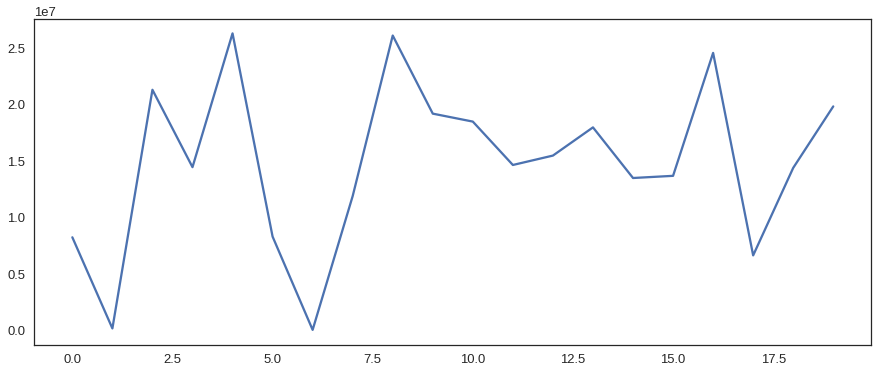

In [69]:
max_volume_trace = structural_model_trace[:,2]
plt.plot(max_volume_trace)

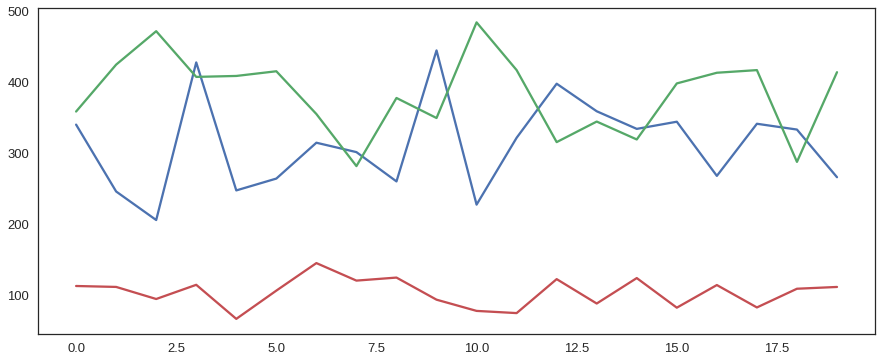

In [70]:
plt.plot(fw_res_th_trace)
plt.plot(fw_seal_th_trace)
plt.plot(fw_sec_res_th_trace)

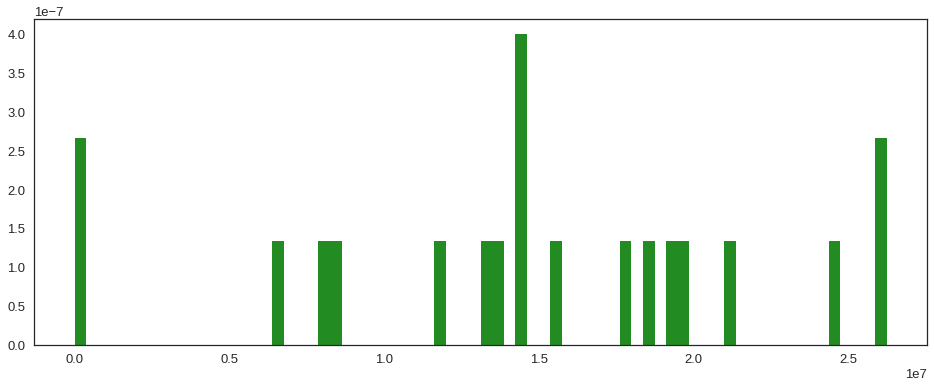

In [71]:
figsize(16, 6)

#_hist1 = plt.hist(max_volume_trace, bins=70, normed=True, histtype="stepfilled",label="prior distribution", color = "steelblue")
volumes = max_volume_trace
mask = volumes == 0
masked_trace = volumes[~mask]
_hist1 = plt.hist(max_volume_trace, bins=70, normed=True, histtype="stepfilled",label="prior distribution", color = "forestgreen")
#_hist1 = plt.hist(masked_trace, bins=70, normed=True, histtype="stepfilled",label="prior distribution", color = "steelblue")

In [186]:
#import datetime
counter = 0
for i in structural_model_trace[:]:
    counter+=1
    #print(np.ascontiguousarray(i[3]))
    gp.export_vtk_rectilinear(geo_data, np.ascontiguousarray(i[3]), path="./output_data/trap_volumes/13_10-TRAP_20iterUNCnoLH_%s" % (counter))
    gp.export_vtk_rectilinear(geo_data, np.ascontiguousarray(i[0][0]), path="./output_data/lith_blocks/13_10-LITH_20iterUNCnoLH_%s" % (counter))

In [70]:
# INFORMATION ENTROPY FUNCTIONS
def compute_prob_lith(lith_blocks):
    """Blocks must be just the lith blocks!"""
    lith_id = np.unique(lith_blocks)
    lith_count = np.zeros_like(lith_blocks[0:len(lith_id)])
    for i, l_id in enumerate(lith_id):
        lith_count[i] = np.sum(lith_blocks == l_id, axis=0)
    lith_prob = lith_count / len(lith_blocks)
    return lith_prob


def calculate_ie_masked(lith_prob):
    ie = np.zeros_like(lith_prob[0])
    for l in lith_prob:
        pm = np.ma.masked_equal(l, 0)  # mask where layer prob is 0
        ie -= (pm * np.ma.log2(pm)).filled(0)
    return ie


def calculate_ie_total(ie, absolute=False):
    if absolute:
        return np.sum(ie)
    else:
        return np.sum(ie) / np.size(ie)

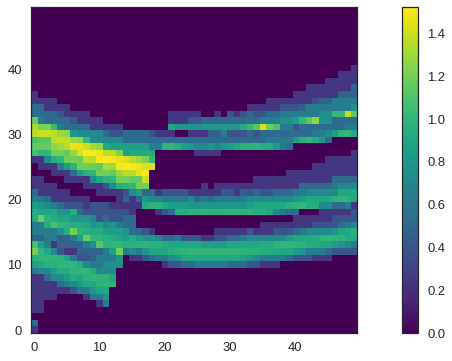

In [71]:
lith_blocks = []
for i in structural_model_trace[:]:
    #print(i[0][0])
    lith_blocks.append(i[0][0].astype(int))

lith_prob = compute_prob_lith(lith_blocks)
i_entropy = calculate_ie_masked(lith_prob)

plt.imshow(i_entropy.reshape(50,50,50)[:,0,:].T, origin="lower", cmap="viridis")
plt.colorbar()

In [72]:
#LOSS FUNCTIONS
estimates_s = np.arange(0,60000000, 10000)

#weight factors
ov = 1.25
ov_b = 2
uv_b = 1.5

#risk parameters
risks_s = np.arange(0.5, 1.6, 0.25)

#risk neutral
def volume_loss4(estimate_s, true_s):
        loss_s = np.zeros_like(true_s)
        underest = (estimate_s < true_s) 
        underest_bad = (estimate_s <= 0) & (true_s > 0)
        overest = (estimate_s > true_s) 
        overest_bad = (estimate_s > 0) & (true_s <= 0)
        loss_s[underest] = (true_s[underest] - estimate_s)
        loss_s[underest_bad] = (true_s[underest_bad] - estimate_s)*uv_b
        loss_s[overest] = (estimate_s - true_s[overest])*ov
        loss_s[overest_bad] = (estimate_s - true_s[overest_bad])*ov_b
        return loss_s

#including risk
def volume_lossR(estimate_s, true_s, risk_s):
        loss_s = np.zeros_like(true_s)
        underest = (estimate_s < true_s) 
        underest_bad = (estimate_s == 0) & (true_s > 0)
        overest = (estimate_s > true_s) 
        overest_bad = (estimate_s > 0) & (true_s == 0)
        loss_s[underest] = (true_s[underest] - estimate_s)
        loss_s[underest_bad] = (true_s[underest_bad] - estimate_s)*(uv_b*(risk_s**-0.5))
        loss_s[overest] = (estimate_s - true_s[overest])*(ov*risk_s)
        loss_s[overest_bad] = np.abs((true_s[overest_bad]-estimate_s))*(ov_b*risk_s)
        return loss_s
    
#def volume_lossR(estimate_s, true_s, risk_s):
#        loss_s = np.zeros_like(true_s)
#        underest = (estimate_s < true_s) 
#        underest_bad = (estimate_s <= 0) & (true_s > 0)
#        overest = (estimate_s > true_s) 
#        overest_bad = (estimate_s > 0) & (true_s <= 0)
#        loss_s[underest] = (true_s[underest] - estimate_s)
#        loss_s[underest_bad] = (true_s[underest_bad] - estimate_s)*(uv_b*(risk_s**-0.5))
#        loss_s[overest] = (estimate_s - true_s[overest])*(ov*risk_s)
#        loss_s[overest_bad] = (estimate_s - true_s[overest_bad])*(ov_b*risk_s)
#        return loss_s

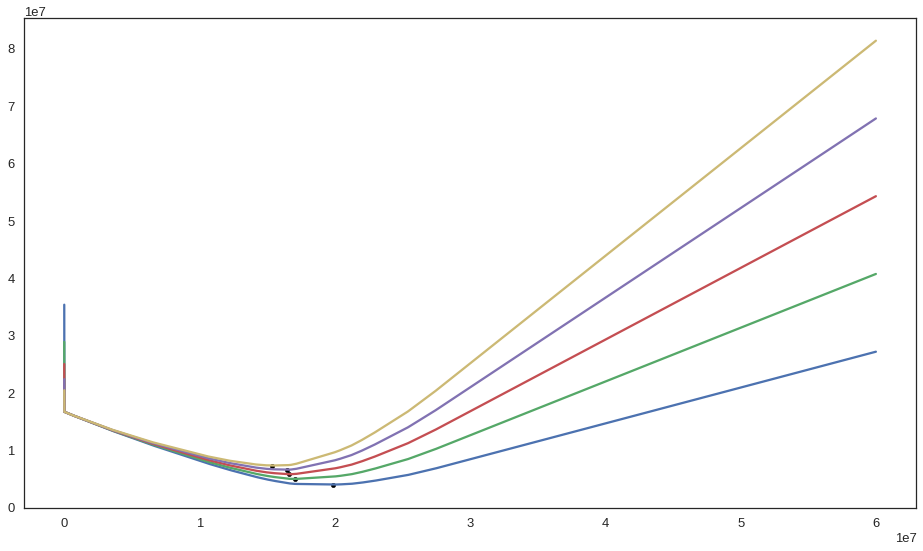

In [73]:
figsize(16, 9)

# No reduced uncertainty, different risks
BA_before = np.zeros_like(risks_s)
EL_before = np.zeros_like(risks_s)
expected_loss = lambda estimate_s, risk_s: volume_lossR(estimate_s, masked_trace, risk_s).mean()

counter = 0
for r in risks_s:
    loss = [expected_loss(e, r) for e in estimates_s]
    _min_score = sop.fmin(expected_loss, -40, args=(r,),disp = False)
    #print(_min_score)
    if _min_score < 0:
        _min_score = 0
    plt.plot(estimates_s, loss, label = "Risk r "+str(r))
    plt.scatter(_min_score, expected_loss(_min_score,r), s = 20, color = 'black')
    #lt.vlines(_min_results, 0, 0.02, color = 'black', linestyles="--")
    #print("Bayes action (minimum) at risk r %.2f: %.2f" % (r, _min_score))
    BA_before[counter] = _min_score
    EL_before[counter] = expected_loss(_min_score,r)
    counter += 1


In [72]:
# THICKNESS LIKELIHOOD FUNCTIONS
#Additional information, updating with likelihoods

#return fw_res_th, fw_seal_th, fw_sec_res_th, fw_rb_z, fw_sb_z, fw_r2b_z, fw_ob_z

std1 = 10
std2 = 20
std3 = 20

@pymc.stochastic
def sec_res_th_likelihood(value = 0, sec_res_th=sec_res_th):
    return pymc.normal_like(sec_res_th, 120., 1./np.square(std1))

@pymc.stochastic
def seal_th_likelihood(value = 0, seal_th=seal_th):
    return pymc.normal_like(seal_th, 400., 1./np.square(std2))

@pymc.stochastic
def res_th_likelihood(value = 0, res_th=res_th):
    return pymc.normal_like(res_th, 250., 1./np.square(std3))

In [73]:
#model = pymc.Model([pos_unc_model, z_unc_res_top, fault_sealing, fw_th, hw_th, 
#                    res_th_likelihood, seal_th_likelihood, sec_res_th_likelihood])
model_L = pymc.Model([interp_unc, z_unc_res_top, z_unc_base_top, z_unc_seal_top, z_unc_secres_top, offset_unc,
                    fault_sealing, structural_model, 
                    res_th, seal_th, sec_res_th, 
                    res_th_likelihood, seal_th_likelihood, sec_res_th_likelihood])

In [74]:
geo_data.foliations

,X,Y,Z,azimuth,dip,polarity,formation,series,order_series,isFault,formation number,annotations,G_x,G_y,G_z
0,917.449982,1000.000000,864.602020,270,71.565,1,MainFault,fault,1,True,1,"${\bf{x}}_{\beta \,{\bf{1}},0}$",-0.948683,7.190174e-16,0.316229
1,418.445340,1119.607187,978.563891,90,18.435,1,Res_Top,Rest,2,False,4,"${\bf{x}}_{\beta \,{\bf{4}},0}$",0.316229,-0.000000e+00,0.948683


Z variations top to bottom: 10.6749462742 -0.992853575776 -14.942043981 18.9533652932
Fault offset variation: -48.5541117806
Z variations top to bottom: 10.6749462742 -0.992853575776 -14.942043981 21.1158007086
Fault offset variation: -48.5541117806
Z variations top to bottom: 10.6749462742 -0.992853575776 -14.942043981 21.1158007086
Fault offset variation: -21.5083198589
Z variations top to bottom: 37.442573844 -0.992853575776 -14.942043981 21.1158007086
Fault offset variation: 

/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:69: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:71: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:80: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:81: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:82: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:58: UserWarning: Boolean Serie

-21.5083198589
Z variations top to bottom: 10.6749462742 -0.992853575776 -20.9426222978 21.1158007086
Fault offset variation: -21.5083198589
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.631912182567534e-24
  ' condition number: {}'.format(rcond), RuntimeWarning)
/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:98: DeprecationWarning: numpy boolean subtract, the `-` operator, is deprecated, use the bitwise_xor, the `^` operator, or the logical_xor function instead.


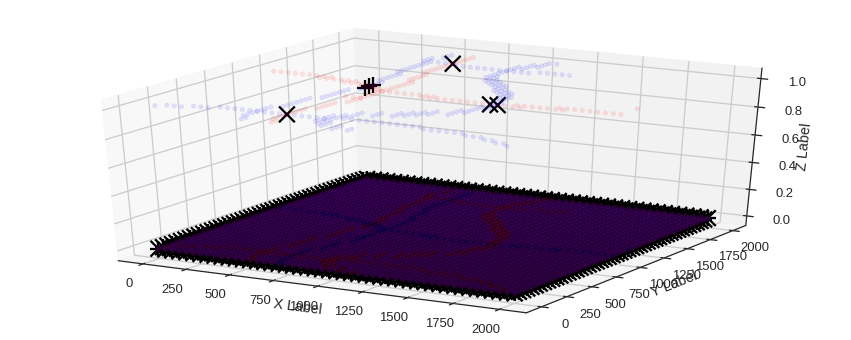

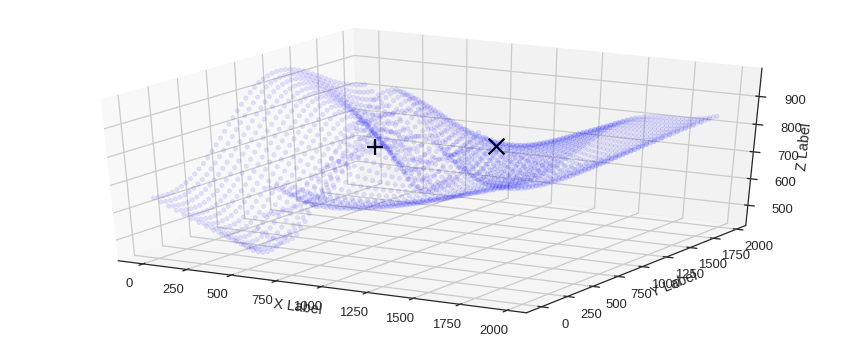

SPILL POINT: [ 1346.9387207    897.95916748   816.06337781]
Leak Point: [  612.24487305  1020.40814209   746.39403878]
Spill point defines trap.
Fault is pathway. Down to spill.


/home/bl9/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  # This is added back by InteractiveShellApp.init_path()


Safe TRAP FOUND, section: 10
Maximum reservoir volume: 18112000.0 m³
 [---              10%                  ] 2 of 20 complete in 14.5 secZ variations top to bottom: 10.6749462742 -0.88182360538 -20.9426222978 21.1158007086
Fault offset variation: -21.5083198589
Z variations top to bottom: 10.6749462742 -0.88182360538 -20.9426222978 30.1856474623
Fault offset variation: -21.5083198589
Z variations top to bottom: 10.6749462742 -0.88182360538 -20.9426222978 30.1856474623
Fault offset variation: -142.793374238
Z variations top to bottom: 11.7383265573 -0.88182360538 -20.9426222978 30.1856474623
Fault offset variation: -21.5083198589
Z variations top to bottom: 11.7383265573 -0.88182360538 -47.3686183626 30.1856474623
Fault offset variation: -21.5083198589
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.0136563167039477e-25
  ' condition number: {}'.format(rcond), RuntimeWarning)


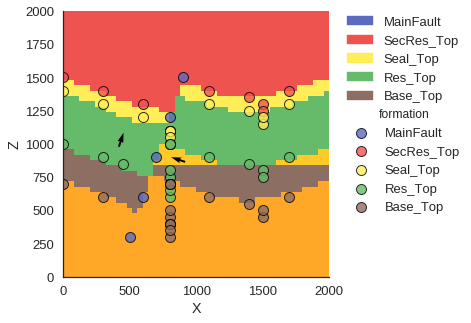

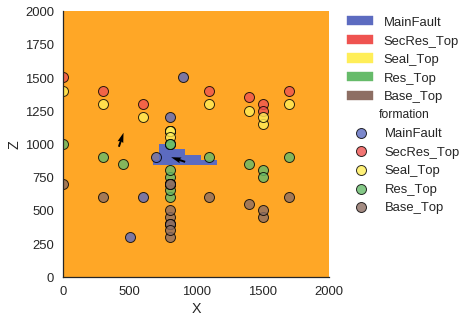

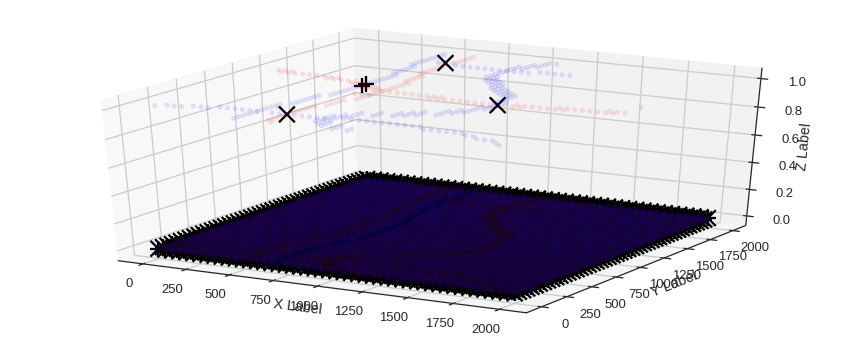

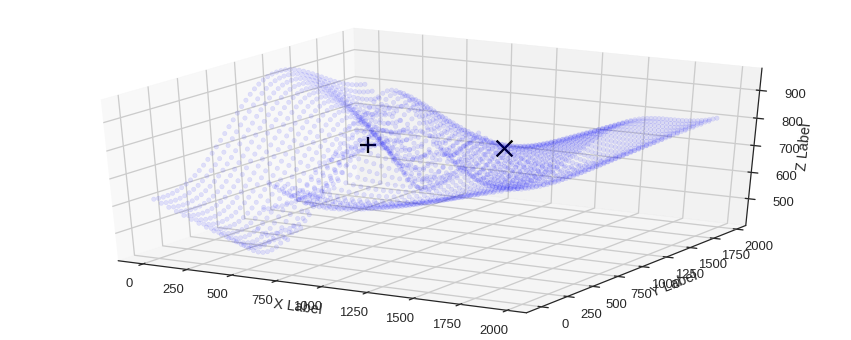

SPILL POINT: [ 1387.75512695   897.95916748   790.04352354]
Leak Point: [  571.42858887  1020.40814209   726.45245263]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 23360000.0 m³
 [-----            15%                  ] 3 of 20 complete in 30.8 secZ variations top to bottom: 11.7383265573 -2.11408353811 -20.9426222978 30.1856474623
Fault offset variation: -21.5083198589
Z variations top to bottom: 11.7383265573 -2.11408353811 -20.9426222978 10.7822590842
Fault offset variation: -21.5083198589
Z variations top to bottom: 11.7383265573 -2.11408353811 -20.9426222978 10.7822590842
Fault offset variation: 16.2406271749
Z variations top to bottom: 20.1889695333 -2.11408353811 -20.9426222978 10.7822590842
Fault offset variation: 16.2406271749
Z variations top to bottom: 11.7383265573 -2.11408353811 -5.00393615388 10.7822590842
Fault offset variation: 16.2406271749
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 8.332066754157546e-24
  ' condition number: {}'.format(rcond), RuntimeWarning)


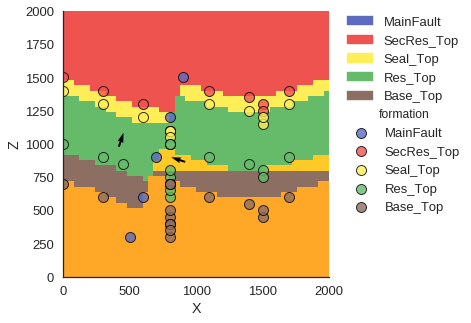

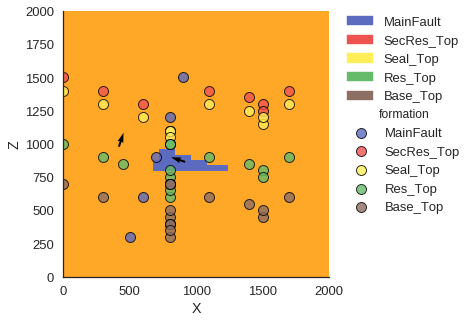

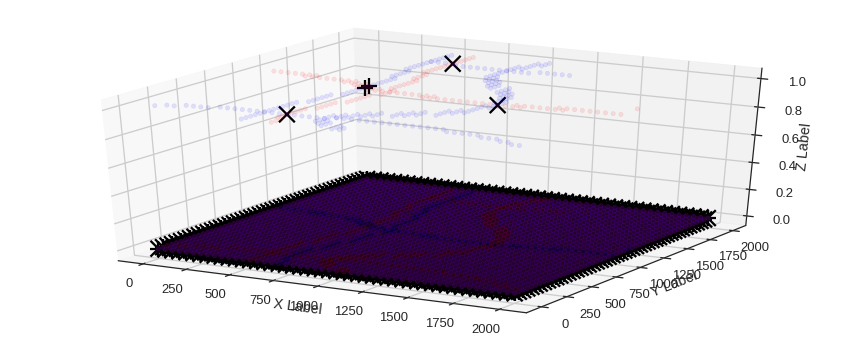

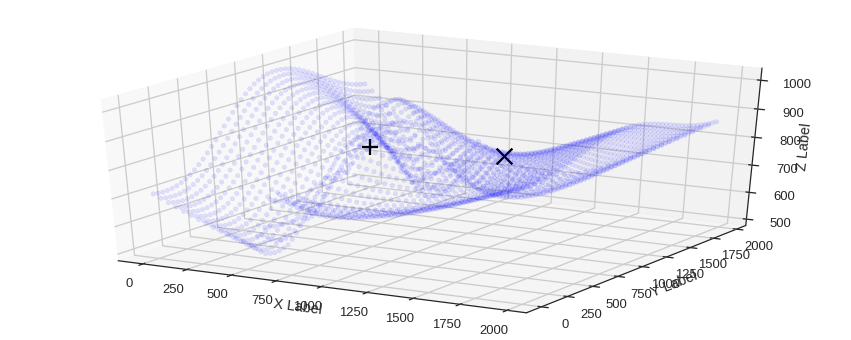

SPILL POINT: [ 1387.75512695   897.95916748   831.49545038]
Leak Point: [ 612.24487305  979.59185791  796.73988207]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 23232000.0 m³
 [-------          20%                  ] 4 of 20 complete in 45.4 secZ variations top to bottom: 11.7383265573 -2.0084584004 -5.00393615388 10.7822590842
Fault offset variation: 16.2406271749
Z variations top to bottom: 11.7383265573 -2.0084584004 -5.00393615388 3.38716091428
Fault offset variation: 16.2406271749
Z variations top to bottom: 11.7383265573 -2.0084584004 -5.00393615388 10.7822590842
Fault offset variation: -61.7166207637
Z variations top to bottom: 28.593561315 -2.0084584004 -5.00393615388 10.7822590842
Fault offset variation: -61.7166207637
Z variations top to bottom: 11.7383265573 -2.0084584004 1.21624320783 10.7822590842
Fault offset variation: -61.7166207637
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 1.2346690288802058e-22
  ' condition number: {}'.format(rcond), RuntimeWarning)


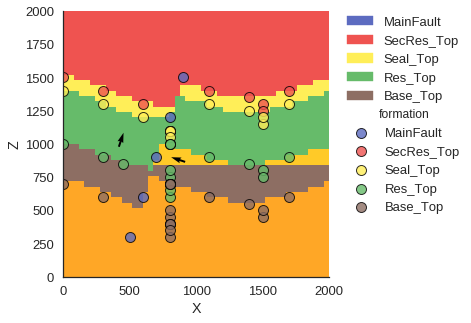

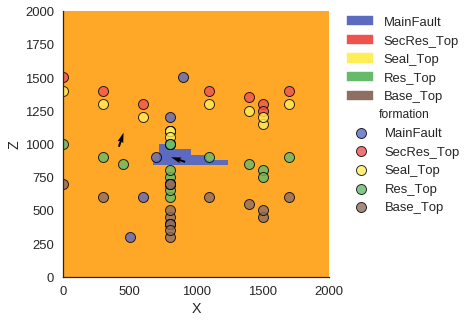

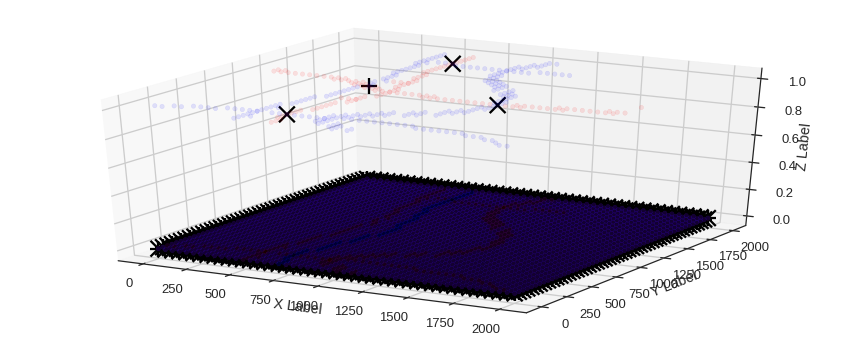

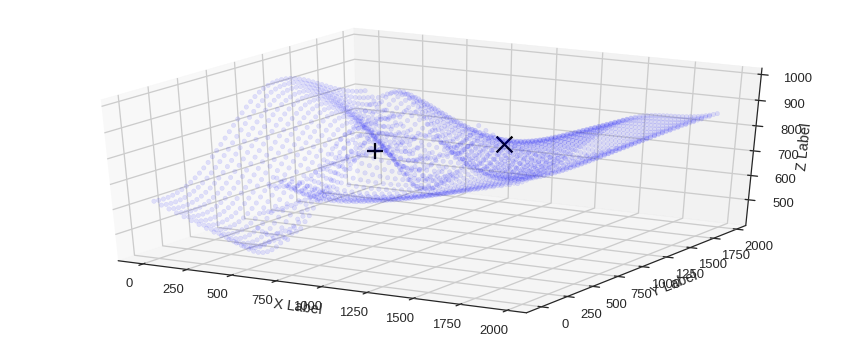

SPILL POINT: [ 1387.75512695   897.95916748   837.77347664]
Leak Point: [  612.24487305  1020.40814209   730.21966793]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 25472000.0 m³
 [---------        25%                  ] 5 of 20 complete in 60.8 secZ variations top to bottom: 11.7383265573 -2.67371655453 1.21624320783 10.7822590842
Fault offset variation: -61.7166207637
Z variations top to bottom: 11.7383265573 -2.67371655453 1.21624320783 19.3992509368
Fault offset variation: -61.7166207637
Z variations top to bottom: 11.7383265573 -2.67371655453 1.21624320783 19.3992509368
Fault offset variation: -122.460016011
Z variations top to bottom: 6.99984523768 -2.67371655453 1.21624320783 19.3992509368
Fault offset variation: -61.7166207637
Z variations top to bottom: 6.99984523768 -2.67371655453 7.08315633175 19.3992509368
Fault offset variation: -61.7166207637
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.323986466761187e-34
  ' condition number: {}'.format(rcond), RuntimeWarning)


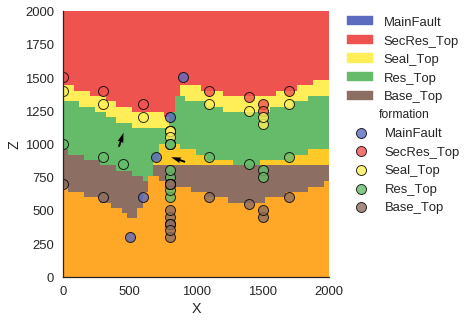

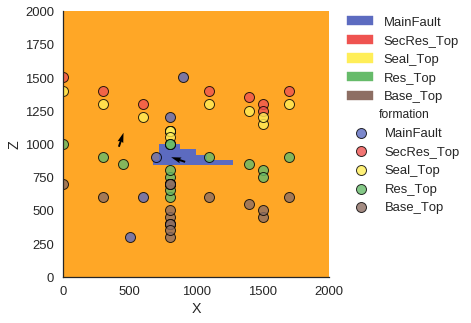

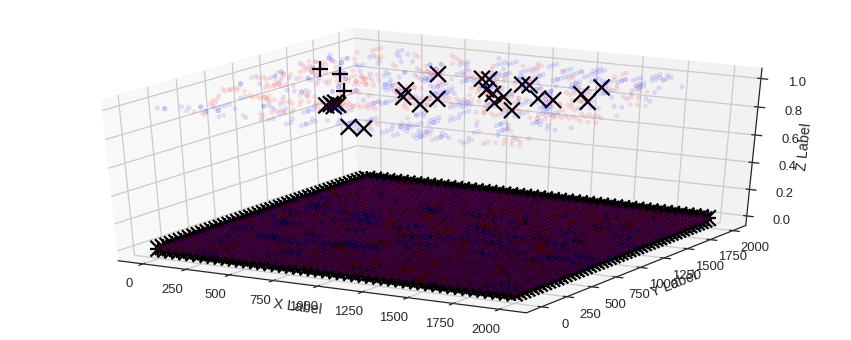

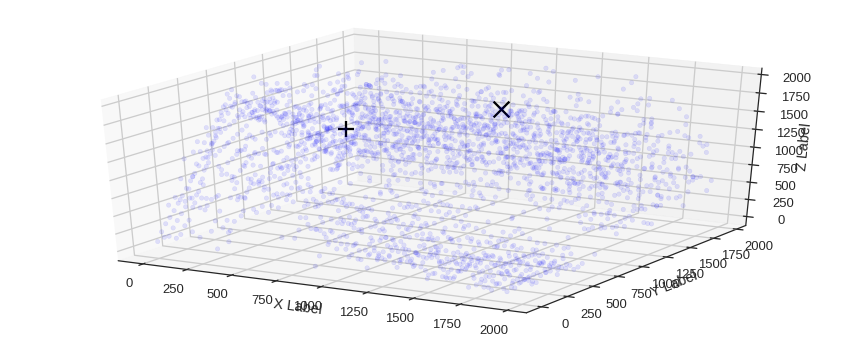

SPILL POINT: [ 1346.9387207    938.7755127   1859.20691531]
Leak Point: [  326.53060913  1224.48974609  1187.16877508]
Spill point defines trap.
Fault is pathway. Down to spill.
Trap section 2444 is juxtaposed to section 1476
Trap section 2444 is juxtaposed to section 697
Trap 2444 is juxtaposed --> leaking
Safe TRAP FOUND, section: 2283
Trap section 2188 is juxtaposed to section 1671
Trap section 2188 is juxtaposed to section 2191
Trap 2188 is juxtaposed --> leaking
Safe TRAP FOUND, section: 2520
Trap section 2058 is juxtaposed to section 697
Trap 2058 is juxtaposed --> leaking
Trap section 2021 is juxtaposed to section 697
Trap 2021 is juxtaposed --> leaking
Trap section 2020 is juxtaposed to section 1476
Trap section 2020 is juxtaposed to section 697
Trap 2020 is juxtaposed --> leaking
Safe TRAP FOUND, section: 2402
Trap section 2533 is juxtaposed to section 1476
Trap section 2533 is juxtaposed to section 697
Trap 2533 is juxtaposed --> leaking
Trap section 1915 is juxtaposed to sec

/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 3.079710103744385e-21
  ' condition number: {}'.format(rcond), RuntimeWarning)


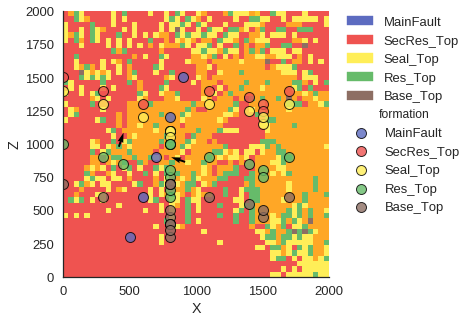

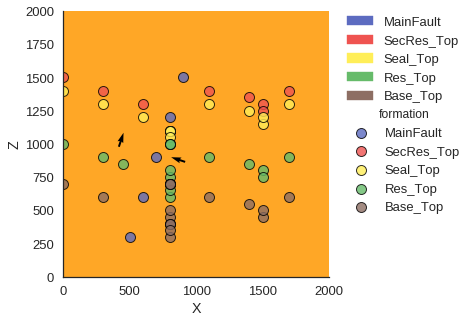

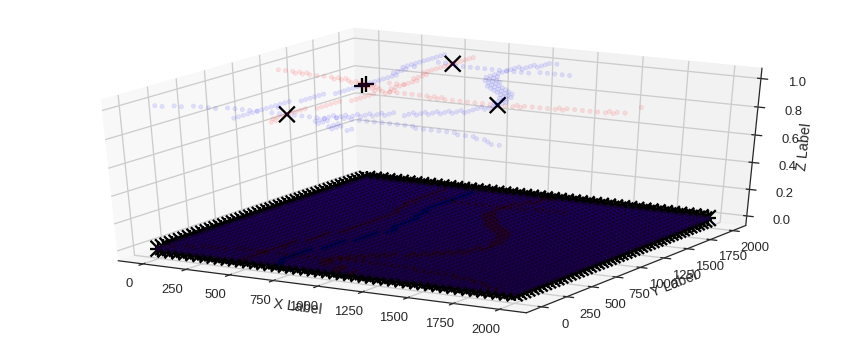

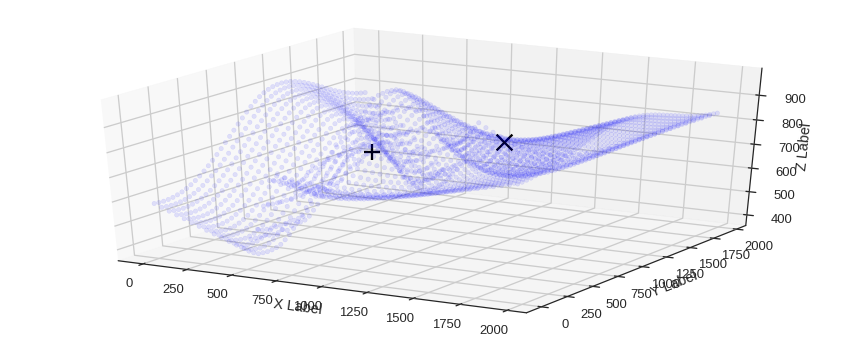

SPILL POINT: [ 1387.75512695   897.95916748   820.45963857]
Leak Point: [  571.42858887  1061.2244873    688.59747735]
Spill point defines trap.
Fault is sealing. Down to spill.
TRAP FOUND, section: 10
Maximum reservoir volume: 19264000.0 m³
 [-------------    35%                  ] 7 of 20 complete in 101.9 secZ variations top to bottom: 13.6772341402 -0.537599840019 -16.2877148626 33.7296985749
Fault offset variation: -83.0149772032
Z variations top to bottom: 13.6772341402 -0.537599840019 -16.2877148626 12.1947546412
Fault offset variation: -83.0149772032
Z variations top to bottom: 13.6772341402 -0.537599840019 -16.2877148626 12.1947546412
Fault offset variation: -71.1767554129
Z variations top to bottom: 13.7840871165 -0.537599840019 -16.2877148626 12.1947546412
Fault offset variation: -71.1767554129
Z variations top to bottom: 13.7840871165 -0.537599840019 -1.88512414887 12.1947546412
Fault offset variation: -71.1767554129
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.587850573635949e-24
  ' condition number: {}'.format(rcond), RuntimeWarning)


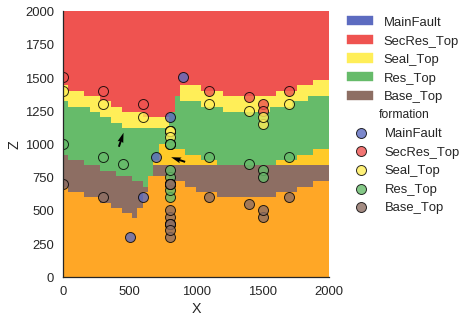

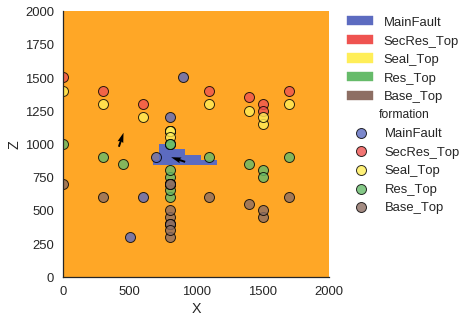

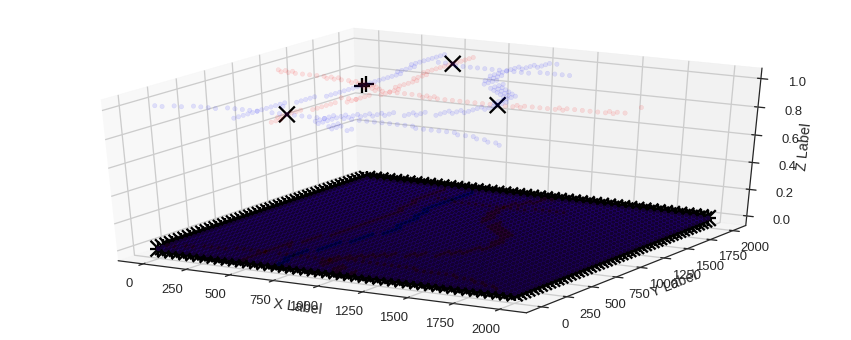

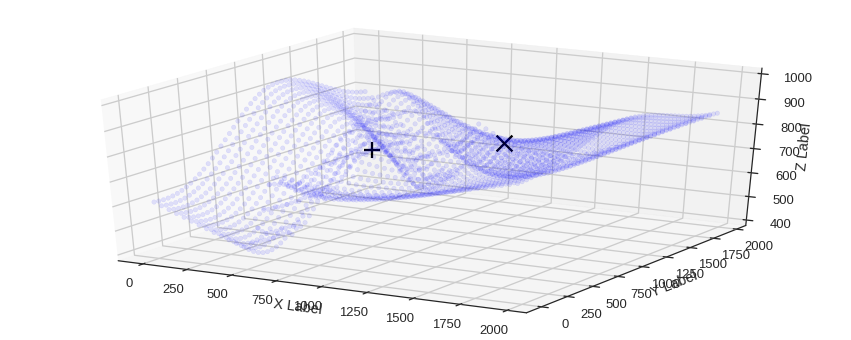

SPILL POINT: [ 1387.75512695   897.95916748   834.7066391 ]
Leak Point: [  571.42858887  1061.2244873    717.80193664]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 24000000.0 m³
 [---------------  40%                  ] 8 of 20 complete in 119.2 secZ variations top to bottom: 13.7840871165 -1.19544821122 -1.88512414887 12.1947546412
Fault offset variation: -71.1767554129
Z variations top to bottom: 13.7840871165 -1.19544821122 -1.88512414887 -5.71118362429
Fault offset variation: -71.1767554129
Z variations top to bottom: 13.7840871165 -1.19544821122 -1.88512414887 12.1947546412
Fault offset variation: -96.5100488305
Z variations top to bottom: 14.9459264467 -1.19544821122 -1.88512414887 12.1947546412
Fault offset variation: -71.1767554129
Z variations top to bottom: 14.9459264467 -1.19544821122 -1.21771918698 12.1947546412
Fault offset variation: -71.1767554129
Fault sealing = True


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.344430007134933e-24
  ' condition number: {}'.format(rcond), RuntimeWarning)


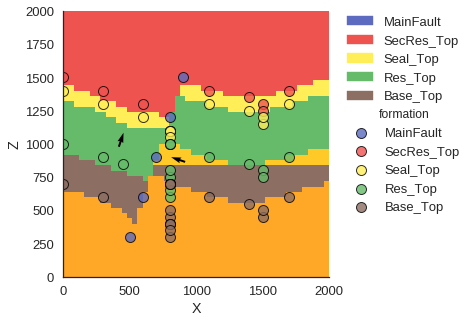

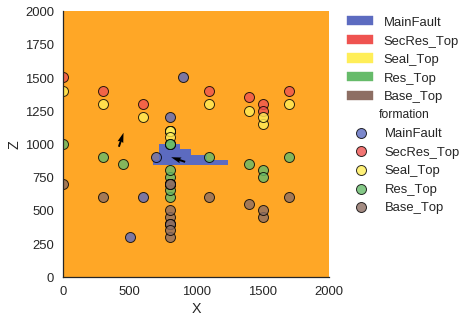

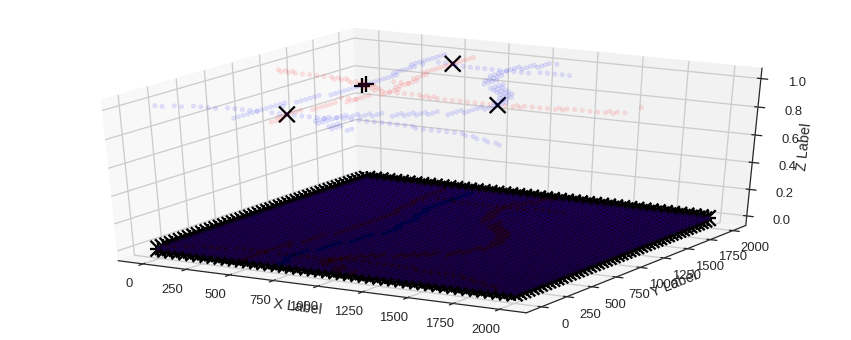

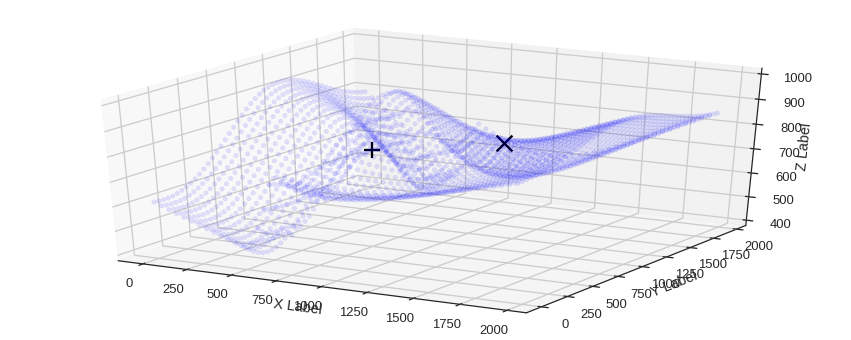

SPILL POINT: [ 1387.75512695   897.95916748   835.36815585]
Leak Point: [  571.42858887  1061.2244873    718.57108877]
Spill point defines trap.
Fault is sealing. Down to spill.
TRAP FOUND, section: 10
Maximum reservoir volume: 24192000.0 m³
 [-----------------45%                  ] 9 of 20 complete in 134.7 secZ variations top to bottom: 14.9459264467 -1.41953030729 -1.21771918698 12.1947546412
Fault offset variation: -71.1767554129
Z variations top to bottom: 14.9459264467 -1.41953030729 -1.21771918698 7.03680789746
Fault offset variation: -71.1767554129
Z variations top to bottom: 14.9459264467 -1.41953030729 -1.21771918698 12.1947546412
Fault offset variation: -92.3625672449
Z variations top to bottom: 12.4475123356 -1.41953030729 -1.21771918698 12.1947546412
Fault offset variation: -92.3625672449
Z variations top to bottom: 12.4475123356 -1.41953030729 33.3714286955 12.1947546412
Fault offset variation: -92.3625672449
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 2.4382886114552176e-22
  ' condition number: {}'.format(rcond), RuntimeWarning)


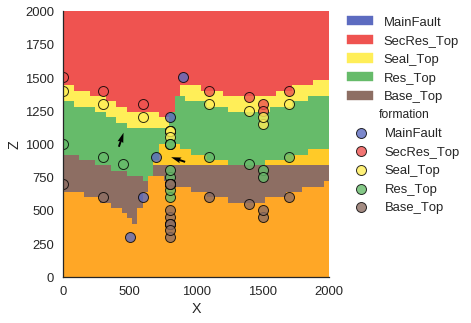

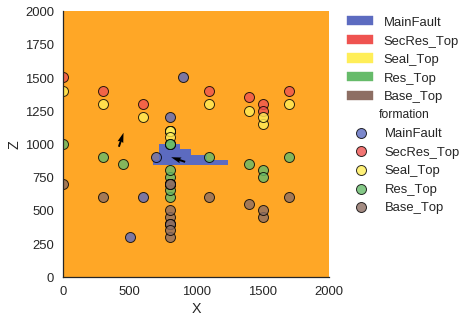

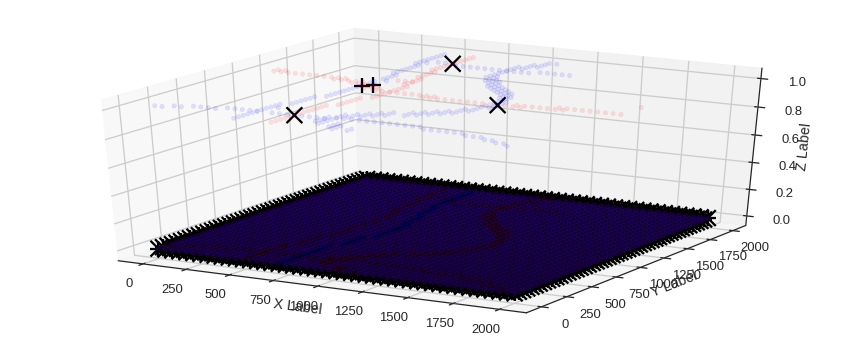

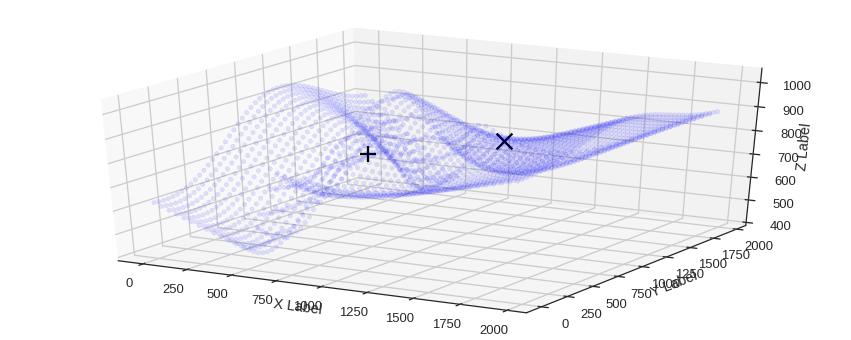

SPILL POINT: [ 1387.75512695   897.95916748   869.20230187]
Leak Point: [  571.42858887  1020.40814209   730.09566299]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 20416000.0 m³
 [-----------------50%                  ] 10 of 20 complete in 149.4 secZ variations top to bottom: 12.4475123356 0.542120918386 -1.21771918698 12.1947546412
Fault offset variation: -92.3625672449
Z variations top to bottom: 12.4475123356 -1.41953030729 -1.21771918698 24.0491668866
Fault offset variation: -92.3625672449
Z variations top to bottom: 12.4475123356 -1.41953030729 -1.21771918698 24.0491668866
Fault offset variation: -116.139621006
Z variations top to bottom: -5.68917580765 -1.41953030729 -1.21771918698 24.0491668866
Fault offset variation: -116.139621006
Z variations top to bottom: 12.4475123356 -1.41953030729 -3.61863194441 24.0491668866
Fault offset variation: -116.139621006
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 7.376276711847677e-34
  ' condition number: {}'.format(rcond), RuntimeWarning)


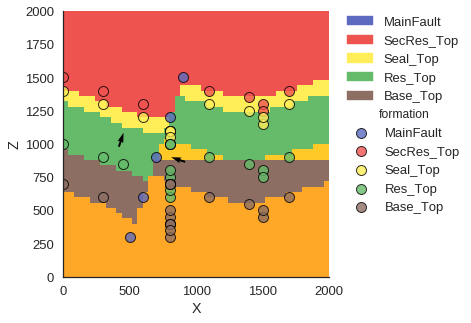

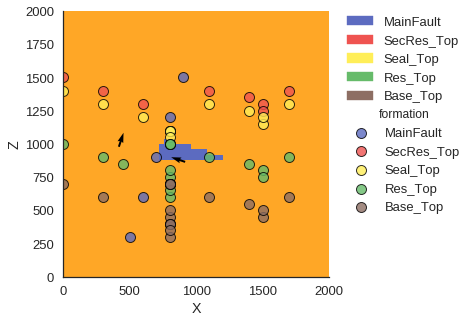

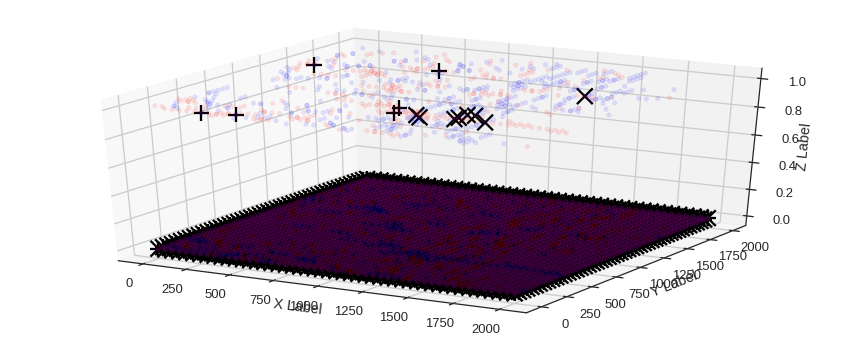

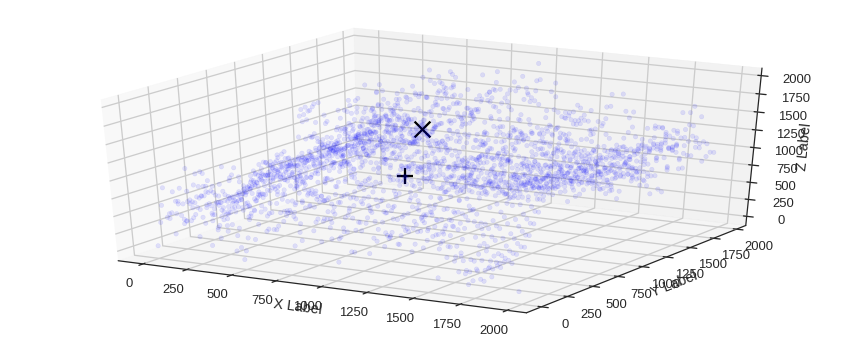

SPILL POINT: [ 1183.67346191   489.79592896  1780.7989424 ]
Leak Point: [ 1020.40814209   612.24487305  1024.18199779]
Spill point defines trap.
Fault is pathway. Down to spill.
Trap section 1810 is juxtaposed to section 1811
Trap section 1810 is juxtaposed to section 1809
Trap section 1810 is juxtaposed to section 550
Trap 1810 is juxtaposed --> leaking
Trap section 1548 is juxtaposed to section 1614
Trap section 1548 is juxtaposed to section 1612
Trap section 1548 is juxtaposed to section 1143
Trap section 1548 is juxtaposed to section 3
Trap section 1548 is juxtaposed to section 550
Trap 1548 is juxtaposed --> leaking
Trap section 1991 is juxtaposed to section 550
Trap 1991 is juxtaposed --> leaking
Trap section 2378 is juxtaposed to section 550
Trap 2378 is juxtaposed --> leaking
Trap section 1952 is juxtaposed to section 741
Trap section 1952 is juxtaposed to section 550
Trap 1952 is juxtaposed --> leaking
Trap section 1790 is juxtaposed to section 550
Trap 1790 is juxtaposed --> 

/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 4.312576505822831e-22
  ' condition number: {}'.format(rcond), RuntimeWarning)


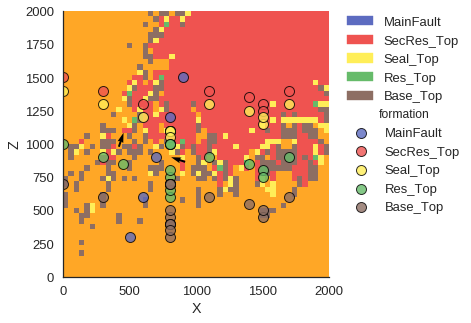

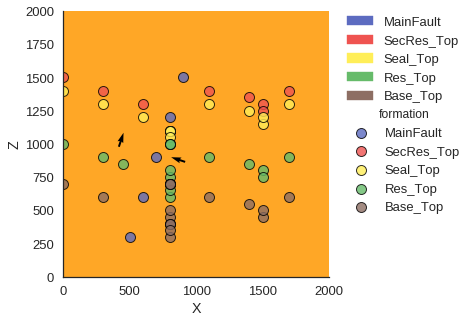

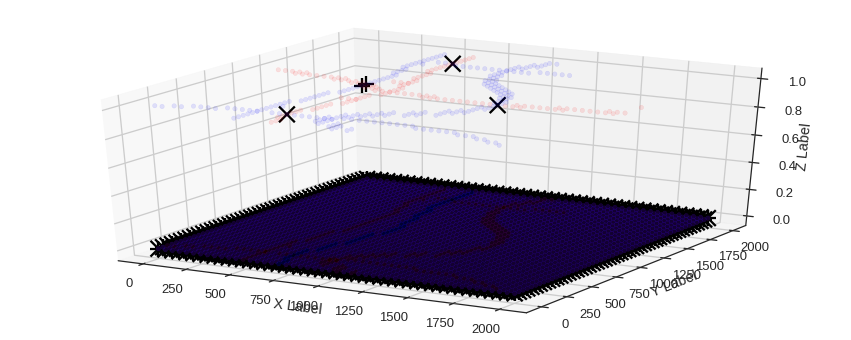

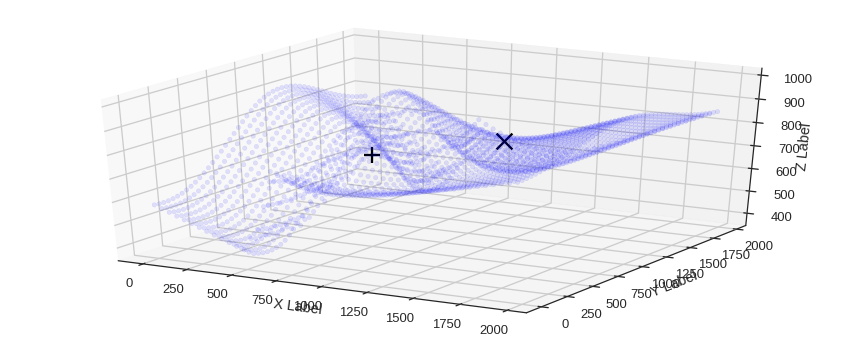

SPILL POINT: [ 1387.75512695   897.95916748   839.56794921]
Leak Point: [  571.42858887  1061.2244873    682.59366132]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 25984000.0 m³
 [-----------------60%--                ] 12 of 20 complete in 192.3 secZ variations top to bottom: 11.0996572079 -3.38870018756 3.02463967753 24.0491668866
Fault offset variation: -105.945751819
Z variations top to bottom: 11.0996572079 -3.38870018756 3.02463967753 17.0303657479
Fault offset variation: -105.945751819
Z variations top to bottom: 11.0996572079 -3.38870018756 3.02463967753 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.38870018756 3.02463967753 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.38870018756 15.7606116765 24.0491668866
Fault offset variation: -55.0796538097
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.660713271908404e-25
  ' condition number: {}'.format(rcond), RuntimeWarning)


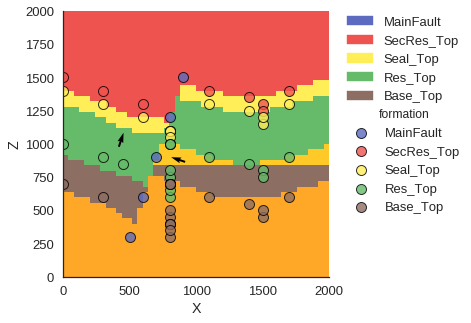

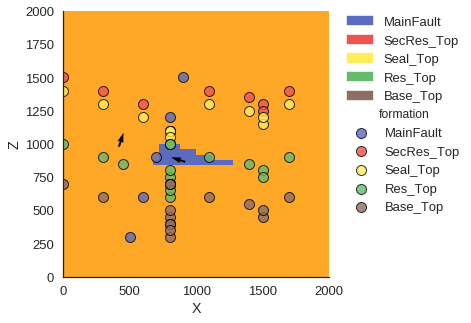

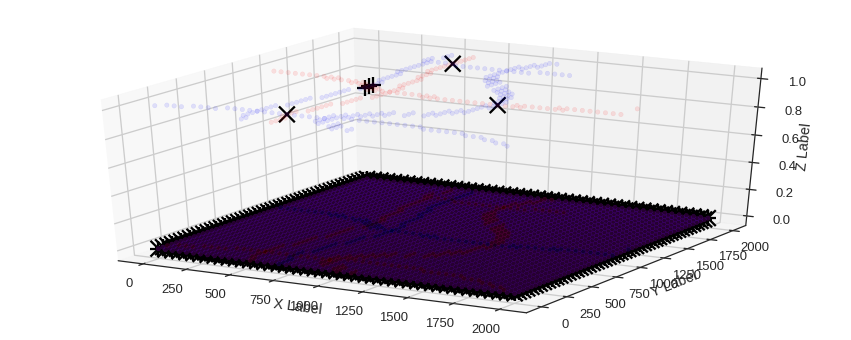

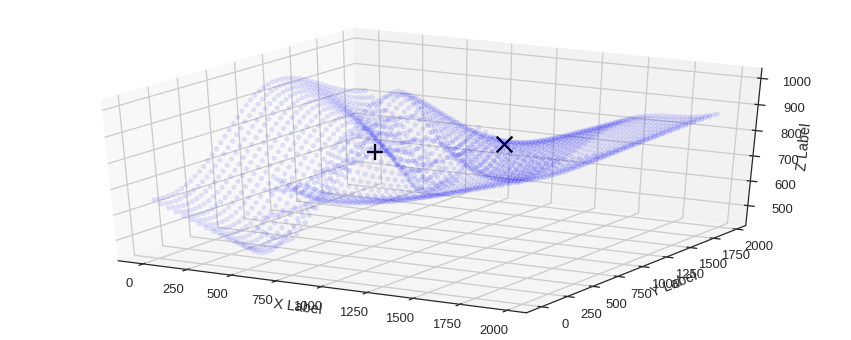

SPILL POINT: [ 1387.75512695   897.95916748   851.9050102 ]
Leak Point: [  612.24487305  1020.40814209   746.22408631]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 15616000.0 m³
 [-----------------65%----              ] 13 of 20 complete in 207.1 secZ variations top to bottom: 1.15237289272 -1.30955887797 3.02463967753 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.38870018756 3.02463967753 -14.7884147369
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.38870018756 3.02463967753 24.0491668866
Fault offset variation: -125.999980956
Z variations top to bottom: -12.3112271253 -3.38870018756 3.02463967753 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.38870018756 3.02463967753 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.38870018756 6.

/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 8.031808988053137e-24
  ' condition number: {}'.format(rcond), RuntimeWarning)


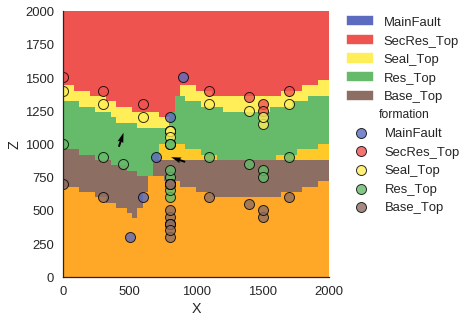

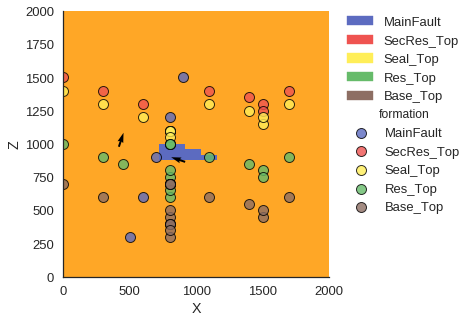

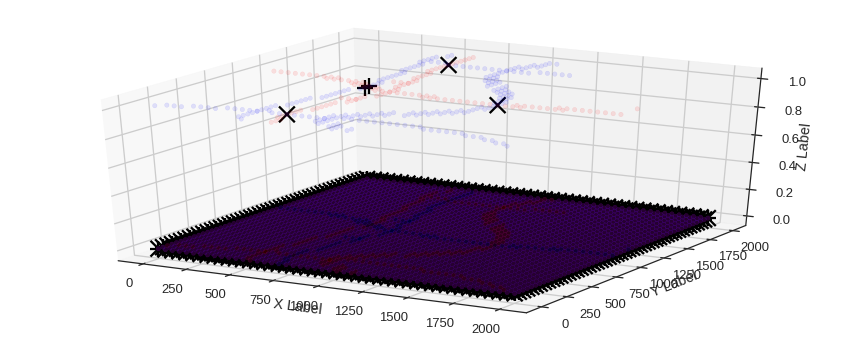

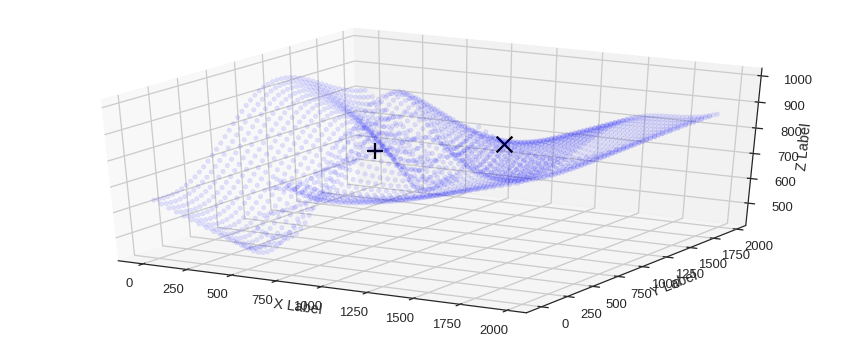

SPILL POINT: [ 1387.75512695   897.95916748   842.87273505]
Leak Point: [  612.24487305  1020.40814209   739.09077907]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 13632000.0 m³
 [-----------------70%------            ] 14 of 20 complete in 221.9 secZ variations top to bottom: 1.15237289272 -3.95309505 6.45652803189 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.95309505 6.45652803189 22.3549595134
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.95309505 6.45652803189 24.0491668866
Fault offset variation: -150.211398621
Z variations top to bottom: -18.0166812304 -3.95309505 6.45652803189 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.95309505 6.45652803189 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.95309505 9.34508864024 24.0491

/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 6.18129737535804e-25
  ' condition number: {}'.format(rcond), RuntimeWarning)


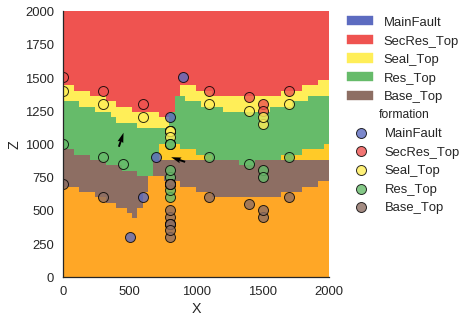

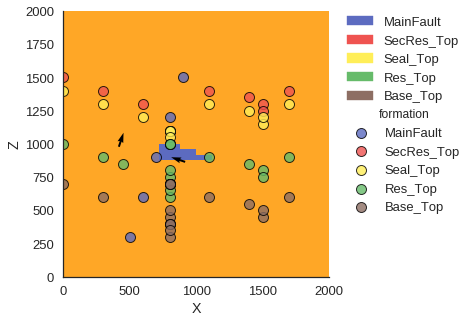

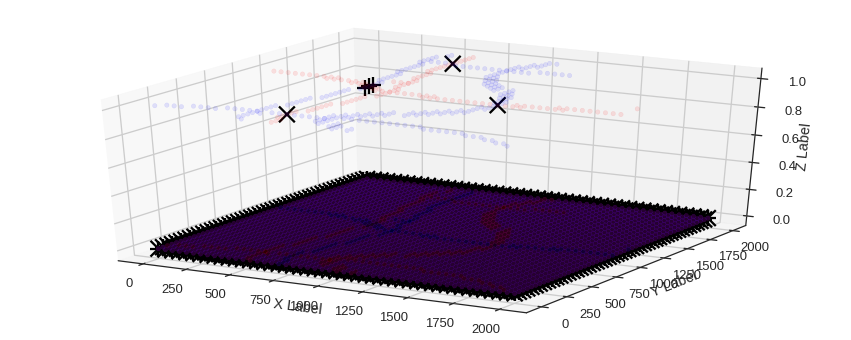

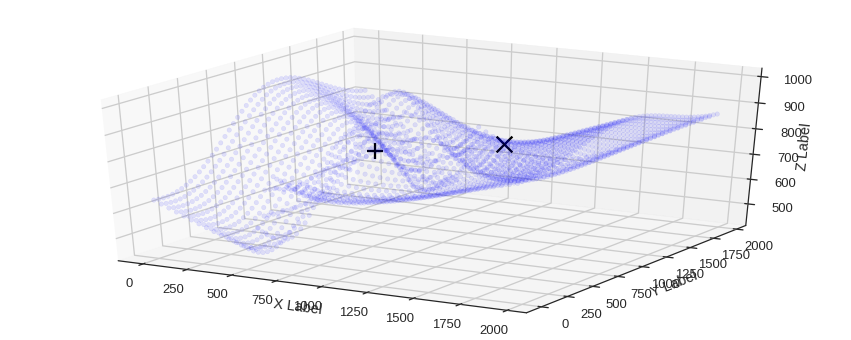

SPILL POINT: [ 1387.75512695   897.95916748   845.63238523]
Leak Point: [  612.24487305  1020.40814209   741.29384162]
Spill point defines trap.
Fault is pathway. Down to spill.
Safe TRAP FOUND, section: 10
Maximum reservoir volume: 14080000.0 m³
 [-----------------75%--------          ] 15 of 20 complete in 237.0 secZ variations top to bottom: 1.15237289272 -3.50356416206 9.34508864024 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.50356416206 9.34508864024 -13.6550308404
Fault offset variation: -55.0796538097
Z variations top to bottom: 1.15237289272 -3.50356416206 9.34508864024 24.0491668866
Fault offset variation: -151.913127785
Z variations top to bottom: -2.9973298975 -3.50356416206 9.34508864024 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: -2.9973298975 -3.50356416206 -26.5051775349 24.0491668866
Fault offset variation: -55.0796538097
Fault sealing = False


/home/bl9/anaconda3/lib/python3.5/site-packages/scipy/linalg/basic.py:223: RuntimeWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number: 9.806533469337032e-25
  ' condition number: {}'.format(rcond), RuntimeWarning)


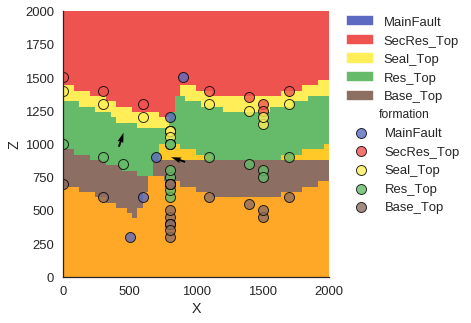

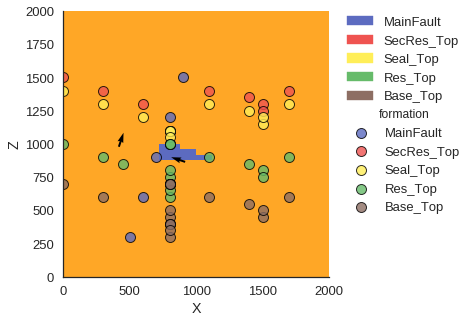

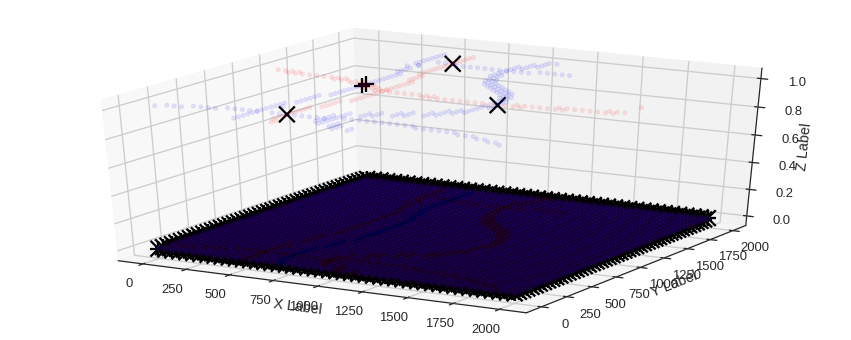

 [-----------------80%----------        ] 16 of 20 complete in 255.8 sec

/home/bl9/anaconda3/lib/python3.5/site-packages/pymc/database/base.py:282: UserWarning: 
Error tallying structural_model, will not try to tally it again this chain.
Did you make all the samevariables and step methods tallyable
as were tallyable last time you used the database file?

Error:

Traceback (most recent call last):
  File "/home/bl9/anaconda3/lib/python3.5/site-packages/pymc/database/base.py", line 272, in tally
    self._traces[name].tally(chain)
  File "/home/bl9/anaconda3/lib/python3.5/site-packages/pymc/database/ram.py", line 94, in tally
    value = self._getfunc()
  File "/home/bl9/anaconda3/lib/python3.5/site-packages/pymc/PyMCObjects.py", line 468, in get_value
    _value = self._value.get()
  File "LazyFunction.pyx", line 280, in pymc.LazyFunction.LazyFunction.get (pymc/LazyFunction.c:2568)
  File "<ipython-input-64-86300702a151>", line 96, in structural_model
    max_vol, lith_sol[0], bottom, trap = max_trap_vol(interp_data_M, lith_block, fault_block, res_top_surf, 

Z variations top to bottom: -2.9973298975 -4.11706196991 -26.5051775349 24.0491668866
Fault offset variation: -55.0796538097
Z variations top to bottom: -2.9973298975 -4.11706196991 -26.5051775349 25.8468334343
Fault offset variation: -55.0796538097
Z variations top to bottom: -2.9973298975 -4.11706196991 -26.5051775349 25.8468334343
Fault offset variation: -43.3236294108
Z variations top to bottom: 5.34101134604 -4.11706196991 -26.5051775349 25.8468334343
Fault offset variation: -43.3236294108
Z variations top to bottom: 5.34101134604 -4.11706196991 -34.9739772087 25.8468334343
Fault offset variation: -43.3236294108
Z variations top to bottom: 5.34101134604 -5.94149970496 -26.5051775349 25.8468334343
Fault offset variation: -43.3236294108
Z variations top to bottom: 5.34101134604 -5.94149970496 -26.5051775349 30.5849849735
Fault offset variation: -43.3236294108
Z variations top to bottom: 5.34101134604 -5.94149970496 -26.5051775349 30.5849849735
Fault offset variation: -0.673267855445

In [75]:
M_L = pymc.MCMC(model_L)
M_L.sample(iter=iterations)

In [35]:
res_top_unc_trace_L = M_L.trace('z_unc_res_top')[:]
offset_unc_trace_L = M_L.trace('offset_unc')[:]
fault_sealing_trace_L = M_L.trace('fault_sealing_unc')[:]
structural_model_trace_L = M_L.trace('structural_model')[:] #[0]=lith_sol,[1]=fault:sol,[2]=max_volume

fw_res_th_trace_L = M_L.trace('res_th')[:]
fw_seal_th_trace_L = M_L.trace('seal_th')[:]
fw_sec_res_th_trace_L = M_L.trace('sec_res_th')[:]

interp_trace_L = M_L.trace('interp_unc')[:]

#for j in range(iterations):
#    plt.figure()
#    #plt.title('Change in res_top: %s' % bla[j])
#    #print(bla[j])
#    if fault_sealing == True:
#        print("Fault is sealed.")
#    else:
#        print("Fault is permeable.")
#    print("Max. trap volume = ", trap_volume_trace[j][2])
#    gp.plot_section(geo_data, trap_volume_trace[j][0][0,0], 25, plot_data =1)

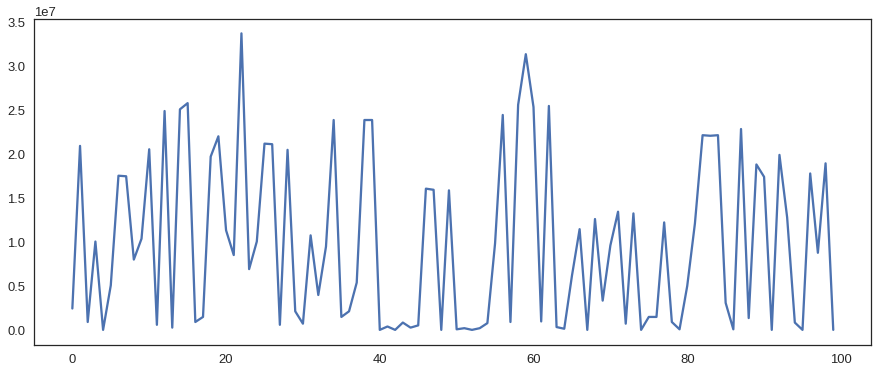

In [36]:
max_volume_trace_L = structural_model_trace_L[:,2]
plt.plot(max_volume_trace_L)

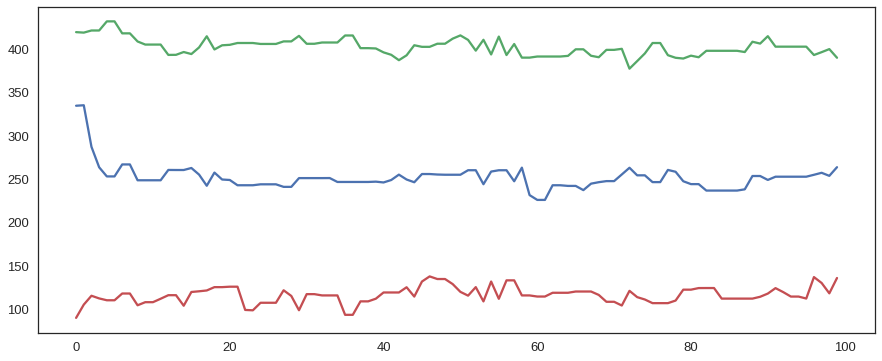

In [37]:
plt.plot(fw_res_th_trace_L)
plt.plot(fw_seal_th_trace_L)
plt.plot(fw_sec_res_th_trace_L)

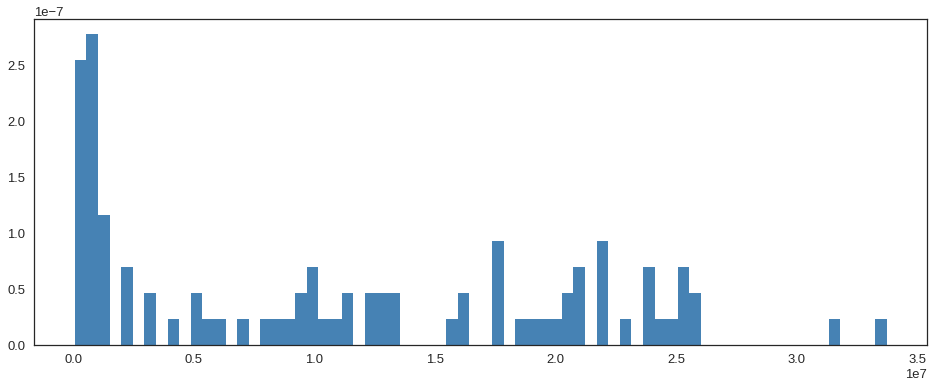

In [38]:
figsize(16, 6)

#_hist1 = plt.hist(max_volume_trace, bins=70, normed=True, histtype="stepfilled",label="prior distribution", color = "steelblue")
volumes = max_volume_trace_L
mask = volumes == 0
masked_trace = volumes[~mask]
#_hist1 = plt.hist(max_volume_trace_L, bins=70, normed=True, histtype="stepfilled",label="prior distribution", color = "forestgreen")
_hist1 = plt.hist(masked_trace, bins=70, normed=True, histtype="stepfilled",label="prior distribution", color = "steelblue")

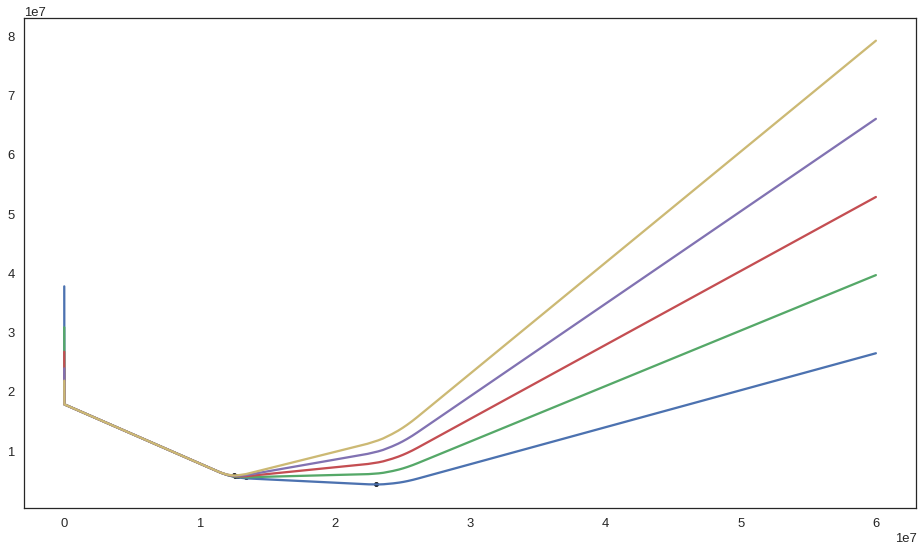

In [81]:
figsize(16, 9)

# No reduced uncertainty, different risks
BA_before = np.zeros_like(risks_s)
EL_before = np.zeros_like(risks_s)
expected_loss = lambda estimate_s, risk_s: volume_lossR(estimate_s, masked_trace, risk_s).mean()

counter = 0
for r in risks_s:
    loss = [expected_loss(e, r) for e in estimates_s]
    _min_score = sop.fmin(expected_loss, -40, args=(r,),disp = False)
    #print(_min_score)
    if _min_score < 0:
        _min_score = 0
    plt.plot(estimates_s, loss, label = "Risk r "+str(r))
    plt.scatter(_min_score, expected_loss(_min_score,r), s = 20, color = 'black')
    #lt.vlines(_min_results, 0, 0.02, color = 'black', linestyles="--")
    #print("Bayes action (minimum) at risk r %.2f: %.2f" % (r, _min_score))
    BA_before[counter] = _min_score
    EL_before[counter] = expected_loss(_min_score,r)
    counter += 1


In [12]:
# DETERMINATION OF LAYER THICKNESSES ON HANGING- AND FOOTWALL BASED ON VOXEL-COUNTING
#fault_block = fault_sol[0,0]
#lith_block = lith_sol[0,0]
#th_factor = scale_factor
#
## Finding fault tips, upper and lower
#def find_fault_tips(fault_block):
#    fault_reshape = fault_block.reshape(50,50,50)
#    upper_fault_tip = np.count_nonzero(fault_reshape[:,25,49])+1
#    lower_fault_tip = np.count_nonzero(fault_reshape[:,25,0])-1
#    return upper_fault_tip, lower_fault_tip
#    
## Footwall thicknesses
#def fw_thicknesses(lith_block, upper_fault_tip, th_factor):
#    lith_reshape = lith_block.reshape(50,50,50)
#    fw_reservoir_count = 0
#    fw_seal_count = 0 
#    fw_sec_res_count = 0 
#    for i in lith_reshape[upper_fault_tip,25,:]:
#        if i == (interp_data.get_formation_number()['Reservoir']):
#            fw_reservoir_count += 1
#            fw_reservoir_thickness = fw_reservoir_count * th_factor
#        elif i == (interp_data.get_formation_number()['Seal']):
#            fw_seal_count += 1
#            fw_seal_thickness = fw_seal_count * th_factor
#        elif i == (interp_data.get_formation_number()['SecondaryReservoir']):
#            fw_sec_res_count += 1
#            fw_sec_res_thickness = fw_sec_res_count * th_factor
#    return fw_reservoir_thickness, fw_seal_thickness, fw_sec_res_thickness
#
## Hanging wall thicknesses
#def hw_thicknesses(lith_block, lower_fault_tip, th_factor):
#    hw_reservoir_count = 0
#    hw_seal_count = 0 
#    hw_sec_res_count = 0 
#    for i in lith_reshape[lower_fault_tip,25,:]:
#        if i == (interp_data.get_formation_number()['Reservoir']):
#            hw_reservoir_count += 1
#            hw_reservoir_thickness = hw_reservoir_count * th_factor
#        elif i == (interp_data.get_formation_number()['Seal']):
#            hw_seal_count += 1
#            hw_seal_thickness = hw_seal_count * th_factor
#        elif i == (interp_data.get_formation_number()['SecondaryReservoir']):
#            hw_sec_res_count += 1
#            hw_sec_res_thickness = hw_sec_res_count * th_factor
#    return hw_reservoir_thickness, hw_seal_thickness, hw_sec_res_thickness

# DETERMINING THICKNESS BASED ON Z-POINT_POSITIONS IN INTERP_DATA

# Footwall at X = 1600 and Y = 1000
#def fw_thicknesses(interp_data):
#    res_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'Reservoir'
#    seal_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'Seal'
#    sec_res_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'SecondaryReservoir'
#    over_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'Overlying'
#    
#    rescale_f = interp_data.rescaling_factor
#    
#    fw_x_cond = interp_data.geo_data_res.interfaces['X'] == (interp_data.extent_rescaled['X'].values[1] - (1400/rescale_f))
#    y_mid = interp_data.geo_data_res.interfaces['Y'] == (interp_data.extent_rescaled['Y'].values[1] - (1000/rescale_f))
#    points_fw = interp_data.geo_data_res.interfaces[fw_x_cond]
#    points_fw = points_fw[y_mid]
#    
#    fw_rb_z = points_fw[res_bot_cond]['Z'].values*rescale_f
#    fw_sb_z = points_fw[seal_bot_cond]['Z'].values*rescale_f
#    fw_r2b_z = points_fw[sec_res_bot_cond]['Z'].values*rescale_f
#    fw_ob_z = points_fw[over_bot_cond]['Z'].values*rescale_f
#    
#    fw_res_th = np.abs(fw_sb_z-fw_rb_z)
#    fw_seal_th = np.abs(fw_r2b_z-fw_sb_z)
#    fw_sec_res_th = np.abs(fw_ob_z-fw_r2b_z)
#    return fw_res_th, fw_seal_th, fw_sec_res_th, fw_rb_z, fw_sb_z, fw_r2b_z, fw_ob_z
#
## Hanging wall at X = 600 and Y = 1000
#def hw_thicknesses(interp_data):
#    res_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'Reservoir'
#    seal_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'Seal'
#    sec_res_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'SecondaryReservoir'
#    over_bot_cond = interp_data.geo_data_res.interfaces['formation'] == 'Overlying'
#    
#    rescale_f = interp_data.rescaling_factor
#    
#    hw_x_cond = interp_data.geo_data_res.interfaces['X'] == (interp_data.extent_rescaled['X'].values[1] - (400/rescale_f))
#    y_mid = interp_data.geo_data_res.interfaces['Y'] == (interp_data.extent_rescaled['Y'].values[1] - (1000/rescale_f))
#    points_hw = interp_data.geo_data_res.interfaces[hw_x_cond]
#    points_hw = points_hw[y_mid]
#    
#    hw_rb_z = points_hw[res_bot_cond]['Z']
#    hw_sb_z = points_hw[seal_bot_cond]['Z']
#    hw_r2b_z = points_hw[sec_res_bot_cond]['Z']
#    hw_ob_z = points_hw[over_bot_cond]['Z']
#    
#    hw_res_th = np.abs(hw_sb_z.values-hw_rb_z.values)*rescale_f
#    hw_seal_th = np.abs(hw_r2b_z.values-hw_sb_z.values)*rescale_f
#    hw_sec_res_th = np.abs(hw_ob_z.values-hw_r2b_z.values)*rescale_f
#    return hw_res_th, hw_seal_th, hw_sec_res_th

# DETERMINING THICKNESS BASED ON Z-POINT_POSITIONS USING GEO_DATA
#res_bot_cond = geo_data.interfaces['formation'] == 'Reservoir'
#seal_bot_cond = geo_data.interfaces['formation'] == 'Seal'
#sec_res_bot_cond = geo_data.interfaces['formation'] == 'SecondaryReservoir'
#over_bot_cond = geo_data.interfaces['formation'] == 'Overlying'
#
#fw_x_cond = geo_data.interfaces['X'] == 1600
#y_mid = geo_data.interfaces['Y'] == 1000
#points_fw = geo_data.interfaces[fw_x_cond]
#points_fw = points_fw[y_mid]
## finding Z-values for each layer bottom
#fw_rb_z = points_fw[res_bot_cond]['Z']
#fw_sb_z = points_fw[seal_bot_cond]['Z']
#fw_r2b_z = points_fw[sec_res_bot_cond]['Z']
#fw_ob_z = points_fw[over_bot_cond]['Z']
#
#fw_res_th = np.abs(fw_sb_z.values-fw_rb_z.values)
#fw_seal_th = np.abs(fw_r2b_z.values-fw_sb_z.values)
#fw_sec_res_th = np.abs(fw_ob_z.values-fw_r2b_z.values)
#
#hw_x_cond = geo_data.interfaces['X'] == 600
#y_mid = geo_data.interfaces['Y'] == 1000
#points_hw = geo_data.interfaces[hw_x_cond]
#points_hw = points_hw[y_mid]
## finding Z-values for each layer bottom
#hw_rb_z = points_hw[res_bot_cond]['Z']
#hw_sb_z = points_hw[seal_bot_cond]['Z']
#hw_r2b_z = points_hw[sec_res_bot_cond]['Z']
#hw_ob_z = points_hw[over_bot_cond]['Z']
#
#hw_res_th = np.abs(hw_sb_z.values-hw_rb_z.values)
#hw_seal_th = np.abs(hw_r2b_z.values-hw_sb_z.values)
#hw_sec_res_th = np.abs(hw_ob_z.values-hw_r2b_z.values)
#
## Footwall
#def fw_thicknesses():
#    fw_x_cond = geo_data.interfaces['X'] == 1600
#    y_mid = geo_data.interfaces['Y'] == 1000
#    points_fw = geo_data.interfaces[fw_x_cond]
#    points_fw = points_fw[y_mid]
#    # finding Z-values for each layer bottom
#    fw_rb_z = points_fw[res_bot_cond]['Z']
#    fw_sb_z = points_fw[seal_bot_cond]['Z']
#    fw_r2b_z = points_fw[sec_res_bot_cond]['Z']
#    fw_ob_z = points_fw[over_bot_cond]['Z']
#    
#    fw_res_th = np.abs(fw_sb_z.values-fw_rb_z.values)
#    fw_seal_th = np.abs(fw_r2b_z.values-fw_sb_z.values)
#    fw_sec_res_th = np.abs(fw_ob_z.values-fw_r2b_z.values)
#
## Hanging wall
#def hw_thicknesses():
#    hw_x_cond = geo_data.interfaces['X'] == 600
#    y_mid = geo_data.interfaces['Y'] == 1000
#    points_hw = geo_data.interfaces[hw_x_cond]
#    points_hw = points_hw[y_mid]
#    # finding Z-values for each layer bottom
#    hw_rb_z = points_hw[res_bot_cond]['Z']
#    hw_sb_z = points_hw[seal_bot_cond]['Z']
#    hw_r2b_z = points_hw[sec_res_bot_cond]['Z']
#    hw_ob_z = points_hw[over_bot_cond]['Z']
#    
#    hw_res_th = np.abs(hw_sb_z.values-hw_rb_z.values)
#    hw_seal_th = np.abs(hw_r2b_z.values-hw_sb_z.values)
#    hw_sec_res_th = np.abs(hw_ob_z.values-hw_r2b_z.values)

In [206]:
#@pymc.deterministic
#def fault_tips(fault_sol=pos_unc_model[1]):
#    fault = fault_sol[0,0]
#    return find_fault_tips(fault)    
#
#@pymc.deterministic
#def fw_th(lith_sol=pos_unc_model[0], upper_fault_tip=fault_tips[0]):
#    lith = lith_sol[0,0]
#    #print("FOOTWALL RES THICKNESS:", fw_thicknesses(lith, upper_fault_tip, th_factor=scale_factor)[0])
#    #print("FOOTWALL SEAL THICKNESS:", fw_thicknesses(lith, upper_fault_tip, th_factor=scale_factor)[1])
#    return fw_thicknesses(lith, upper_fault_tip, th_factor=scale_factor)
#
#@pymc.deterministic
#def hw_th(lith_sol=pos_unc_model[0], lower_fault_tip=fault_tips[1]):
#    lith = lith_sol[0,0]
#    return hw_thicknesses(lith, lower_fault_tip, th_factor=scale_factor)

In [248]:
#a,b = np.gradient(grid_z0, 40.81632614)
#a = np.rot90(a,-1)
#
#asign = np.sign(a)
#asignchange = ((np.roll(asign, 1) - asign) != 0).astype(int)
#
##print(asignchange)
#asignchange2 = ((np.roll(asign, -1) - asign) != 0).astype(int)
#
#
#asc3 = np.logical_or(asignchange, asignchange2)
#
#asc3[:,0]= 0
#asc3[:,1]= 0
#asc3[:,-1] = 0
#asc3[-1,:] = 0
#print(asc3)
#
#bsign = np.sign(b)
#bsignchange = ((np.roll(bsign, 1) - bsign) != 0).astype(int)
#bsignchange2 = ((np.roll(bsign, -1) - bsign) != 0).astype(int)
#
#bsc3 = np.logical_or(bsignchange, bsignchange2)
#
#bsc3[:,0]= 0
#bsc3[:,-1] = 0
#bsc3[:,-2] = 0
#bsc3[:,-3] = 0
#bsc3[-1,:] = 0
##print(bsignchange)
#
#
#asignchange = np.rot90(asignchange,1)
#asc3 = np.rot90(asc3,1)
#
#c = np.logical_and(asc3,bsc3)

[[False False  True False False False False False False False False False
  False False False False False False False False False False False False
  False  True  True False False False False False False False False False
  False False False False False False False False False False False  True
   True False]
 [False False  True False False False False False False False False False
  False False False False False False False False False False False False
  False  True  True False False False False False False False False False
  False False False False False False False False False False  True  True
  False False]
 [False False  True  True False False False False False False False False
  False False False False False False False False False False False False
  False  True  True False False False False False False False False False
  False False False False False False False False False False  True  True
  False False]
 [False False  True  True False False False False False False False

In [333]:
#grad_zero = saddle_p_all == 1
#grid_z0[~grad_zero]= np.nan
#grid_z0

array([[           nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan],
       [           nan,            nan,            nan,            nan,
                   nan,

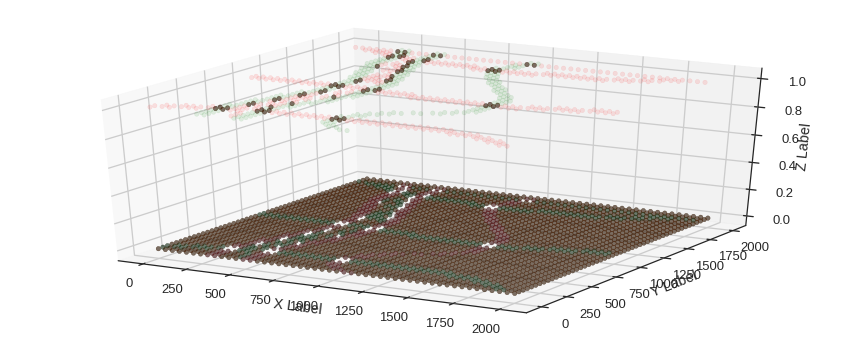

In [249]:
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
##ax.scatter(grid_x, grid_y, grid_z0, c="b", alpha = 0.1)
#ax.scatter(grid_x, grid_y, asc3, c="r", alpha = 0.1)
#ax.scatter(grid_x, grid_y, bsc3, c="g", alpha = 0.1)
#ax.scatter(grid_x, grid_y, c, c="black", alpha = 0.5)
#
#ax.set_xlabel('X Label')
#ax.set_ylabel('Y Label')
#ax.set_zlabel('Z Label')
#
#plt.show()

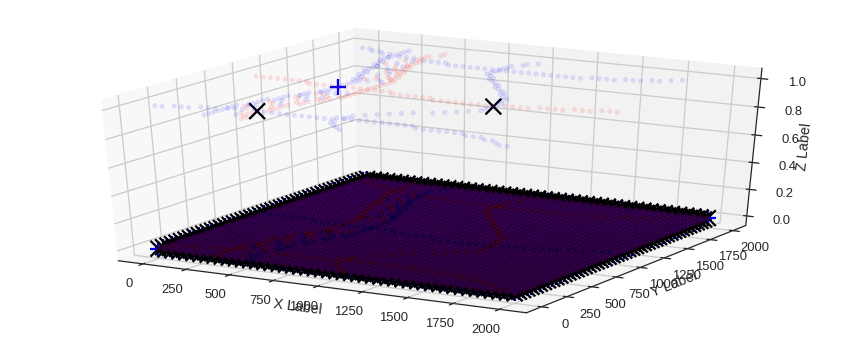

In [372]:
#fault_line = grid_minX[grid_maxX]
#figsize(15,6)
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
##ax.scatter(grid_x, grid_y, grid_z0, c="b", alpha = 0.1)
#ax.scatter(grid_x, grid_y, grid_minY, c="b", alpha = 0.1)
#ax.scatter(grid_x, grid_y, grid_maxY, c="r", alpha = 0.1)
#ax.scatter(grid_x, grid_y, grid_minX, c="b", alpha = 0.1)
#ax.scatter(grid_x, grid_y, grid_maxX, c="r", alpha = 0.1)
#ax.scatter(grid_x, grid_y, spill_points, c="black", alpha = 1, marker='x', s = 250)
#ax.scatter(grid_x, grid_y, leak_point, c="b", alpha = 1, marker='+', s= 250)
#
#ax.set_xlabel('X Label')
#ax.set_ylabel('Y Label')
#ax.set_zlabel('Z Label')
#
#plt.show()

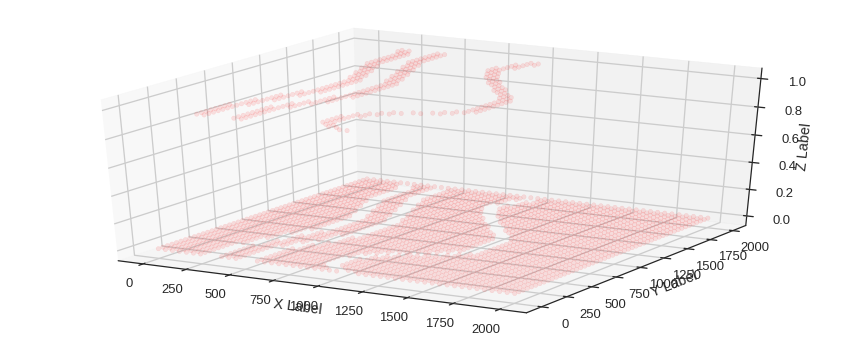

In [245]:
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
##ax.scatter(grid_x, grid_y, grid_z0, c="b", alpha = 0.1)
##ax.scatter(grid_x, grid_y, -a, c="r", alpha = 0.1)
##ax.scatter(grid_x, grid_y, -asignchange, c="g", alpha = 0.1)
#ax.scatter(grid_x, grid_y, bsc3, c="r", alpha = 0.1)
#
#ax.set_xlabel('X Label')
#ax.set_ylabel('Y Label')
#ax.set_zlabel('Z Label')
#
#plt.show()

In [38]:
# SPILL AND LEAK POINT FUNCTIONS

# Finding the spill point
#def spill_point(res_surface):
#    mini = argrelextrema(res_surface[:,2], np.less, order=10)
#    minima = np.array(list(zip(np.take(res_surface[:,1], mini[0]), np.take(res_surface[:,0], mini[0]), np.take(res_surface[:,2], mini[0]))))
#    fault_thresh = minima[:,1] > 700 #taking only relevant side by setting a threshold visually estimated, best: 20
#    spill_min_line = minima[fault_thresh]
#    spill_pos = np.array(np.argmax(spill_min_line[:,2]))
#    spill_z = np.take(spill_min_line[:,2], spill_pos)
#    spill_p = np.array([np.take(spill_min_line[:,1], spill_pos), np.take(spill_min_line[:,0],
#                                spill_pos), np.take(spill_min_line[:,2], spill_pos)])
#    
#    # Horizontal plane defined by z-pos of spill
#    if True:
#        spill_bottom = np.ones_like(res_surface)
#        spill_bottom[:,0] = res_surface[:,0]
#        spill_bottom[:,1] = res_surface[:,1]
#        spill_bottom[:,2] = spill_z    
#    
#    return spill_z, spill_p, spill_min_line, spill_bottom
#
## Finding the leak point ( critically inefficient method! takes 10s!)
#def leak_point(res_surface):
#    counter = 0
#    # Creating empty lists and arrays to save values
#    xvals = []
#    yvals = []
#    zvals = []
#    leak_min = np.empty((0,3), dtype=int)
#    #leak_min = np.empty([3,], dtype=int)
#    
#    for i in np.unique(res_surface[:,1]):
#        
#    #while counter < model_size:
#        #print(counter)
#        for e in res_surface:
#            # Looking at a slice along y-axis for y = e[1] = counter, 
#            # and appending x,y,z-values into lists
#            # This is a way of RESORTING the array as needed
#            #if int(e[1]) == counter:
#            if e[1] == i:
#                xvals.append(e[0])
#                yvals.append(e[1])
#                zvals.append(e[2])
#            
#        # Saving x,y,z-values as lists/arrays      
#        zvals = np.array(zvals)
#        yvals = np.array(yvals)
#        xvals = np.array(xvals)
#
#        # Looking fore minima positions in z-array
#        min_pos = argrelextrema(zvals, np.less, order=10)
#        
#        # Saving x,y,z-positions of minima
#        ypos = yvals[min_pos]
#        xpos = xvals[min_pos]
#        mins = zvals[min_pos]
#        
#        # Condition: Check if any minimum was found and if any data is given at y = counter
#        # If no minimum found, restart loop at next iteration
#        # This way, we can work with the data that coesn't cover every 1 step along the model
#        # (such as the surface vertices)
#        if len(mins) == 0:
#            counter += 1
#            #lists have to be emptied again
#            xvals = []
#            yvals = []
#            zvals = []
#            continue
#        
#        #np.append(leak_min, mins) -----> what did I use this for?
#        
#        # Create and array element to save coordinates of minima
#        mins_pos = np.array(list(zip(xpos, ypos, mins)))
#        # Save minima of slice into array of ALL minima
#        leak_min = np.vstack((leak_min, mins_pos))
#
#        # Empty lists for next iteration
#        xvals = []
#        yvals = []
#        zvals = []
#    
#        counter += 1
#        
#    #leak_min = np.delete(leak_min, 0, 0) #what does this do???
#    
#    # Result of the loop above is one or SEVERAL lines of minima ("leak lines")
#    # only want to look at the line bordering the fault surface
#    # need for a general function/method to limit to only that line!
#    # For now: Taking only relevant side by setting a threshold that is visually estimated
#    near_fault_thresh = leak_min[:,0] < 1500
#    leak_line = leak_min[near_fault_thresh]
#    
#    # The highest point of the leak line is the leak point!
#    leak_pos = np.array(np.argmax(leak_line[:,2]))
#    leak_z = np.take(leak_line[:,2], leak_pos)
#
#    # Full coordinates of the leak point as array element
#    leak_p = np.array([np.take(leak_line[:,1], leak_pos), np.take(leak_line[:,0], leak_pos), np.take(leak_line[:,2], leak_pos)])
#    
#    # Creating a horizontal plane defined by the leak point z-position, in shape of res_surface
#    leak_bottom = np.ones_like(res_surface)
#    leak_bottom[:,0] = res_surface[:,0]
#    leak_bottom[:,1] = res_surface[:,1]
#    leak_bottom[:,2] = leak_z
#   
#    return leak_z, leak_p, leak_line, leak_bottom

### PLOTTING SP, LP and TRAP
#def plot_spill(res_surface, spill_min_line, spill_p):
#    fig = plt.figure()
#    ax = fig.add_subplot(111, projection='3d')
#    ax.scatter(-res_surface[:,1], -res_surface[:,0], res_surface[:,2], c="b", alpha = 0.1)
#    ax.scatter(-spill_min_line[:,0], -spill_min_line[:,1], spill_min_line[:,2], c='r', s = 50)
#    ax.scatter(-spill_p[1], -spill_p[0], spill_p[2], c='yellow', s = 200)
#    
#    ax.set_xlabel('X Label')
#    ax.set_ylabel('Y Label')
#    ax.set_zlabel('Z Label')
#
#    plt.show()
#
#def plot_leak(res_surface, leak_line, leak_p):
#    fig = plt.figure()
#    ax = fig.add_subplot(111, projection='3d')
#    
#    ax.scatter(-res_surface[:,1], -res_surface[:,0], res_surface[:,2], c="b", alpha = 0.1)
#    ax.scatter(-leak_line[:,1], -leak_line[:,0], leak_line[:,2], c='r', s = 50)
#    ax.scatter(-leak_p[1], -leak_p[0], leak_p[2], c='green', s = 200)
#    
#    ax.set_xlabel('X Label')
#    ax.set_ylabel('Y Label')
#    ax.set_zlabel('Z Label')
#    
#    plt.show()
#    
#def plot_trap(res_surface, bottom_surface, spill_p, leak_p):
#    fig = plt.figure()
#    ax = fig.add_subplot(111, projection='3d')
#    ax.scatter(-bottom_surface[:,1], -bottom_surface[:,0], bottom_surface[:,2], c="r", alpha = 0.05)
#    ax.scatter(-res_surface[:,1], -res_surface[:,0], res_surface[:,2], c="b", alpha = 0.1)
#    ax.scatter(-spill_p[1], -spill_p[0], spill_p[2], c='yellow', s = 1000)
#    ax.scatter(-leak_p[1], -leak_p[0], leak_p[2], c='green', s = 1000)
#
#    
#    ax.set_xlabel('X Label')
#    ax.set_ylabel('Y Label')
#    ax.set_zlabel('Z Label')
#    
#    plt.show()

In [62]:
# PYMC MODEL FUNCTIONS 

# Updating of interp_data points with new z-values resulting from z-positional uncertainty
# and including offset uncertainty:
@pymc.deterministic
def interp_unc(value=0, z_unc_secres_top = z_unc_secres_top, z_unc_seal_top=z_unc_seal_top, 
                  z_unc_res_top = z_unc_res_top, z_unc_base_top = z_unc_base_top, off_unc=offset_unc,
               geo_data_stoch_init = geo_data_stoch_init,):
    #print('CHECK0:', res_z)
    new_z_secres_top = sec_res_z + z_unc_secres_top
    new_z_seal_top = seal_z + z_unc_seal_top
    new_z_res_top = res_z + z_unc_res_top
    new_z_base_top = base_z + z_unc_base_top   
    
    # for offset uncertainty: additional change on hanging wall (HW): 
    HW_new_z_secres_top = new_z_secres_top + off_unc
    HW_new_z_seal_top = new_z_seal_top + off_unc
    HW_new_z_res_top = new_z_res_top + off_unc
    HW_new_z_base_top = new_z_base_top + off_unc
    
    print('Z variations top to bottom:', z_unc_secres_top*rescale_f, 
          z_unc_seal_top*rescale_f, z_unc_res_top*rescale_f, z_unc_base_top*rescale_f)
    
    print('Fault offset variation:', off_unc*rescale_f)
    #print('CHECK1:', new_z_res_top)
    #print('CHECK2:', HW_new_z_res_top)
    
    geo_data_stoch = gp.get_data(geo_data_stoch_init, numeric=True)
    
    # FOOTWALL UNCERTAINTY
    interp_data.geo_data_res.interfaces.set_value(secres_top_cond,'Z',new_z_secres_top)
    interp_data.geo_data_res.interfaces.set_value(seal_top_cond,'Z',new_z_seal_top)
    interp_data.geo_data_res.interfaces.set_value(res_top_cond,'Z',new_z_res_top)
    interp_data.geo_data_res.interfaces.set_value(base_top_cond,'Z',new_z_base_top)
    
    # HANGING WALL UNCERTAINTY (incl. offset)
    interp_data.geo_data_res.interfaces.set_value(HW_secres_top,'Z',HW_new_z_secres_top)
    interp_data.geo_data_res.interfaces.set_value(HW_seal_top,'Z',HW_new_z_seal_top)
    interp_data.geo_data_res.interfaces.set_value(HW_res_top,'Z',HW_new_z_res_top)
    interp_data.geo_data_res.interfaces.set_value(HW_base_top,'Z',HW_new_z_base_top)
    
    #print('CHECK3:', interp_data.geo_data_res.interfaces)    
    return interp_data

# Calculating formation thickness based on z-difference between a bottom and top point on the footwall (fw)

# This is done using interp_data, where X,Y and Z-values are rescaled according to the rescaling_factor.
# Value[1] of extent_rescaled equals the maximum extent of model (here: 2000).
# So if we want to find the rescaled chosen X-position (here: 1100), 
# we simply calculate 2000-fw_th_point(here:900) rescaled (see fw_x)
# Y_mid defines that we are looking at a central position (in y-direction) in the model.
# The difference in z between two points has to be rescaled to the original scale again.
rescale_f = interp_data.rescaling_factor

# Reservoir thickness
@pymc.deterministic
def res_th(interp_data=interp_unc):
#       fw_x = interp_unc[0][:, 0] == (interp_data.geo_data_res.extent[1] - (fw_th_point/rescale_f))
#     y_mid = interp_unc[0][:, 1] == (interp_data.geo_data_res.extent[3] - (1000/rescale_f))
    
    fw_x = interp_data.geo_data_res.interfaces['X'] == (interp_data.geo_data_res.extent[1] - (fw_th_point/rescale_f))
    y_mid = interp_data.geo_data_res.interfaces['Y'] == (interp_data.geo_data_res.extent[3] - (1000/rescale_f))
    points_fw = interp_data.geo_data_res.interfaces[fw_x]
    print(points_fw)
    points_fw = points_fw[y_mid]    
    print(points_fw, y_mid)

    fw_rb_z = points_fw[base_top_cond]['Z'].values*rescale_f
    fw_sb_z = points_fw[res_top_cond]['Z'].values*rescale_f
    return np.abs(fw_sb_z-fw_rb_z)

#Seal thickness
@pymc.deterministic
def seal_th(interp_data=interp_unc):
    fw_x = interp_data.geo_data_res.interfaces['X'] == (interp_data.extent_rescaled['X'].values[1] - (fw_th_point/rescale_f))
    y_mid = interp_data.geo_data_res.interfaces['Y'] == (interp_data.extent_rescaled['Y'].values[1] - (1000/rescale_f))
    points_fw = interp_data.geo_data_res.interfaces[fw_x]
    points_fw = points_fw[y_mid] 
    fw_r2b_z = points_fw[seal_top_cond]['Z'].values*rescale_f
    fw_sb_z = points_fw[res_top_cond]['Z'].values*rescale_f
    return np.abs(fw_r2b_z-fw_sb_z)

# Secondary reservoir thickness
@pymc.deterministic
def sec_res_th(interp_data=interp_unc):
    fw_x = interp_data.geo_data_res.interfaces['X'] == (interp_data.extent_rescaled['X'].values[1] - (fw_th_point/rescale_f))
    y_mid = interp_data.geo_data_res.interfaces['Y'] == (interp_data.extent_rescaled['Y'].values[1] - (1000/rescale_f))
    points_fw = interp_data.geo_data_res.interfaces[fw_x]
    points_fw = points_fw[y_mid] 
    fw_r2b_z = points_fw[seal_top_cond]['Z'].values*rescale_f
    fw_ob_z = points_fw[secres_top_cond]['Z'].values*rescale_f
    return np.abs(fw_ob_z-fw_r2b_z)

# Volumetric calculation 
@pymc.deterministic
def structural_model(interp_data_M=interp_unc, fault_sealing=fault_sealing, ash=array_shapeholder):
    print('Fault sealing =', fault_sealing)
    try:
        lith_sol, fault_sol = gp.compute_model(interp_data_M)
        lith_block = lith_sol[0]
        fault_block = fault_sol[0]  
        res_top_surf, res_top_surf_simp = gp.get_surfaces(
                                              interp_data = interp_data_M, potential_lith=lith_sol[1], 
            potential_fault=fault_sol[1], n_formation = interp_data.get_formation_number()['Res_Top'])
        max_vol, lith_sol[0], bottom, trap = max_trap_vol(interp_data_M, lith_block, fault_block, res_top_surf, fault_sealing)
        print("Maximum reservoir volume: %s m³" % max_vol)
        #gp.plot_section(geo_data, lith_sol[0,0], 5, plot_data =1)
        gp.plot_section(geo_data, lith_sol[0], 25, plot_data =1)
        #gp.plot_section(geo_data, lith_sol[0,0], 45, plot_data =1)
        gp.plot_section(geo_data, trap, 25, plot_data =1)
        return lith_sol, fault_sol, max_vol, trap
    except np.linalg.linalg.LinAlgError as err:
        print('LinAlgError occurred!')
        max_vol = -9999999
        lith_sol = ash
        fault_sol = ash
        trap = ash[0]
        return lith_sol, fault_sol, max_vol, trap
        
# Avoid layer inversion by giving negative thicknesses a likelihood of zero
#@pymc.deterministic
#def no_inversion(sec_res_th=sec_res_th, res_th=res_th, seal_th=seal_th)

Z variations top to bottom: 10.5459642952 25.6504784651 12.5337776118 -4.63730193962
Fault offset variation: 103.611636694
           X       Y         Z   formation series  order_series  isFault  \
8   0.565889  0.5001  0.634454  SecRes_Top   Rest             2    False   
21  0.565889  0.5001  0.612113    Seal_Top   Rest             2    False   
38  0.565889  0.5001  0.503398     Res_Top   Rest             2    False   
53  0.565889  0.5001  0.419932    Base_Top   Rest             2    False   

    formation number                        annotations fault side  
8                  2   ${\bf{x}}_{\alpha \,{\bf{2}},3}$   footwall  
21                 3   ${\bf{x}}_{\alpha \,{\bf{3}},8}$   footwall  
38                 4  ${\bf{x}}_{\alpha \,{\bf{4}},12}$   footwall  
53                 5  ${\bf{x}}_{\alpha \,{\bf{5}},10}$   footwall  
           X       Y         Z   formation series  order_series  isFault  \
8   0.565889  0.5001  0.634454  SecRes_Top   Rest             2    False   

/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:65: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:68: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/home/miguel/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:69: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


TypeError: 'NoneType' object is not subscriptable